In [6]:
import csv
import pandas as pd

# Charger les données avec la bibliothèque csv
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        classes.append(row[-1].strip())  # Ajouter la classe (avec suppression des espaces)
        # Calculer la longueur du signal (exclure la colonne de classe et les zéros)
        data.append(len([x for x in row[:-1] if x.strip() != '' and x.strip() != '0']))

# Convertir les données en DataFrame
df = pd.DataFrame({'Classe': classes, 'Length': data})

# Nettoyer la colonne Classe (convertir en entiers ou exclure les valeurs invalides)
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')  # Convertir en numérique (NaN pour les valeurs invalides)
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)  # Convertir en entiers

# Calculer la longueur moyenne par classe
length_by_class = df.groupby('Classe')['Length'].mean()

# Afficher les résultats
print("Longueur moyenne des ECG par classe :")
print(length_by_class)


Longueur moyenne des ECG par classe :
Classe
0    110.759518
1    114.165167
2    117.896213
3     78.458281
4    118.330763
Name: Length, dtype: float64


In [32]:
import csv
import pandas as pd

# Charger les données avec la bibliothèque csv
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        classes.append(row[-1].strip())  # Ajouter la classe (avec suppression des espaces)
        # Calculer la longueur du signal (exclure la colonne de classe et les zéros)
        data.append(len([x for x in row[:-1] if x.strip() != '' and x.strip() != '0']))

# Convertir les données en DataFrame
df = pd.DataFrame({'Classe': classes, 'Length': data})

# Nettoyer la colonne Classe (convertir en entiers ou exclure les valeurs invalides)
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')  # Convertir en numérique (NaN pour les valeurs invalides)
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)  # Convertir en entiers

# Calculer les statistiques par classe
stats_by_class = df.groupby('Classe')['Length'].agg(
    mean_length='mean',         # Longueur moyenne
    std_length='std',           # Écart type
    min_length='min',           # Longueur minimale
    max_length='max',           # Longueur maximale
    range_length=lambda x: x.max() - x.min()  # Étendue (max - min)
)

# Afficher les résultats
print("Statistiques des longueurs des ECG par classe :")
print(stats_by_class)


Statistiques des longueurs des ECG par classe :
        mean_length  std_length  min_length  max_length  range_length
Classe                                                               
0        110.759518   27.174100          10         187           177
1        114.165167   39.059540          22         187           165
2        117.896213   35.032900          14         187           173
3         78.458281   13.766731          29         187           158
4        118.330763    9.589403          31         183           152


In [43]:
import csv
import pandas as pd

# Charger les données avec la bibliothèque csv
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        classes.append(row[-1].strip())  # Ajouter la classe (avec suppression des espaces)
        # Calculer la longueur du signal en excluant les 5 premières colonnes et la colonne de classe
        data.append(len([x for x in row[5:-1] if x.strip() != '' and x.strip() != '0']))

# Convertir les données en DataFrame
df = pd.DataFrame({'Classe': classes, 'Length': data})

# Nettoyer la colonne Classe (convertir en entiers ou exclure les valeurs invalides)
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')  # Convertir en numérique (NaN pour les valeurs invalides)
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)  # Convertir en entiers

# Calculer les statistiques par classe
stats_by_class = df.groupby('Classe')['Length'].agg(
    mean_length='mean',         # Longueur moyenne
    std_length='std',           # Écart type
    var_length='var',           # Variance
    min_length='min',           # Longueur minimale
    max_length='max',           # Longueur maximale
    range_length=lambda x: x.max() - x.min()  # Étendue (max - min)
)

# Afficher les résultats
print("Statistiques des longueurs des ECG par classe (après suppression des 5 premières colonnes) :")
print(stats_by_class)


Statistiques des longueurs des ECG par classe (après suppression des 5 premières colonnes) :
        mean_length  std_length   var_length  min_length  max_length  \
Classe                                                                 
0        105.759518   27.174100   738.431692           5         182   
1        109.165167   39.059540  1525.647656          17         182   
2        112.896213   35.032900  1227.304085           9         182   
3         73.458281   13.766731   189.522883          24         182   
4        113.330763    9.589403    91.956644          26         178   

        range_length  
Classe                
0                177  
1                165  
2                173  
3                158  
4                152  


In [53]:
import csv
import pandas as pd

# Chemin du fichier
file_path = 'cleaned_mitbih_fus.csv'

# Lire les données ligne par ligne en tant que liste avec csv.reader
rows = []
with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        rows.append(row)

# Convertir en DataFrame sans normaliser la longueur des lignes
data = pd.DataFrame(rows)

# Fréquence d'échantillonnage
sampling_frequency = 360

# Calculer le BPM pour chaque ligne
bpm_results = []
classes = []

for row in rows:
    if len(row) > 6:  # Vérifier que la ligne a au moins 6 colonnes (5 premières inutiles + 1 classe)
        ecg_signals = row[5:-1]  # Exclure les 5 premières colonnes et la dernière
        row_length = len([value for value in ecg_signals if value])  # Compter les valeurs non nulles ou non vides
        bpm = (sampling_frequency * 60) / row_length if row_length > 0 else None
        bpm_results.append(bpm)
        classes.append(row[-1])  # La dernière colonne est la classe
    else:
        bpm_results.append(None)
        classes.append(None)

# Créer un DataFrame pour les résultats
results_df = pd.DataFrame({
    'Class': classes,
    'BPM': bpm_results
})

# Supprimer les lignes où la classe ou le BPM est absent
results_df = results_df.dropna()

# Nettoyer la colonne 'Class' et la convertir en entier
results_df['Class'] = results_df['Class'].apply(lambda x: int(float(x)) if isinstance(x, str) else int(x))

# Calculer la moyenne des BPM par classe
average_bpm_per_class = results_df.groupby('Class')['BPM'].mean()

# Afficher les résultats
print("Moyenne des BPM par classe :")
print(average_bpm_per_class)

# Sauvegarder les résultats dans un fichier CSV
output_path = 'average_bpm_per_class.csv'
average_bpm_per_class.to_csv(output_path, header=['Average_BPM'])

print(f"Les moyennes des BPM par classe ont été enregistrées dans le fichier '{output_path}'.")


Moyenne des BPM par classe :
Class
0    219.837995
1    230.548438
2    214.791610
3    305.477646
4    193.092845
Name: BPM, dtype: float64
Les moyennes des BPM par classe ont été enregistrées dans le fichier 'average_bpm_per_class.csv'.


In [51]:
# Données actuelles
current_fs = 360  # Fréquence d'échantillonnage supposée initiale
current_bpm_class_0 = 219.837995  # BPM actuel de la classe 0
desired_bpm_class_0 = 70  # BPM réaliste pour une personne saine

# Nombre d'échantillons par battement pour la classe 0 avec fs actuel
samples_per_beat = (current_fs * 60) / current_bpm_class_0

# Nouvelle fréquence d'échantillonnage pour un BPM réaliste
new_fs = (desired_bpm_class_0 * samples_per_beat) / 60

print(f"Nombre d'échantillons par battement : {samples_per_beat:.2f}")
print(f"Nouvelle fréquence d'échantillonnage nécessaire : {new_fs:.2f} Hz")


Nombre d'échantillons par battement : 98.25
Nouvelle fréquence d'échantillonnage nécessaire : 114.63 Hz


In [55]:
import csv
import pandas as pd

# Chemin du fichier
file_path = 'cleaned_mitbih_fus.csv'

# Lire le fichier ligne par ligne
rows = []
with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        rows.append(row)

# Fréquence d'échantillonnage
sampling_frequency = 120

# Calculer le BPM pour chaque ligne
bpm_results = []

for row in rows:
    if len(row) > 6:  # Vérifier que la ligne contient suffisamment de colonnes (au moins 5 inutiles + signaux ECG)
        ecg_signals = row[5:-1]  # Exclure les 5 premières colonnes et la dernière
        row_length = len([value for value in ecg_signals if value])  # Compter les valeurs valides (non nulles ou non vides)
        bpm = (sampling_frequency * 60) / row_length if row_length > 0 else None
        bpm_results.append(bpm)
    else:
        bpm_results.append(None)

# Créer un DataFrame pour les résultats
results_df = pd.DataFrame({
    'BPM': bpm_results
})

# Sauvegarder les BPM dans un fichier CSV
output_path = 'bpm_per_line.csv'
results_df.to_csv(output_path, index=False)

print(f"Les BPM par ligne ont été enregistrés dans le fichier '{output_path}'.")


Les BPM par ligne ont été enregistrés dans le fichier 'bpm_per_line.csv'.


/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/1782991680.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_data = df.groupby('Class').apply(lambda x: x.sample(1)).reset_index(drop=True)


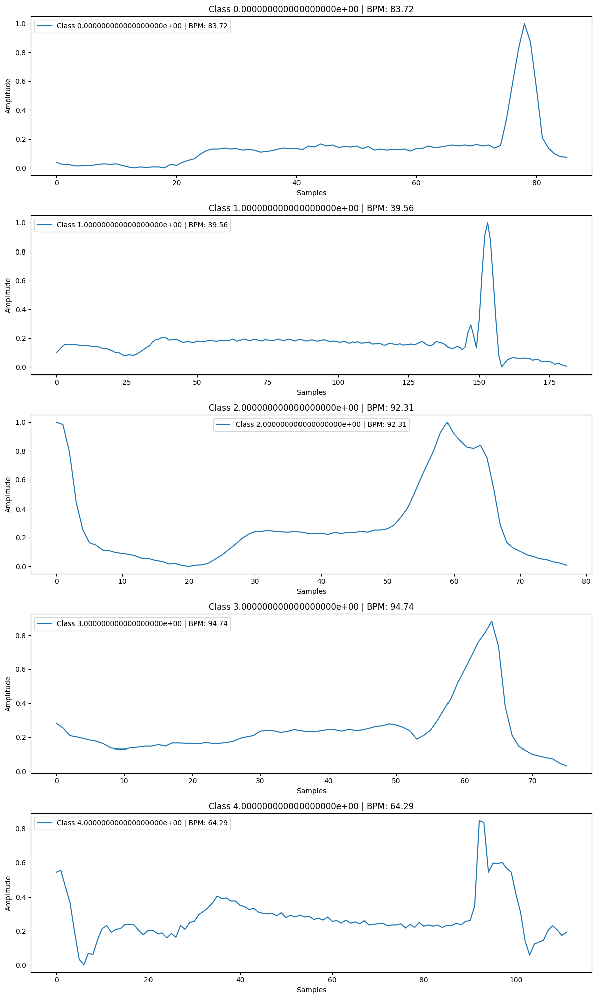

In [57]:
import csv
import pandas as pd
import matplotlib.pyplot as plt
import random

# Chemin du fichier
file_path = 'cleaned_mitbih_fus.csv'

# Lire le fichier ligne par ligne
rows = []
with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        rows.append(row)

# Fréquence d'échantillonnage
sampling_frequency = 120

# Préparer les données
data = []
for row in rows:
    if len(row) > 6:  # Vérifier que la ligne contient suffisamment de colonnes (au moins 5 inutiles + 1 classe)
        ecg_signals = row[5:-1]  # Exclure les 5 premières colonnes et la dernière
        ecg_signals = [float(value) for value in ecg_signals if value]  # Convertir les signaux en float
        if ecg_signals:
            bpm = (sampling_frequency * 60) / len(ecg_signals)  # Calcul du BPM
            data.append({
                'ECG': ecg_signals,
                'Class': row[-1],
                'BPM': bpm
            })

# Convertir en DataFrame pour faciliter le traitement
df = pd.DataFrame(data)

# Choisir une personne au hasard dans chaque classe
unique_classes = df['Class'].unique()
sampled_data = df.groupby('Class').apply(lambda x: x.sample(1)).reset_index(drop=True)

# Afficher les courbes ECG
plt.figure(figsize=(12, len(unique_classes) * 4))
for i, row in sampled_data.iterrows():
    plt.subplot(len(unique_classes), 1, i + 1)
    plt.plot(row['ECG'], label=f"Class {row['Class']} | BPM: {row['BPM']:.2f}")
    plt.title(f"Class {row['Class']} | BPM: {row['BPM']:.2f}")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude")
    plt.legend()

plt.tight_layout()
plt.show()


In [61]:
import csv
import pandas as pd

# Chemin du fichier
file_path = 'cleaned_mitbih_fus.csv'

# Lire les données ligne par ligne en tant que liste avec csv.reader
rows = []
with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        rows.append(row)

# Convertir en DataFrame sans normaliser la longueur des lignes
data = pd.DataFrame(rows)

# Fréquence d'échantillonnage
sampling_frequency = 120

# Calculer le BPM pour chaque ligne
bpm_results = []
classes = []

for row in rows:
    if len(row) > 6:  # Vérifier que la ligne a au moins 6 colonnes (5 premières inutiles + 1 classe)
        ecg_signals = row[5:-1]  # Exclure les 5 premières colonnes et la dernière
        row_length = len([value for value in ecg_signals if value])  # Compter les valeurs non nulles ou non vides
        bpm = (sampling_frequency * 60) / row_length if row_length > 0 else None
        bpm_results.append(bpm)
        classes.append(row[-1])  # La dernière colonne est la classe
    else:
        bpm_results.append(None)
        classes.append(None)

# Créer un DataFrame pour les résultats
results_df = pd.DataFrame({
    'Class': classes,
    'BPM': bpm_results
})

# Supprimer les lignes où la classe ou le BPM est absent
results_df = results_df.dropna()

# Nettoyer la colonne 'Class' et la convertir en entier
results_df['Class'] = results_df['Class'].apply(lambda x: int(float(x)) if isinstance(x, str) else int(x))

# Calculer la moyenne des BPM par classe
average_bpm_per_class = results_df.groupby('Class')['BPM'].mean()

# Afficher les résultats
print("Moyenne des BPM par classe :")
print(average_bpm_per_class)

# Sauvegarder les résultats dans un fichier CSV
output_path = 'average_bpm_per_class.csv'
average_bpm_per_class.to_csv(output_path, header=['Average_BPM'])

print(f"Les moyennes des BPM par classe ont été enregistrées dans le fichier '{output_path}'.")


Moyenne des BPM par classe :
Class
0     73.279332
1     76.849479
2     71.597203
3    101.825882
4     64.364282
Name: BPM, dtype: float64
Les moyennes des BPM par classe ont été enregistrées dans le fichier 'average_bpm_per_class.csv'.


/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/2024412515.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_data = df.groupby('Class').apply(lambda x: x.sample(1)).reset_index(drop=True)


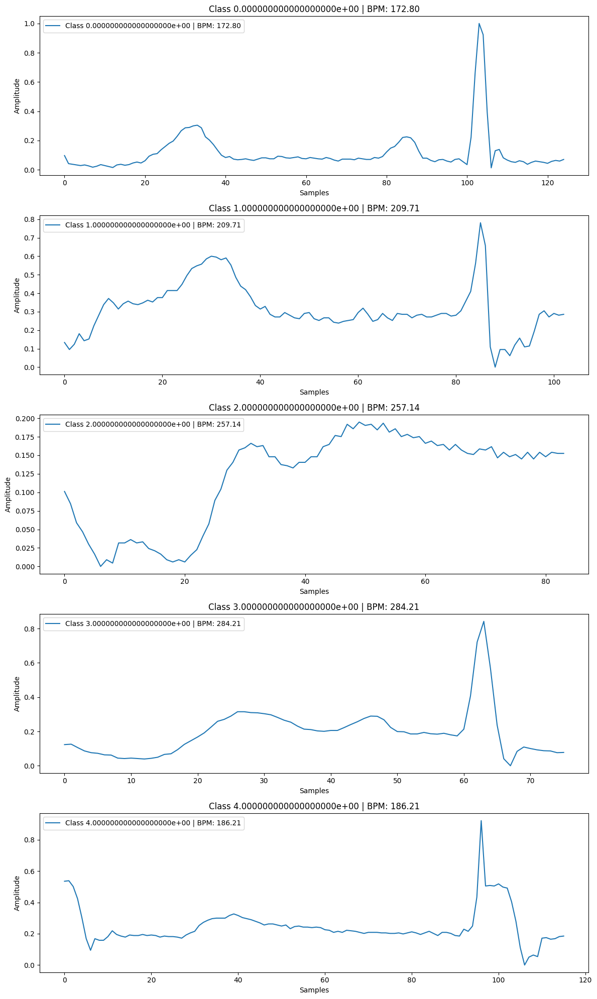

In [50]:
import csv
import pandas as pd
import matplotlib.pyplot as plt
import random

# Chemin du fichier
file_path = 'cleaned_mitbih_fus.csv'

# Lire le fichier ligne par ligne
rows = []
with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        rows.append(row)

# Fréquence d'échantillonnage
sampling_frequency = 360

# Préparer les données
data = []
for row in rows:
    if len(row) > 6:  # Vérifier que la ligne contient suffisamment de colonnes (au moins 5 inutiles + 1 classe)
        ecg_signals = row[5:-1]  # Exclure les 5 premières colonnes et la dernière
        ecg_signals = [float(value) for value in ecg_signals if value]  # Convertir les signaux en float
        if ecg_signals:
            bpm = (sampling_frequency * 60) / len(ecg_signals)  # Calcul du BPM
            data.append({
                'ECG': ecg_signals,
                'Class': row[-1],
                'BPM': bpm
            })

# Convertir en DataFrame pour faciliter le traitement
df = pd.DataFrame(data)

# Choisir une personne au hasard dans chaque classe
unique_classes = df['Class'].unique()
sampled_data = df.groupby('Class').apply(lambda x: x.sample(1)).reset_index(drop=True)

# Afficher les courbes ECG
plt.figure(figsize=(12, len(unique_classes) * 4))
for i, row in sampled_data.iterrows():
    plt.subplot(len(unique_classes), 1, i + 1)
    plt.plot(row['ECG'], label=f"Class {row['Class']} | BPM: {row['BPM']:.2f}")
    plt.title(f"Class {row['Class']} | BPM: {row['BPM']:.2f}")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude")
    plt.legend()

plt.tight_layout()
plt.show()



--- Résultats avec fréquence d'échantillonnage : 360 Hz ---
Classe du signal : 0
Longueur du signal (échantillons) : 119
Durée du signal : 0.33 secondes
BPM estimé : 181.51


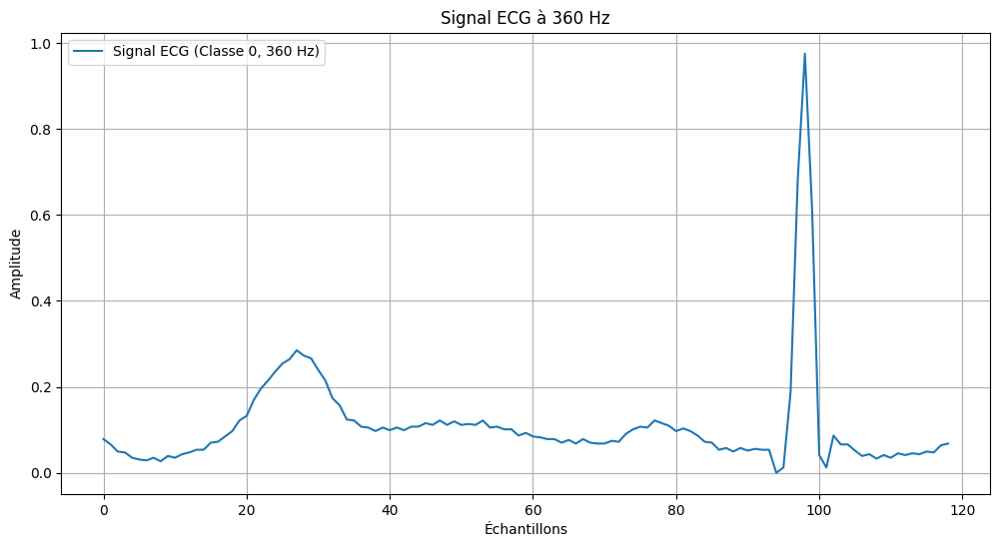


--- Résultats avec fréquence d'échantillonnage : 200 Hz ---
Classe du signal : 0
Longueur du signal (échantillons) : 119
Durée du signal : 0.59 secondes
BPM estimé : 100.84


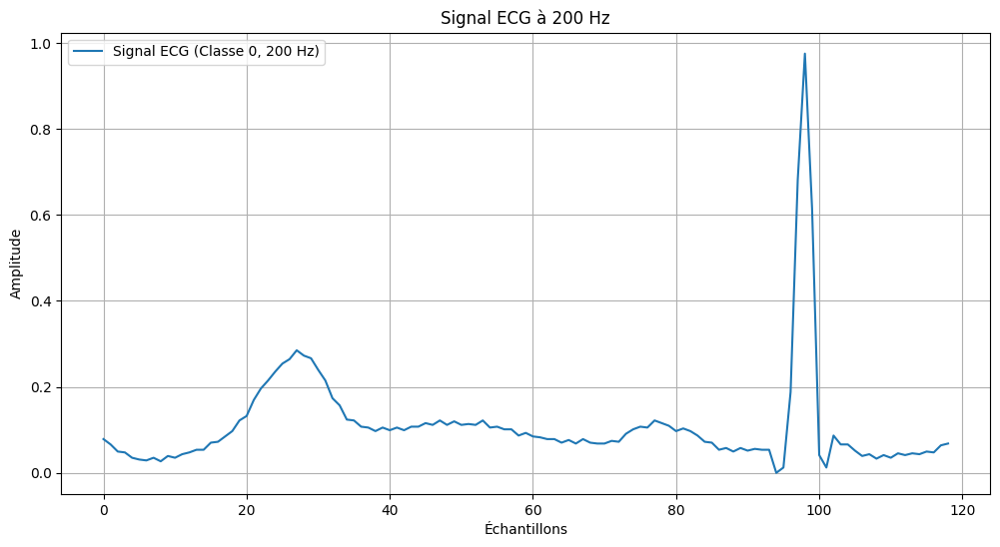


--- Résultats avec fréquence d'échantillonnage : 100 Hz ---
Classe du signal : 0
Longueur du signal (échantillons) : 119
Durée du signal : 1.19 secondes
BPM estimé : 50.42


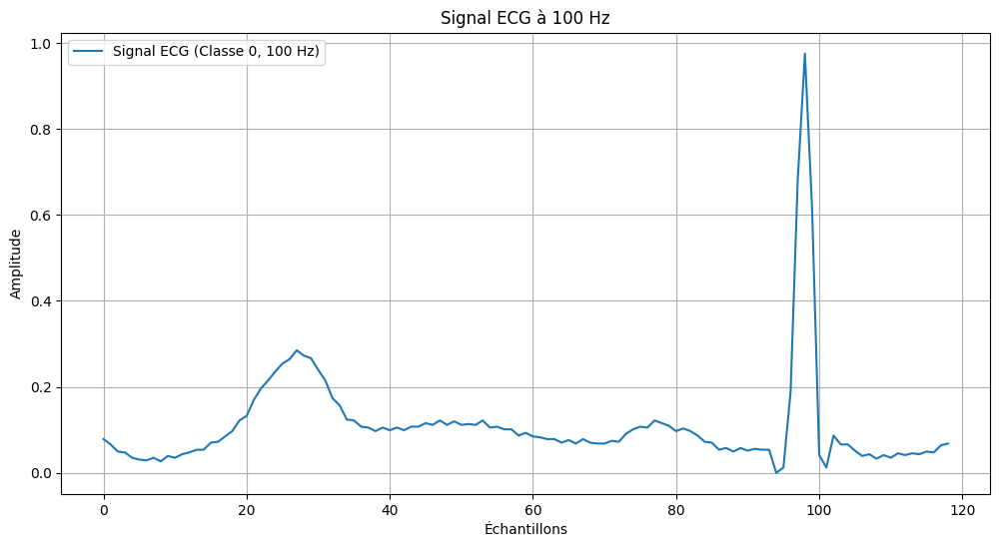

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Charger les données
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []

# Lire les données
with open(file_path, 'r') as file:
    for row in file:
        values = row.strip().split(',')
        classes.append(values[-1].strip())  # Dernière colonne = Classe
        # Exclure les 5 premières colonnes et conserver les colonnes restantes
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[5:-1]])

# Convertir en DataFrame
df = pd.DataFrame(data)
df['Classe'] = pd.to_numeric(classes, errors='coerce')  # Convertir la colonne Classe en numérique

# Supprimer les lignes invalides
df = df.dropna(subset=['Classe']).reset_index(drop=True)

# Sélectionner une donnée au hasard
index = 0  # Vous pouvez modifier cet index
selected_signal = np.array(df.iloc[index, :-1].dropna())  # Signal sans NaN
selected_class = int(df.iloc[index, -1])  # Classe associée

# Fréquence d'échantillonnage (ajustable)
fs_options = [360, 200, 100]  # Fréquences possibles

for fs in fs_options:
    # Calculer la longueur du signal en secondes et le BPM
    signal_duration_sec = len(selected_signal) / fs
    bpm = 60 / signal_duration_sec

    # Afficher les résultats pour chaque fréquence
    print(f"\n--- Résultats avec fréquence d'échantillonnage : {fs} Hz ---")
    print(f"Classe du signal : {selected_class}")
    print(f"Longueur du signal (échantillons) : {len(selected_signal)}")
    print(f"Durée du signal : {signal_duration_sec:.2f} secondes")
    print(f"BPM estimé : {bpm:.2f}")

    # Tracer le signal
    plt.figure(figsize=(12, 6))
    plt.plot(selected_signal, label=f'Signal ECG (Classe {selected_class}, {fs} Hz)')
    plt.title(f"Signal ECG à {fs} Hz")
    plt.xlabel("Échantillons")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.legend()
    plt.show()


In [30]:
import pandas as pd
import numpy as np
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe (label)
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Calcul de la variance des longueurs des signaux pour chaque classe
length_variances = {}
classes = df['Classe'].unique()

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    # Calculer les longueurs des signaux (en comptant les non-NaN par ligne)
    signal_lengths = [len(row[~np.isnan(row)]) for row in class_data]
    length_variances[cls] = np.var(signal_lengths)  # Variance des longueurs au sein de la classe

# Afficher les variances des longueurs pour chaque classe
print("Variance des longueurs des signaux ECG au sein de chaque classe :")
for cls, var in length_variances.items():
    print(f"Classe {cls}: Variance des longueurs = {var:.6f}")


Chargement des données: 109446it [00:02, 38317.16it/s]
Traitement des classes: 100%|██████████| 5/5 [00:00<00:00, 34.35it/s]

Variance des longueurs des signaux ECG au sein de chaque classe :
Classe 0: Variance des longueurs = 738.423540
Classe 1: Variance des longueurs = 1525.098664
Classe 2: Variance des longueurs = 1227.134474
Classe 3: Variance des longueurs = 189.286865
Classe 4: Variance des longueurs = 91.945205


In [28]:
import pandas as pd
import numpy as np

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in file:
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[:-1]])  # Signaux

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Supprimer les cinq premières colonnes
df = df.iloc[:, 5:]  # Conserver les colonnes à partir de la 6e
df['Classe'] = classes  # Réinsérer la colonne Classe

# Calculer la moyenne des signaux pour chaque ligne (en ignorant les NaN)
df['Moyenne_sujet'] = df.drop(columns=['Classe']).mean(axis=1, skipna=True)

# Calculer la moyenne globale par groupe
moyenne_par_groupe = df.groupby('Classe')['Moyenne_sujet'].mean()

# Afficher les résultats
print("Moyenne globale des signaux ECG par groupe :")
print(moyenne_par_groupe)


Moyenne globale des signaux ECG par groupe :
Classe
0.000000000000000000e+00    0.261040
1.000000000000000000e+00    0.318326
2.000000000000000000e+00    0.391545
3.000000000000000000e+00    0.225749
4.000000000000000000e+00    0.384997
Name: Moyenne_sujet, dtype: float64


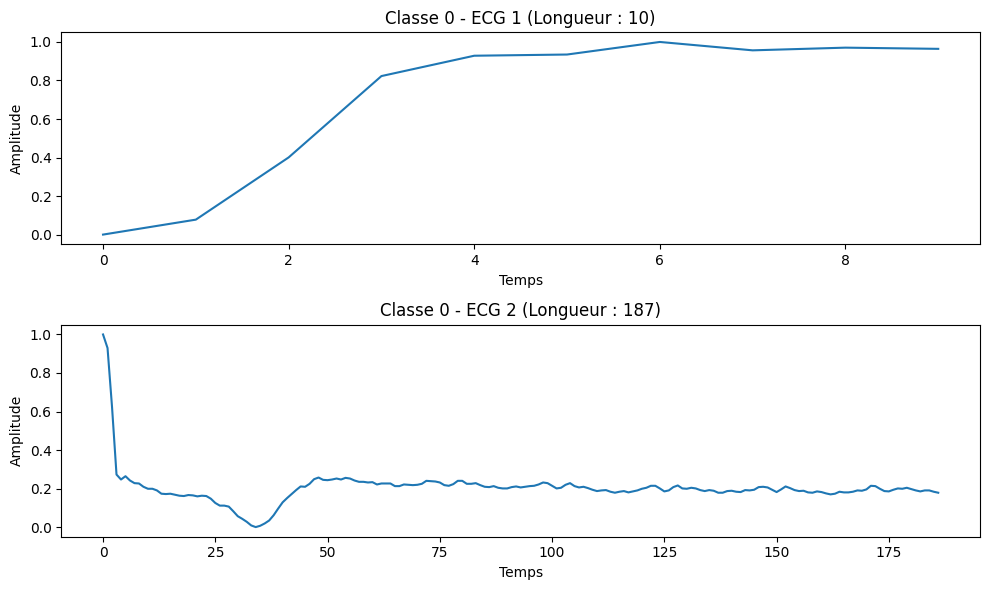

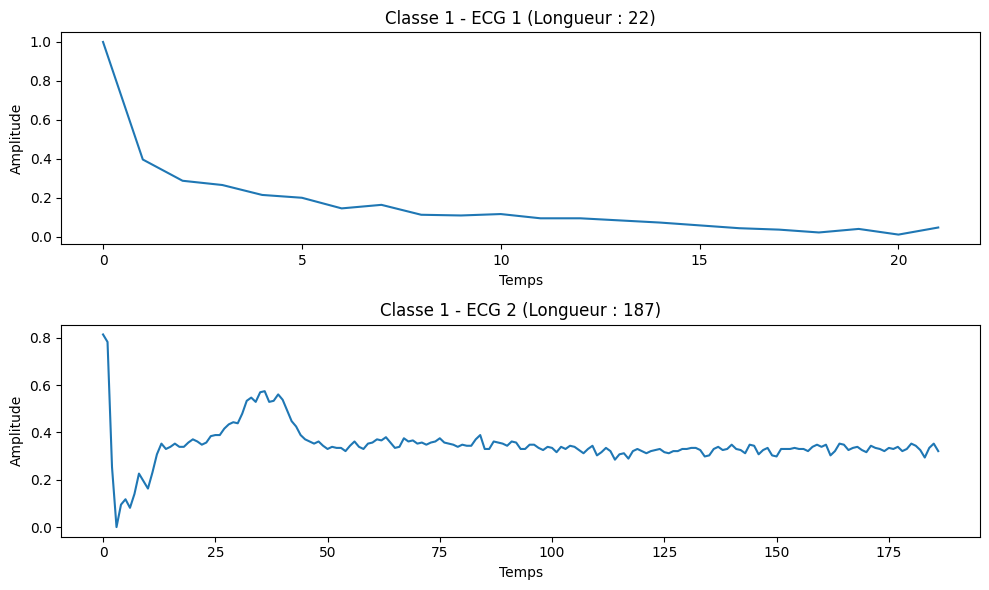

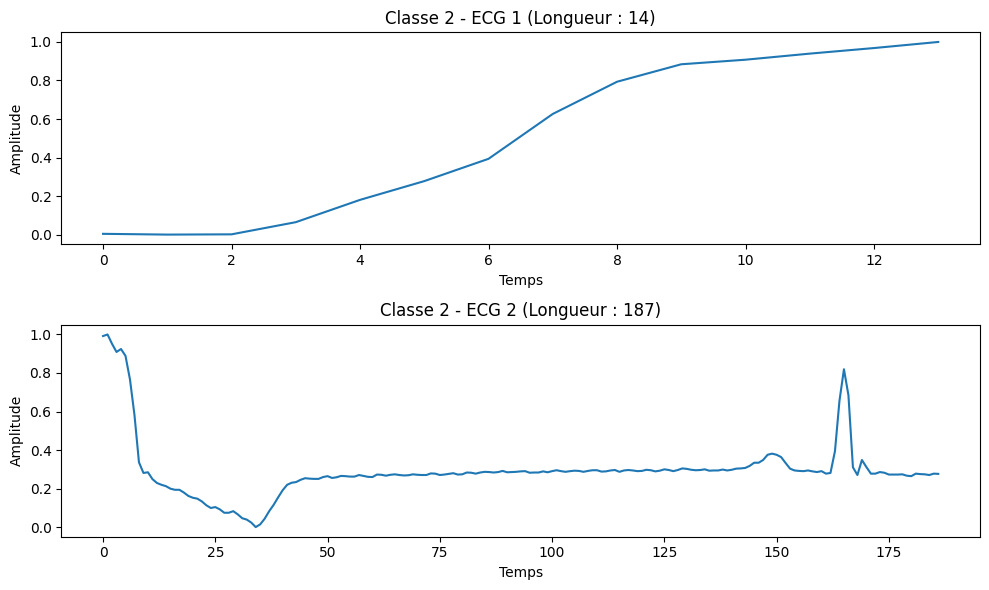

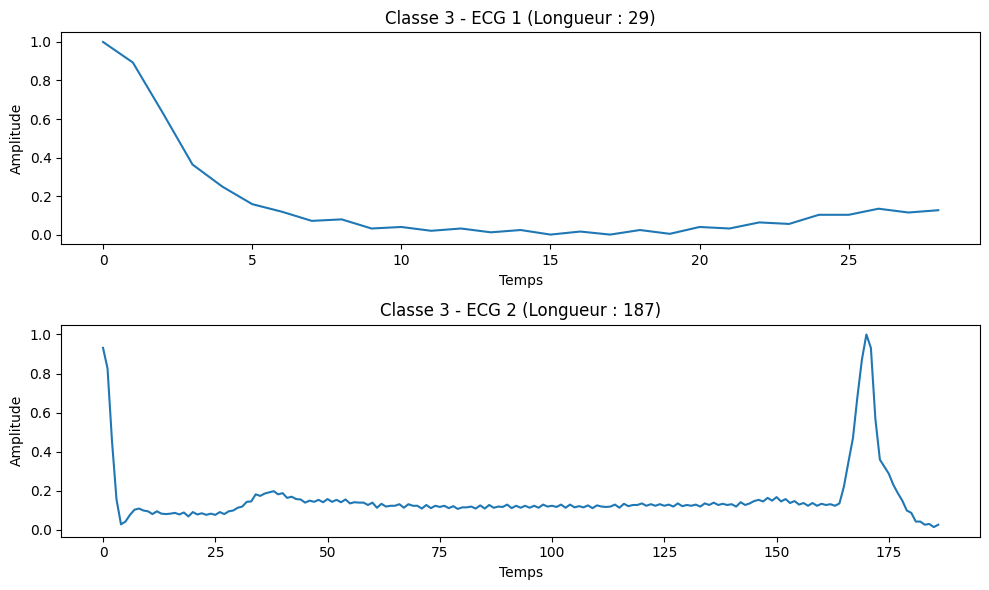

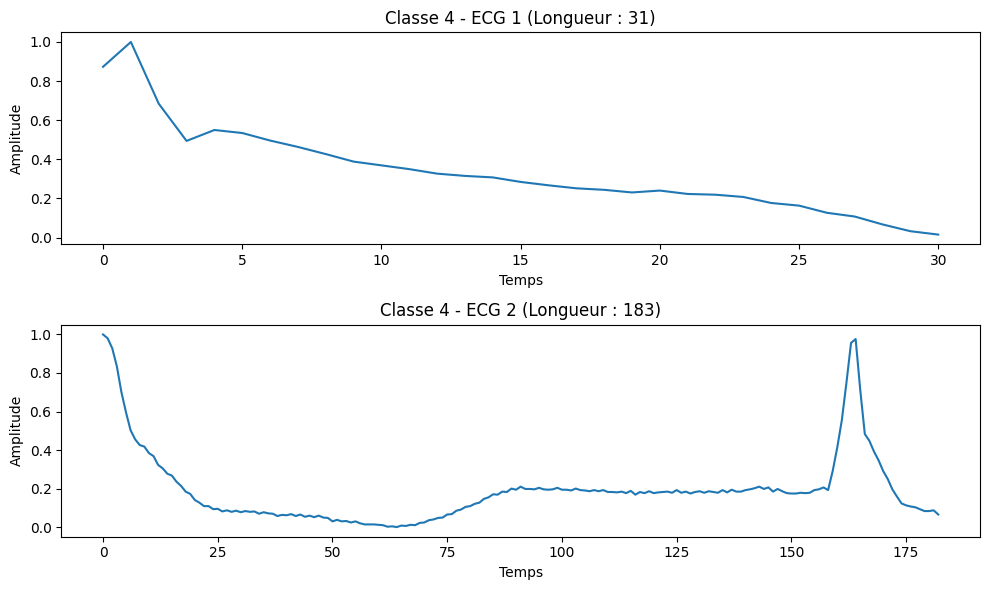

In [9]:
import csv
import pandas as pd
import matplotlib.pyplot as plt

# Charger les données avec la bibliothèque csv
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        classes.append(row[-1].strip())  # Ajouter la classe
        # Ajouter les valeurs de signal (en excluant la classe)
        data.append([float(x) for x in row[:-1] if x.strip() != '' and x.strip() != '0'])

# Convertir les données en DataFrame
df = pd.DataFrame({'Classe': classes, 'Signal': data})

# Nettoyer la colonne Classe (convertir en entiers ou exclure les valeurs invalides)
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')  # Convertir en numérique (NaN pour les valeurs invalides)
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)  # Convertir en entiers

# Ajouter une colonne 'Length' pour la longueur de chaque signal
df['Length'] = df['Signal'].apply(len)

# Identifier et afficher deux ECG de longueurs différentes par classe
for cls in df['Classe'].unique():
    class_data = df[df['Classe'] == cls]
    
    # Trier par longueur de signal
    class_data = class_data.sort_values(by='Length')
    
    # Sélectionner deux ECG de longueurs différentes
    ecg1 = class_data.iloc[0]['Signal']
    ecg2 = class_data.iloc[-1]['Signal']
    
    # Afficher les deux ECG
    plt.figure(figsize=(10, 6))
    
    plt.subplot(2, 1, 1)
    plt.plot(ecg1)
    plt.title(f"Classe {cls} - ECG 1 (Longueur : {len(ecg1)})")
    plt.xlabel("Temps")
    plt.ylabel("Amplitude")
    
    plt.subplot(2, 1, 2)
    plt.plot(ecg2)
    plt.title(f"Classe {cls} - ECG 2 (Longueur : {len(ecg2)})")
    plt.xlabel("Temps")
    plt.ylabel("Amplitude")
    
    plt.tight_layout()
    plt.show()


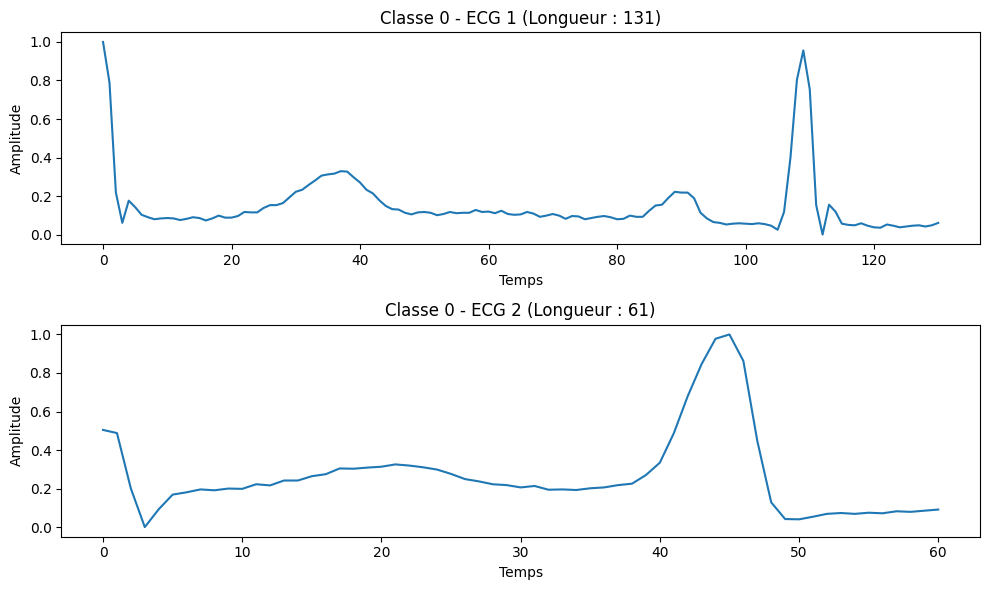

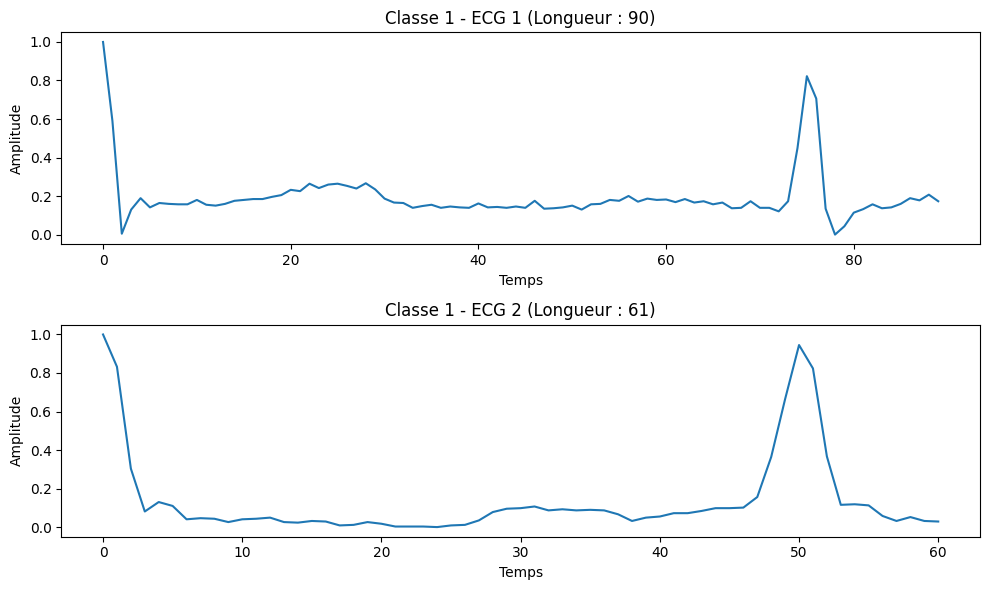

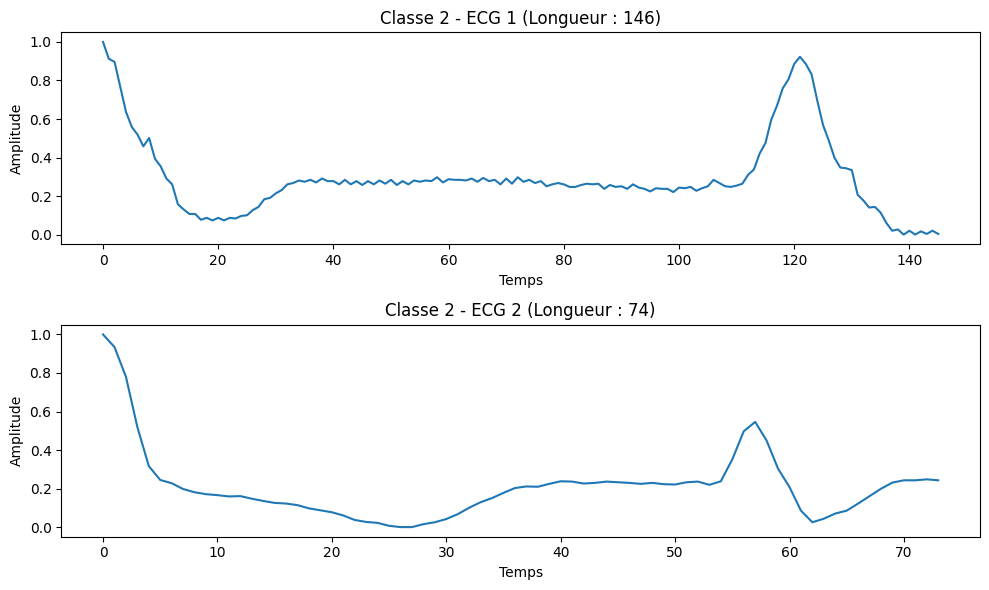

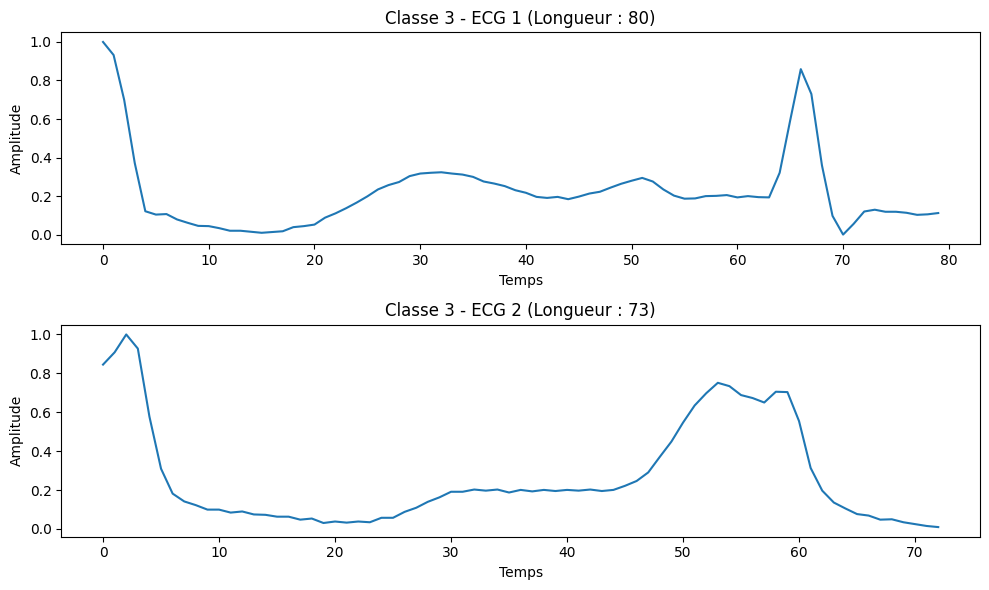

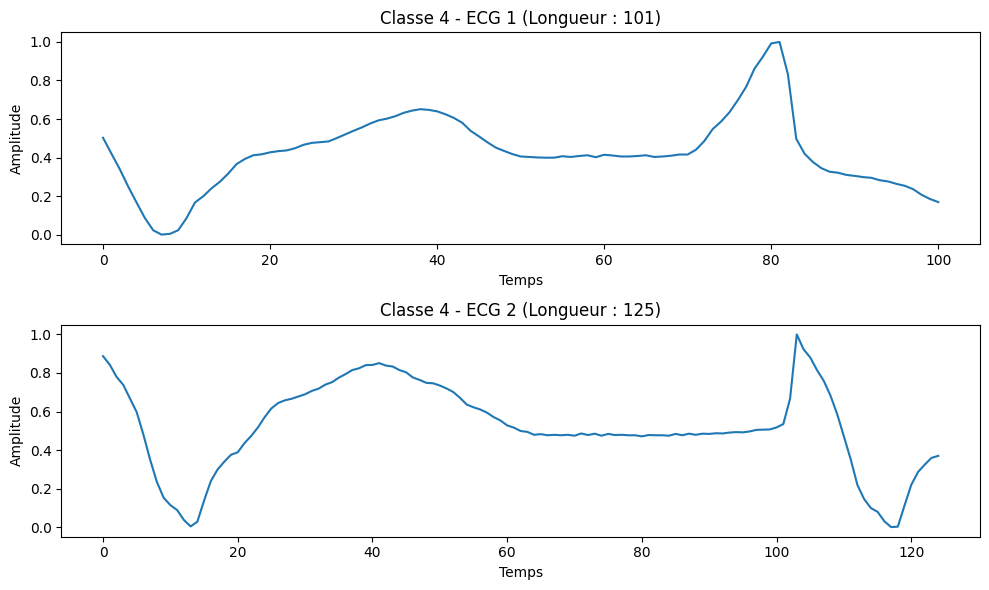

In [10]:
import csv
import pandas as pd
import matplotlib.pyplot as plt
import random

# Charger les données avec la bibliothèque csv
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        classes.append(row[-1].strip())  # Ajouter la classe
        # Ajouter les valeurs de signal (en excluant la classe)
        data.append([float(x) for x in row[:-1] if x.strip() != '' and x.strip() != '0'])

# Convertir les données en DataFrame
df = pd.DataFrame({'Classe': classes, 'Signal': data})

# Nettoyer la colonne Classe (convertir en entiers ou exclure les valeurs invalides)
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')  # Convertir en numérique (NaN pour les valeurs invalides)
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)  # Convertir en entiers

# Identifier et afficher deux ECG aléatoires par classe
for cls in df['Classe'].unique():
    class_data = df[df['Classe'] == cls]
    
    # Sélectionner deux ECG de manière aléatoire
    sampled_data = class_data.sample(n=2, random_state=random.randint(1, 1000))
    ecg1 = sampled_data.iloc[0]['Signal']
    ecg2 = sampled_data.iloc[1]['Signal']
    
    # Afficher les deux ECG
    plt.figure(figsize=(10, 6))
    
    plt.subplot(2, 1, 1)
    plt.plot(ecg1)
    plt.title(f"Classe {cls} - ECG 1 (Longueur : {len(ecg1)})")
    plt.xlabel("Temps")
    plt.ylabel("Amplitude")
    
    plt.subplot(2, 1, 2)
    plt.plot(ecg2)
    plt.title(f"Classe {cls} - ECG 2 (Longueur : {len(ecg2)})")
    plt.xlabel("Temps")
    plt.ylabel("Amplitude")
    
    plt.tight_layout()
    plt.show()


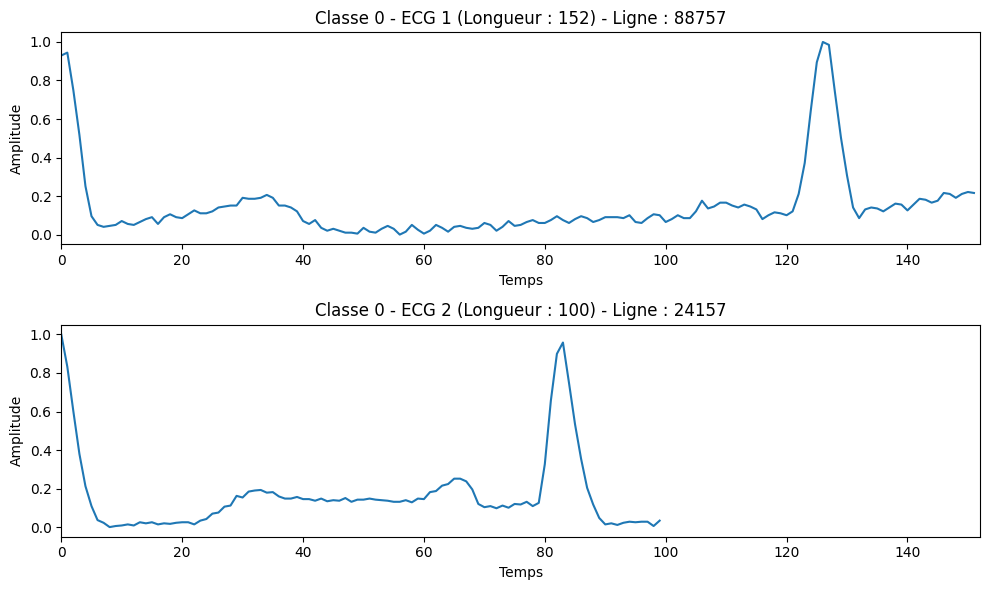

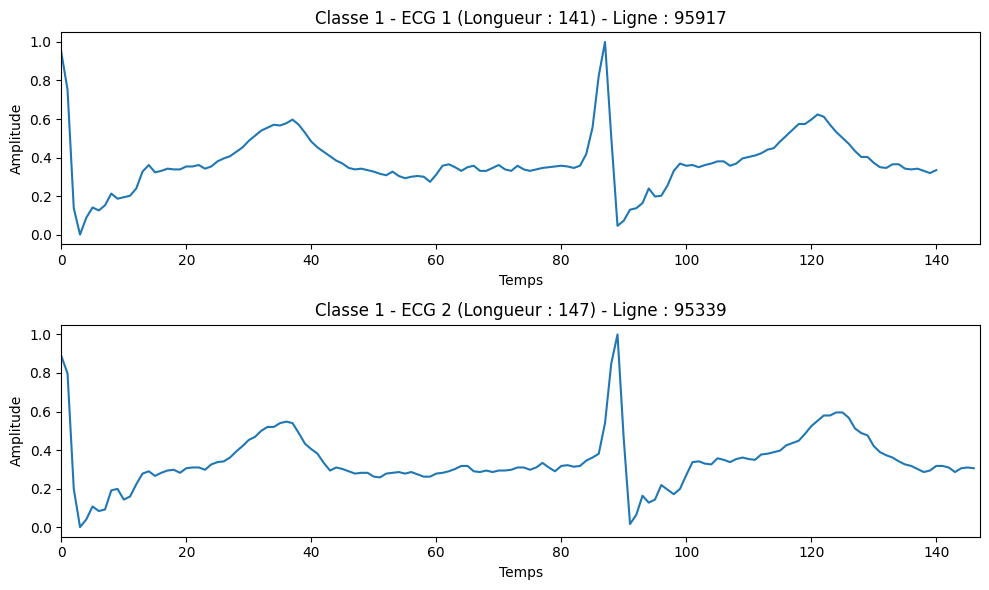

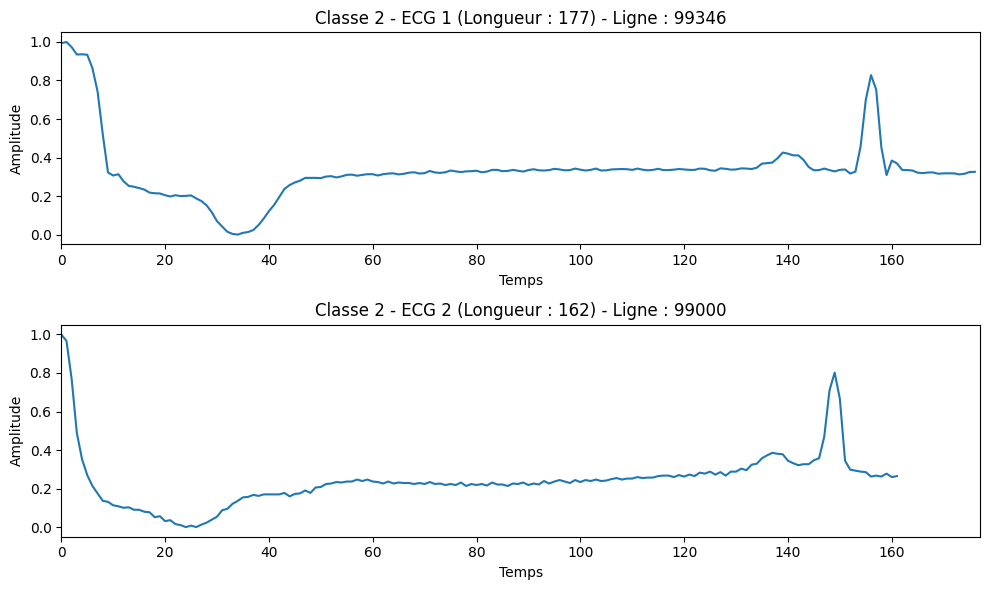

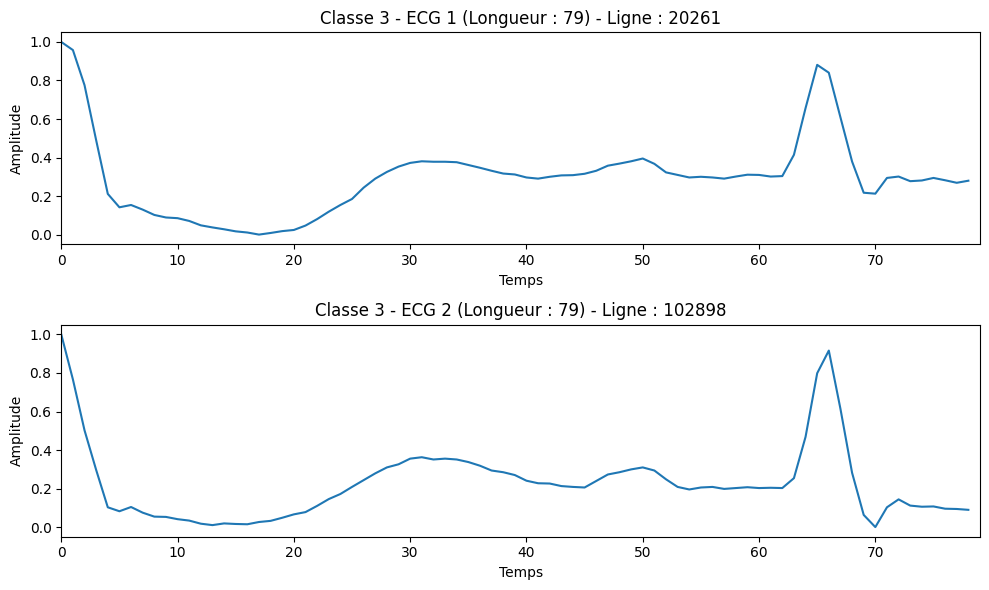

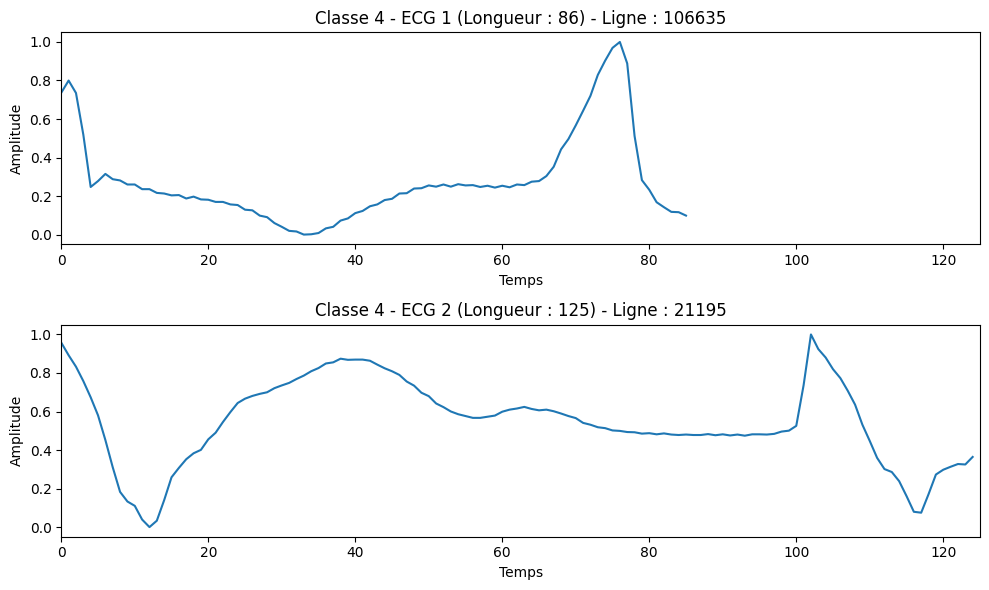

In [14]:
import csv
import pandas as pd
import matplotlib.pyplot as plt
import random

# Charger les données avec la bibliothèque csv
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        classes.append(row[-1].strip())  # Ajouter la classe
        # Ajouter les valeurs de signal (en excluant la classe)
        data.append([float(x) for x in row[:-1] if x.strip() != '' and x.strip() != '0'])

# Convertir les données en DataFrame
df = pd.DataFrame({'Classe': classes, 'Signal': data})

# Nettoyer la colonne Classe (convertir en entiers ou exclure les valeurs invalides)
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')  # Convertir en numérique (NaN pour les valeurs invalides)
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)  # Convertir en entiers

# Identifier et afficher deux ECG aléatoires par classe
for cls in df['Classe'].unique():
    class_data = df[df['Classe'] == cls]
    
    # Sélectionner deux ECG de manière aléatoire
    sampled_data = class_data.sample(n=2, random_state=random.randint(1, 1000))
    
    # Obtenir les signaux et leurs indices (lignes dans la base)
    ecg1 = sampled_data.iloc[0]['Signal']
    index1 = sampled_data.index[0]  # Ligne de la base de données
    ecg2 = sampled_data.iloc[1]['Signal']
    index2 = sampled_data.index[1]  # Ligne de la base de données
    
    # Définir un axe X identique pour comparer les longueurs
    max_length = max(len(ecg1), len(ecg2))
    x1 = range(len(ecg1))
    x2 = range(len(ecg2))
    x_full = range(max_length)  # Axe X global
    
    # Afficher les deux ECG
    plt.figure(figsize=(10, 6))
    
    plt.subplot(2, 1, 1)
    plt.plot(x1, ecg1, label=f"Ligne : {index1}")
    plt.title(f"Classe {cls} - ECG 1 (Longueur : {len(ecg1)}) - Ligne : {index1}")
    plt.xlabel("Temps")
    plt.ylabel("Amplitude")
    plt.xlim(0, max_length)  # Uniformiser l'axe X
    
    plt.subplot(2, 1, 2)
    plt.plot(x2, ecg2, label=f"Ligne : {index2}")
    plt.title(f"Classe {cls} - ECG 2 (Longueur : {len(ecg2)}) - Ligne : {index2}")
    plt.xlabel("Temps")
    plt.ylabel("Amplitude")
    plt.xlim(0, max_length)  # Uniformiser l'axe X
    
    plt.tight_layout()
    plt.show()


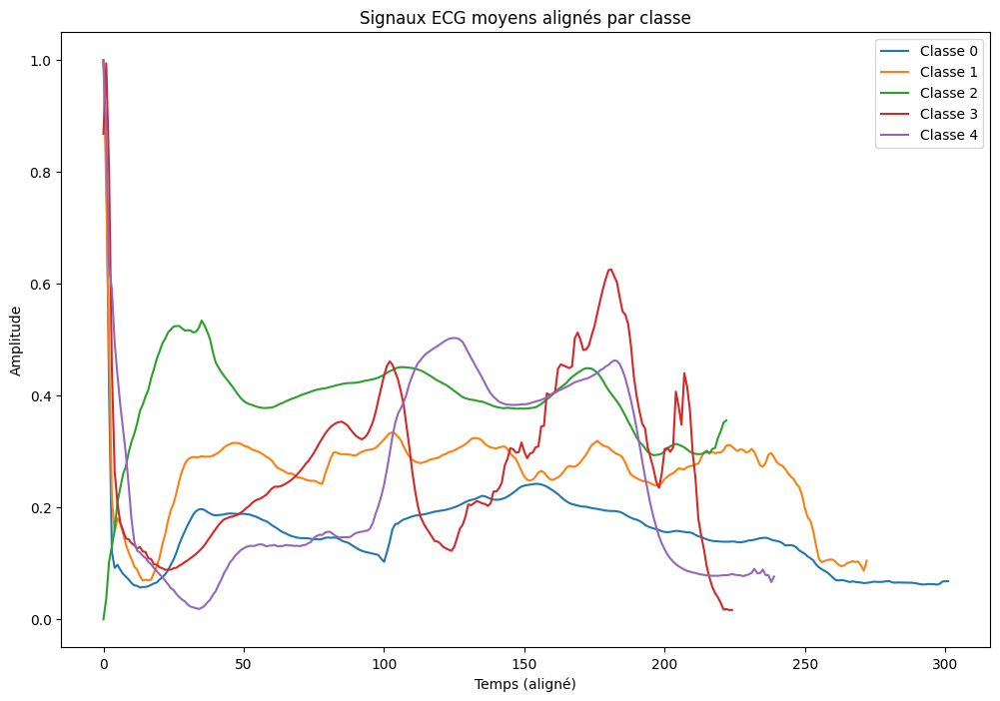

In [15]:
from dtaidistance import dtw
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Charger les données avec la bibliothèque csv
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        classes.append(row[-1].strip())  # Ajouter la classe
        # Ajouter les valeurs de signal (en excluant la classe)
        data.append([float(x) for x in row[:-1] if x.strip() != '' and x.strip() != '0'])

# Convertir les données en DataFrame
df = pd.DataFrame({'Classe': classes, 'Signal': data})

# Nettoyer la colonne Classe (convertir en entiers ou exclure les valeurs invalides)
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')  # Convertir en numérique (NaN pour les valeurs invalides)
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)  # Convertir en entiers

# Calculer le signal moyen aligné pour chaque classe
aligned_signals = {}
mean_signals = {}

for cls in df['Classe'].unique():
    class_data = df[df['Classe'] == cls]
    signals = class_data['Signal'].tolist()
    
    # Aligner les signaux avec DTW (en les alignant sur le premier signal)
    reference_signal = signals[0]
    aligned_signals_class = []
    
    for signal in signals:
        # Aligner le signal sur le signal de référence
        alignment_path = dtw.warping_path(reference_signal, signal)
        aligned_signal = [reference_signal[i] for i, j in alignment_path]
        aligned_signals_class.append(aligned_signal)
    
    # Rendre les signaux alignés de la même longueur
    max_length = max(len(sig) for sig in aligned_signals_class)
    padded_signals = [np.pad(sig, (0, max_length - len(sig)), 'constant', constant_values=np.nan)
                      for sig in aligned_signals_class]
    
    # Calculer le signal moyen en ignorant les NaN
    mean_signal = np.nanmean(padded_signals, axis=0)
    
    aligned_signals[cls] = aligned_signals_class
    mean_signals[cls] = mean_signal

# Tracer les signaux moyens pour chaque classe
plt.figure(figsize=(12, 8))

for cls, mean_signal in mean_signals.items():
    plt.plot(mean_signal, label=f'Classe {cls}')

plt.title("Signaux ECG moyens alignés par classe")
plt.xlabel("Temps (aligné)")
plt.ylabel("Amplitude")
plt.legend()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in file:
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[:-1]])  # Signaux

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Supprimer les cinq premières colonnes
df = df.iloc[:, 5:]  # Conserver les colonnes à partir de la 6e
df['Classe'] = classes  # Réinsérer la colonne Classe

# Calculer la moyenne des signaux pour chaque ligne (en ignorant les NaN)
df['Moyenne_sujet'] = df.drop(columns=['Classe']).mean(axis=1, skipna=True)

# Calculer la moyenne globale par groupe
moyenne_par_groupe = df.groupby('Classe')['Moyenne_sujet'].mean()

# Afficher les résultats
print("Moyenne globale des signaux ECG par groupe :")
print(moyenne_par_groupe)


Moyenne globale des signaux ECG par groupe :
Classe
0    0.272240
1    0.324338
2    0.395591
3    0.250204
4    0.395529
Name: Moyenne_sujet, dtype: float64


Chargement des données: 109446it [00:03, 30493.47it/s]
Interpolation des signaux: 100%|██████████| 5/5 [00:03<00:00,  1.36it/s]


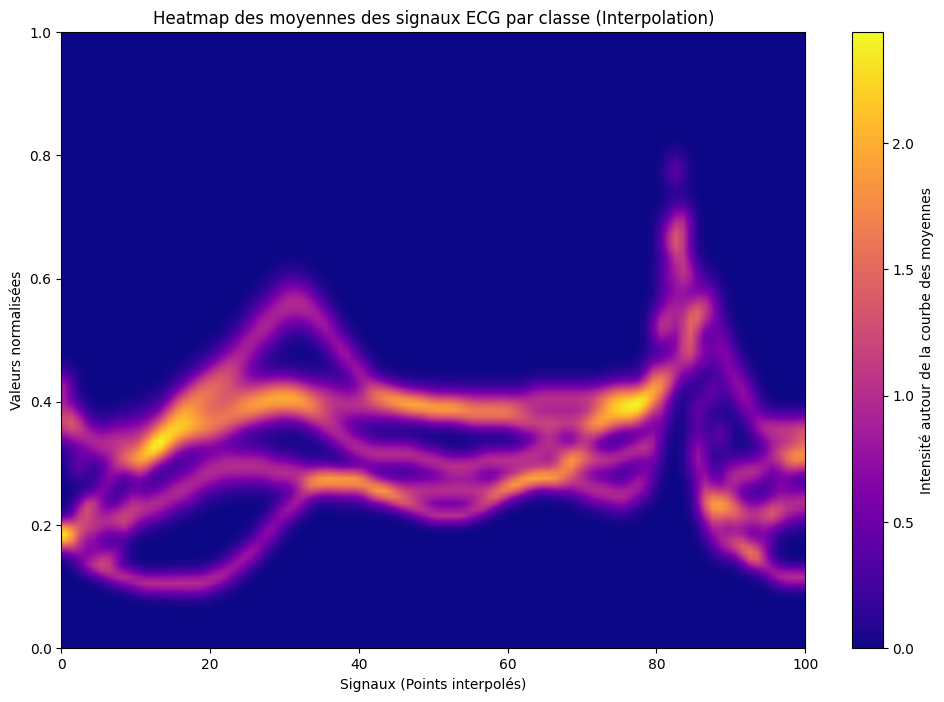

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from scipy.interpolate import interp1d
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Lecture des données avec gestion des longueurs variables
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # Dernière colonne : classe
        # Exclure les 5 premières colonnes et NaN
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique et nettoyer les lignes invalides
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])
df['Classe'] = df['Classe'].astype(int)

# Fonction pour interpoler les signaux à une longueur commune
def interpolate_signal(signal, target_length):
    """
    Interpole un signal à une longueur spécifiée.
    :param signal: Signal d'entrée (list ou np.array).
    :param target_length: Longueur cible après interpolation.
    :return: Signal interpolé.
    """
    x = np.linspace(0, 1, len(signal))
    interp_func = interp1d(x, signal, kind='linear', fill_value='extrapolate')
    x_new = np.linspace(0, 1, target_length)
    return interp_func(x_new)

# Définir la longueur cible (la plus longue signal ou une valeur définie)
target_length = 100

# Préparer les données interpolées
interpolated_data = []
interpolated_classes = []

for cls in tqdm(df['Classe'].unique(), desc="Interpolation des signaux"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    for signal in class_data:
        signal = signal[~np.isnan(signal)]  # Supprimer les NaN
        interpolated_data.append(interpolate_signal(signal, target_length))
        interpolated_classes.append(cls)

# Convertir les données interpolées en DataFrame
interpolated_df = pd.DataFrame(interpolated_data)
interpolated_df['Classe'] = interpolated_classes

# Initialisation de la heatmap
num_signaux = target_length  # Nombre de points par signal
num_valeurs = 100  # Résolution verticale
heatmap_data = np.zeros((num_valeurs, num_signaux))

# Calcul des moyennes et des écarts-types pour chaque groupe
for group in interpolated_df['Classe'].unique():
    groupe_data = interpolated_df[interpolated_df['Classe'] == group].drop(columns=['Classe'])
    moyenne_par_signal = groupe_data.mean()
    ecart_type_par_signal = groupe_data.std()

    # Ajouter la diffusion dans la heatmap
    for i, (val, std) in enumerate(zip(moyenne_par_signal, ecart_type_par_signal)):
        y_position = int((1 - val) * (num_valeurs - 1))  # Inverser la position Y
        if 0 <= y_position < num_valeurs:
            sigma_local = max(0.5, std * 10)
            heatmap_data[:, i] += np.exp(-0.5 * ((np.arange(num_valeurs) - y_position) / sigma_local) ** 2)

# Appliquer un flou global pour lisser l'image
heatmap_data = gaussian_filter1d(heatmap_data, sigma=1, axis=1)

# Tracer la heatmap
plt.figure(figsize=(12, 8))
plt.imshow(heatmap_data, aspect='auto', cmap='plasma', interpolation='bilinear',
           extent=[0, num_signaux, 0, 1])

# Configurer les axes et la colorbar
plt.colorbar(label="Intensité autour de la courbe des moyennes")
plt.xlabel("Signaux (Points interpolés)")
plt.ylabel("Valeurs normalisées")
plt.title("Heatmap des moyennes des signaux ECG par classe (Interpolation)")
plt.grid(False)
plt.show()


Traitement de la classe 0...
Traitement de la classe 1...
Traitement de la classe 2...
Traitement de la classe 3...
Traitement de la classe 4...


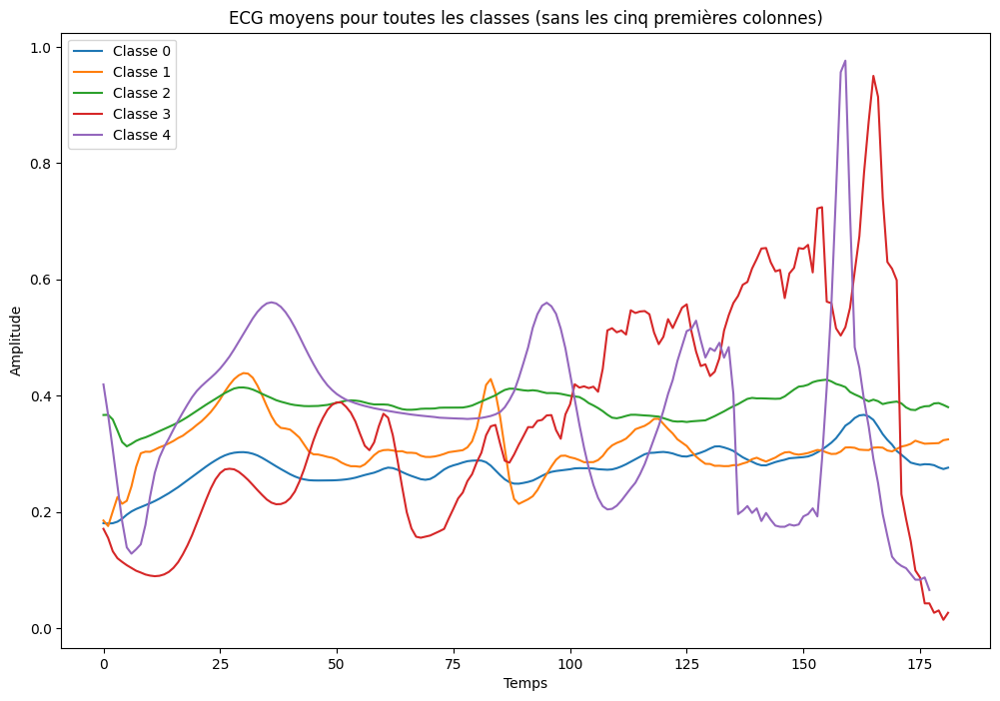

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in file:
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les cinq premières colonnes et traiter les signaux
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[5:-1]])  

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Initialiser le dictionnaire des signaux moyens
mean_signals = {}

# Calculer l'ECG moyen pour chaque classe
for selected_class in df['Classe'].unique():
    print(f"Traitement de la classe {selected_class}...")
    class_data = df[df['Classe'] == selected_class].drop(columns=['Classe']).values

    # Aligner les signaux de la classe sélectionnée en les remplaçant par NaN pour les colonnes manquantes
    max_length = max(len(row[~np.isnan(row)]) for row in class_data)
    aligned_signals = np.array([np.pad(row[~np.isnan(row)], (0, max_length - len(row[~np.isnan(row)])), constant_values=np.nan)
                                for row in class_data])

    # Calculer l'ECG moyen (en ignorant les NaN)
    ecg_mean = np.nanmean(aligned_signals, axis=0)
    mean_signals[selected_class] = ecg_mean

# Tracer les ECG moyens pour toutes les classes
plt.figure(figsize=(12, 8))

for cls, ecg_mean in mean_signals.items():
    plt.plot(ecg_mean, label=f'Classe {cls}')

plt.title("ECG moyens pour toutes les classes (sans les cinq premières colonnes)")
plt.xlabel("Temps")
plt.ylabel("Amplitude")
plt.legend()
plt.show()


Traitement de la classe 0...
Traitement de la classe 1...
Traitement de la classe 2...
Traitement de la classe 3...
Traitement de la classe 4...


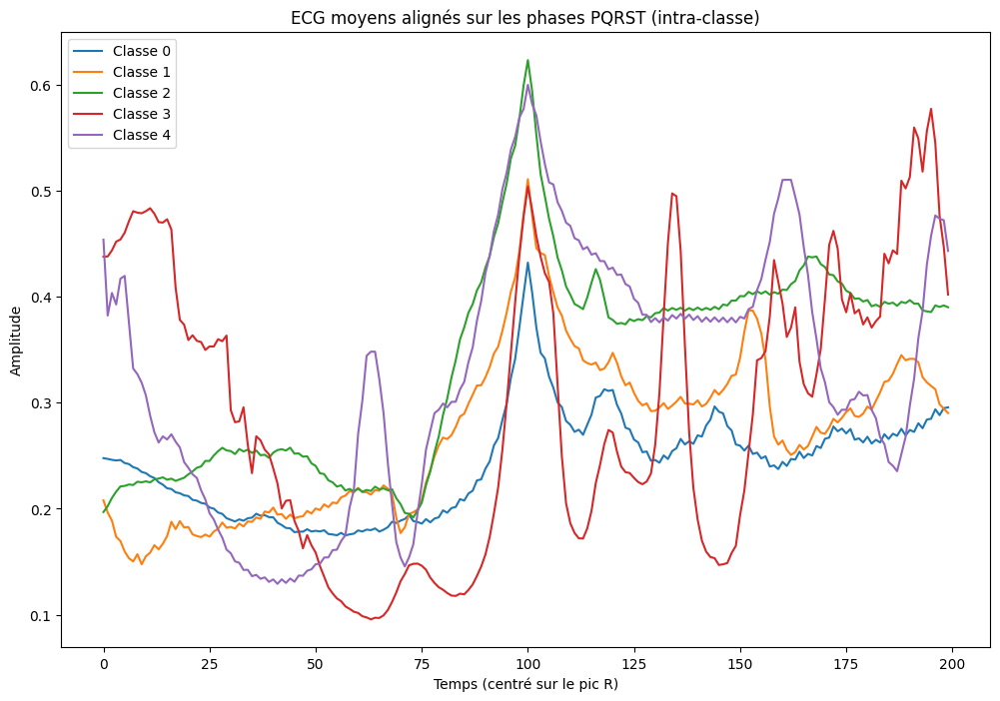

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in file:
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les cinq premières colonnes et traiter les signaux
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[5:-1]])  

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour extraire et aligner les signaux sur les pics R
def align_signals_within_class(signals, window_size=100):
    """
    Aligne les signaux ECG sur les pics R.
    :param signals: Liste des signaux de la classe
    :param window_size: Taille de la fenêtre autour du pic R
    :return: Signaux alignés
    """
    aligned_signals = []
    for signal in signals:
        signal = signal[~np.isnan(signal)]  # Supprimer les NaN
        peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)  # Détecter les pics R
        if len(peaks) == 0:
            continue  # Ignorer les signaux sans pic R détecté
        r_peak = peaks[0]  # Utiliser le premier pic R détecté
        start = max(0, r_peak - window_size)
        end = min(len(signal), r_peak + window_size)
        segment = signal[start:end]
        # Padding pour garantir une longueur constante
        pad_before = max(0, window_size - r_peak)
        pad_after = max(0, window_size + r_peak - len(signal))
        segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
window_size = 100  # Taille de la fenêtre autour du pic R

for cls in df['Classe'].unique():
    print(f"Traitement de la classe {cls}...")
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_signals_within_class(class_data, window_size=window_size)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)

# Tracer les ECG moyens alignés au sein de chaque classe
plt.figure(figsize=(12, 8))

for cls, mean_signal in mean_signals.items():
    plt.plot(mean_signal, label=f'Classe {cls}')

plt.title("ECG moyens alignés sur les phases PQRST (intra-classe)")
plt.xlabel("Temps (centré sur le pic R)")
plt.ylabel("Amplitude")
plt.legend()
plt.show()


Chargement des données: 109446it [00:03, 31959.03it/s]
Traitement des classes: 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]


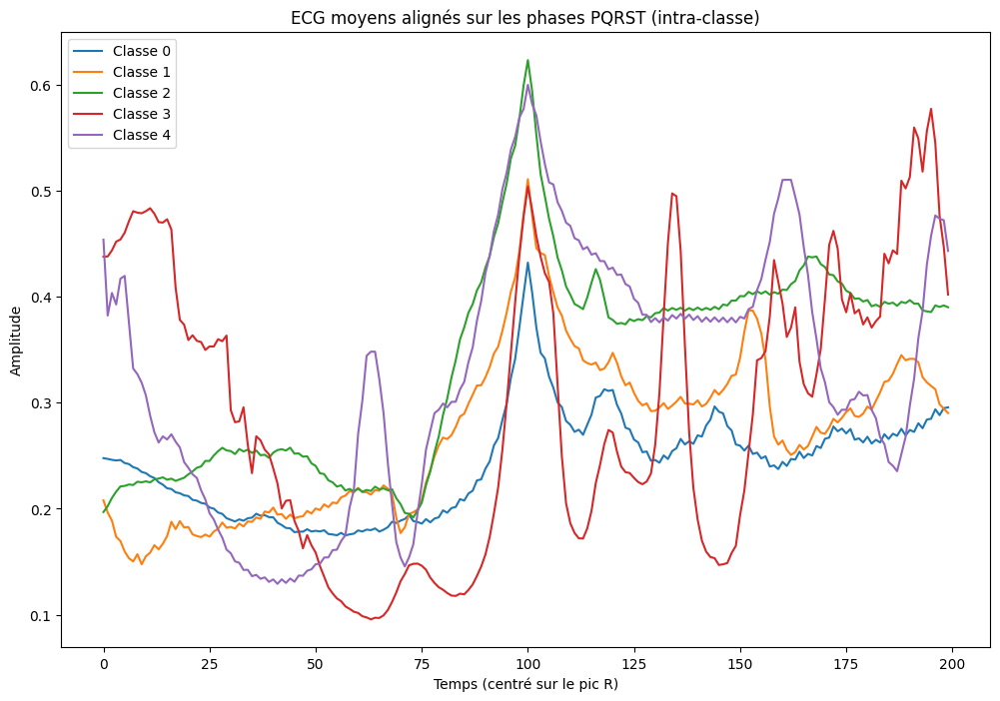

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées avec barre de progression
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les cinq premières colonnes et traiter les signaux
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour aligner les signaux sur les pics R
def align_signals_within_class(signals, window_size=100):
    """
    Aligne les signaux ECG sur les pics R.
    :param signals: Liste des signaux de la classe
    :param window_size: Taille de la fenêtre autour du pic R
    :return: Signaux alignés
    """
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = signal[~np.isnan(signal)]  # Supprimer les NaN
        peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)  # Détecter les pics R
        if len(peaks) == 0:
            continue  # Ignorer les signaux sans pic R détecté
        r_peak = peaks[0]  # Utiliser le premier pic R détecté
        start = max(0, r_peak - window_size)
        end = min(len(signal), r_peak + window_size)
        segment = signal[start:end]
        # Ajouter du padding pour garantir une longueur constante
        pad_before = max(0, window_size - r_peak)
        pad_after = max(0, window_size + r_peak - len(signal))
        segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
window_size = 100  # Taille de la fenêtre autour du pic R

for cls in tqdm(df['Classe'].unique(), desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_signals_within_class(class_data, window_size=window_size)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)

# Tracer les ECG moyens alignés pour chaque classe
plt.figure(figsize=(12, 8))

for cls, mean_signal in mean_signals.items():
    plt.plot(mean_signal, label=f'Classe {cls}')

plt.title("ECG moyens alignés sur les phases PQRST (intra-classe)")
plt.xlabel("Temps (centré sur le pic R)")
plt.ylabel("Amplitude")
plt.legend()
plt.show()


Chargement des données: 109446it [00:03, 32354.82it/s]
Traitement des classes: 100%|██████████| 5/5 [00:02<00:00,  2.08it/s]


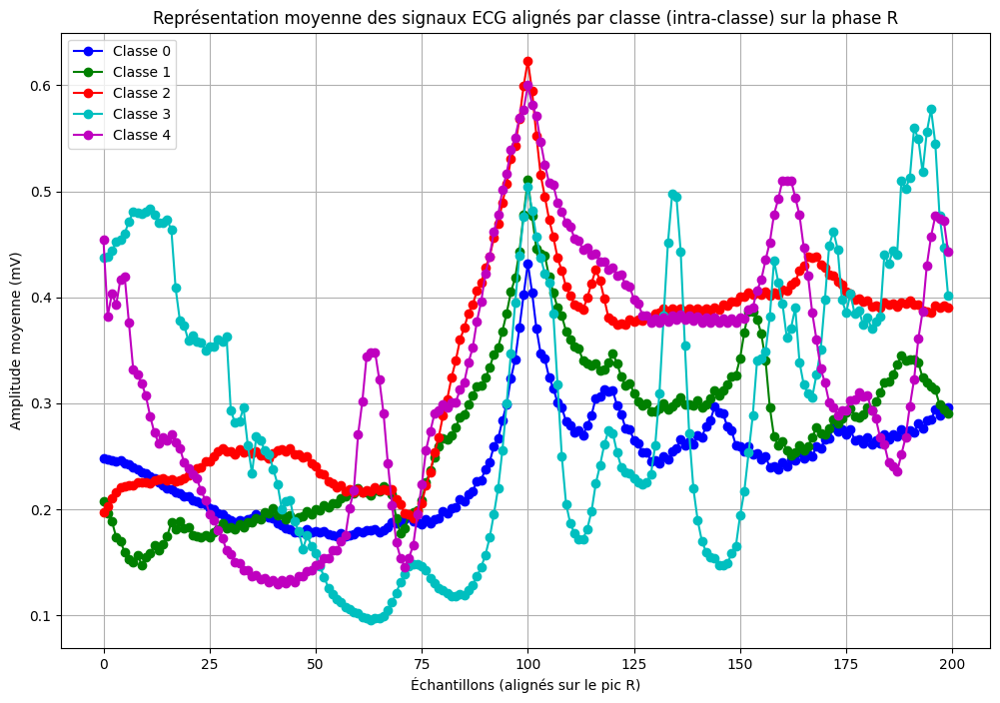

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées avec barre de progression
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les cinq premières colonnes et traiter les signaux
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour aligner les signaux sur les pics R (intra-classe)
def align_signals_within_class(signals, window_size=100):
    """
    Aligne les signaux ECG sur les pics R intra-classe.
    :param signals: Liste des signaux de la classe
    :param window_size: Taille de la fenêtre autour du pic R
    :return: Signaux alignés
    """
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = signal[~np.isnan(signal)]  # Supprimer les NaN
        peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)  # Détecter les pics R
        if len(peaks) == 0:
            continue  # Ignorer les signaux sans pic R détecté
        r_peak = peaks[0]  # Utiliser le premier pic R détecté
        start = max(0, r_peak - window_size)
        end = min(len(signal), r_peak + window_size)
        segment = signal[start:end]
        # Ajouter du padding pour garantir une longueur constante
        pad_before = max(0, window_size - r_peak)
        pad_after = max(0, window_size + r_peak - len(signal))
        segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
window_size = 100  # Taille de la fenêtre autour du pic R

for cls in tqdm(df['Classe'].unique(), desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_signals_within_class(class_data, window_size=window_size)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe

# Tracer les ECG moyens alignés intra-classe avec le style demandé
plt.figure(figsize=(12, 8))
colors = ['b', 'g', 'r', 'c', 'm']
group_labels = ['Classe 0', 'Classe 1', 'Classe 2', 'Classe 3', 'Classe 4']

for i, (cls, mean_signal) in enumerate(mean_signals.items()):
    plt.plot(
        range(len(mean_signal)),  # Axes X basés sur la longueur originale
        mean_signal,  # Moyenne intra-classe du signal
        marker='o',
        linestyle='-',  # Ligne continue
        color=colors[i],
        label=group_labels[i]
    )

# Configurer le graphique
plt.xlabel("Échantillons (alignés sur le pic R)")
plt.ylabel("Amplitude moyenne (mV)")
plt.title("Représentation moyenne des signaux ECG alignés par classe (intra-classe) sur la phase R")
plt.legend()
plt.grid(True)
plt.show()


Chargement des données: 109446it [00:03, 31690.98it/s]
Alignement des signaux: 100%|██████████| 90589/90589 [00:02<00:00, 43746.02it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/245539219.py:83: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 44125.16it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/245539219.py:83: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 7236/7236 [00:00<00:00, 43552.05it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/245539219.py:83: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 803/803 [00:00<00:00, 40404.35it/s]
/var/folders/ln/x3t5c28j1zg89

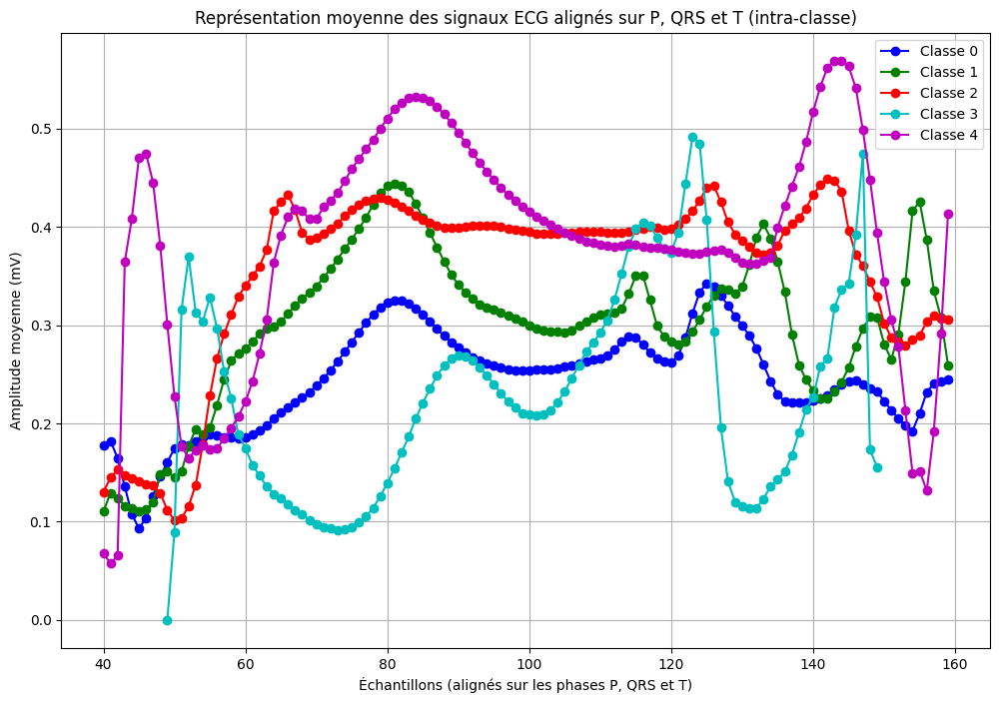

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées avec barre de progression
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les cinq premières colonnes et traiter les signaux
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    """
    Détecte les pics R et approxime les phases P, QRS et T.
    :param signal: Signal ECG brut
    :return: Indices des phases P, R et T
    """
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)  # Détection des pics R
    if len(peaks) == 0:
        return None, None, None  # Si aucun pic R n'est détecté
    r_peak = peaks[0]  # Utiliser le premier pic R détecté

    # Approximer les points P et T comme des positions avant et après R
    p_wave = max(0, r_peak - 30)  # Phase P, arbitrairement 30 échantillons avant R
    t_wave = min(len(signal) - 1, r_peak + 50)  # Phase T, arbitrairement 50 échantillons après R
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    """
    Aligne les signaux ECG sur les phases P, QRS et T.
    :param signals: Liste des signaux ECG
    :param fixed_length: Longueur fixe pour tous les signaux alignés
    :return: Signaux alignés avec longueur constante
    """
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = signal[~np.isnan(signal)]  # Supprimer les NaN
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue  # Ignorer les signaux où les phases ne sont pas détectées
        
        # Découper une fenêtre centrée sur les trois phases
        start = max(0, p_wave - 20)  # Inclure un peu avant P
        end = min(len(signal), t_wave + 20)  # Inclure un peu après T
        segment = signal[start:end]
        
        # Ajuster la longueur du segment pour qu'il corresponde à fixed_length
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]  # Tronquer si le segment est trop long
        
        aligned_signals.append(segment)
    return np.array(aligned_signals)


# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
for cls in tqdm(df['Classe'].unique(), desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe

# Tracer les ECG moyens alignés par classe sur les phases P, QRS et T
plt.figure(figsize=(12, 8))
colors = ['b', 'g', 'r', 'c', 'm']
group_labels = ['Classe 0', 'Classe 1', 'Classe 2', 'Classe 3', 'Classe 4']

for i, (cls, mean_signal) in enumerate(mean_signals.items()):
    plt.plot(
        range(len(mean_signal)),  # Axes X basés sur la longueur originale
        mean_signal,  # Moyenne intra-classe du signal
        marker='o',
        linestyle='-',  # Ligne continue
        color=colors[i],
        label=group_labels[i]
    )

# Configurer le graphique
plt.xlabel("Échantillons (alignés sur les phases P, QRS et T)")
plt.ylabel("Amplitude moyenne (mV)")
plt.title("Représentation moyenne des signaux ECG alignés sur P, QRS et T (intra-classe)")
plt.legend()
plt.grid(True)
plt.show()


Chargement des données: 109446it [00:02, 37641.13it/s]
Alignement des signaux: 100%|██████████| 90589/90589 [00:01<00:00, 52660.80it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/2554865973.py:87: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 52396.51it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/2554865973.py:87: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 7236/7236 [00:00<00:00, 53355.01it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/2554865973.py:87: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 803/803 [00:00<00:00, 47834.49it/s]
/var/folders/ln/x3t5c28j1z

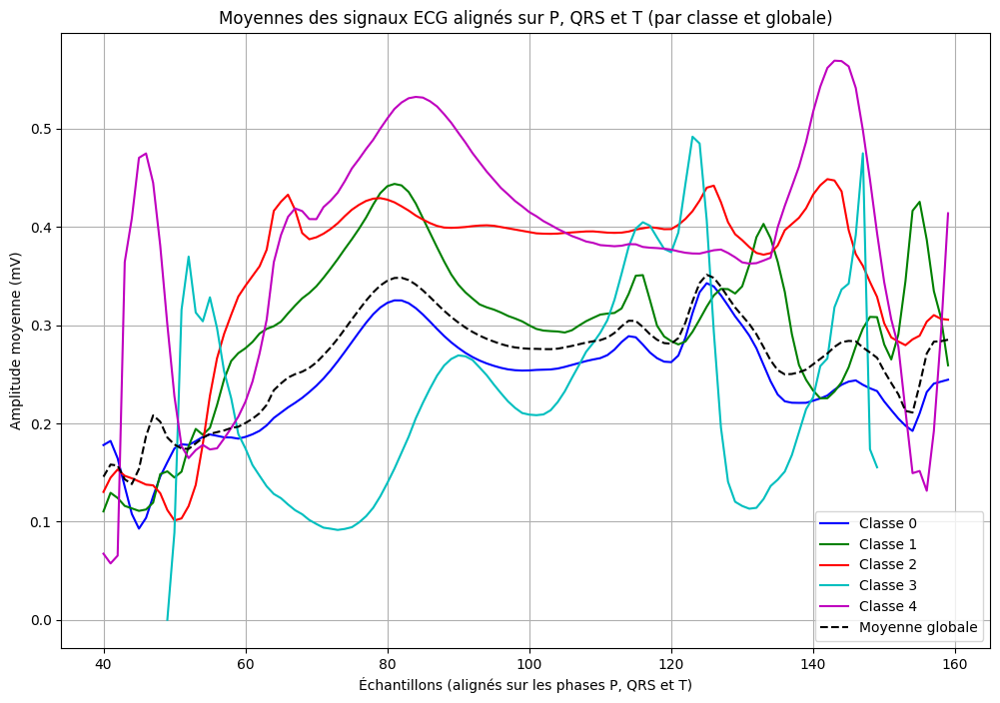

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    """
    Détecte les pics R et approxime les phases P, QRS et T.
    :param signal: Signal ECG brut
    :return: Indices des phases P, R et T
    """
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)  # Détection des pics R
    if len(peaks) == 0:
        return None, None, None  # Si aucun pic R n'est détecté
    r_peak = peaks[0]  # Utiliser le premier pic R détecté

    # Approximer les points P et T comme des positions avant et après R
    p_wave = max(0, r_peak - 30)  # Phase P, arbitrairement 30 échantillons avant R
    t_wave = min(len(signal) - 1, r_peak + 50)  # Phase T, arbitrairement 50 échantillons après R
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    """
    Aligne les signaux ECG sur les phases P, QRS et T.
    :param signals: Liste des signaux ECG
    :param fixed_length: Longueur fixe pour tous les signaux alignés
    :return: Signaux alignés avec longueur constante
    """
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = np.array(signal[~np.isnan(signal)])  # Supprimer les NaN
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue  # Ignorer les signaux où les phases ne sont pas détectées
        
        # Découper une fenêtre centrée sur les trois phases
        start = max(0, p_wave - 20)  # Inclure un peu avant P
        end = min(len(signal), t_wave + 20)  # Inclure un peu après T
        segment = signal[start:end]
        
        # Ajuster la longueur du segment pour qu'il corresponde à fixed_length
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]  # Tronquer si le segment est trop long
        
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
classes = df['Classe'].unique()

all_aligned_signals = []  # Liste pour accumuler tous les signaux alignés, toutes classes confondues

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
        all_aligned_signals.extend(aligned_signals)  # Ajouter à la liste globale

# Calculer la moyenne globale des ECG
all_aligned_signals = np.array(all_aligned_signals)
global_mean_signal = np.nanmean(all_aligned_signals, axis=0)

# Tracer les ECG moyens alignés par classe
plt.figure(figsize=(12, 8))
colors = ['b', 'g', 'r', 'c', 'm']
group_labels = [f"Classe {int(cls)}" for cls in classes]

for i, (cls, mean_signal) in enumerate(mean_signals.items()):
    plt.plot(
        range(len(mean_signal)),  # Axes X basés sur la longueur originale
        mean_signal,  # Moyenne intra-classe du signal
        linestyle='-',  # Ligne continue
        color=colors[i % len(colors)],  # Réutiliser les couleurs si besoin
        label=group_labels[i]
    )

# Ajouter la moyenne globale
plt.plot(
    range(len(global_mean_signal)),
    global_mean_signal,
    linestyle='--',
    color='black',
    label="Moyenne globale"
)

# Configurer le graphique
plt.xlabel("Échantillons (alignés sur les phases P, QRS et T)")
plt.ylabel("Amplitude moyenne (mV)")
plt.title("Moyennes des signaux ECG alignés sur P, QRS et T (par classe et globale)")
plt.legend()
plt.grid(True)
plt.show()


In [14]:
import pandas as pd
import numpy as np
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    """
    Détecte les pics R et approxime les phases P, QRS et T.
    :param signal: Signal ECG brut
    :return: Indices des phases P, R et T
    """
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)  # Détection des pics R
    if len(peaks) == 0:
        return None, None, None  # Si aucun pic R n'est détecté
    r_peak = peaks[0]  # Utiliser le premier pic R détecté

    # Approximer les points P et T comme des positions avant et après R
    p_wave = max(0, r_peak - 30)  # Phase P, arbitrairement 30 échantillons avant R
    t_wave = min(len(signal) - 1, r_peak + 50)  # Phase T, arbitrairement 50 échantillons après R
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    """
    Aligne les signaux ECG sur les phases P, QRS et T.
    :param signals: Liste des signaux ECG
    :param fixed_length: Longueur fixe pour tous les signaux alignés
    :return: Signaux alignés avec longueur constante
    """
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = np.array(signal[~np.isnan(signal)])  # Supprimer les NaN
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue  # Ignorer les signaux où les phases ne sont pas détectées
        
        # Découper une fenêtre centrée sur les trois phases
        start = max(0, p_wave - 20)  # Inclure un peu avant P
        end = min(len(signal), t_wave + 20)  # Inclure un peu après T
        segment = signal[start:end]
        
        # Ajuster la longueur du segment pour qu'il corresponde à fixed_length
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]  # Tronquer si le segment est trop long
        
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer la moyenne générale pour chaque classe
class_means = {}
classes = df['Classe'].unique()

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        # Moyenne globale pour la classe
        class_mean = np.nanmean(aligned_signals)  # Moyenne de toutes les amplitudes alignées
        class_means[cls] = class_mean

# Afficher les moyennes générales pour chaque classe
print("Moyenne générale des amplitudes ECG par classe (après alignement) :")
for cls, mean in class_means.items():
    print(f"Classe {int(cls)} : {mean}")


Chargement des données: 109446it [00:02, 37676.80it/s]
Traitement des classes: 100%|██████████| 5/5 [00:02<00:00,  2.20it/s]

Moyenne générale des amplitudes ECG par classe (après alignement) :
Classe 0 : 0.2626601087766437
Classe 1 : 0.32200542762715356
Classe 2 : 0.39264813503954465
Classe 3 : 0.227648279519356
Classe 4 : 0.4065180828457055


Chargement des données: 109446it [00:04, 22679.95it/s]
Alignement des signaux: 100%|██████████| 90589/90589 [00:01<00:00, 47158.19it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/1488041315.py:82: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 41153.87it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/1488041315.py:82: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 7236/7236 [00:00<00:00, 44538.80it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/1488041315.py:82: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe
Alignement des signaux: 100%|██████████| 803/803 [00:00<00:00, 41061.47it/s]
/var/folders/ln/x3t5c28j1z

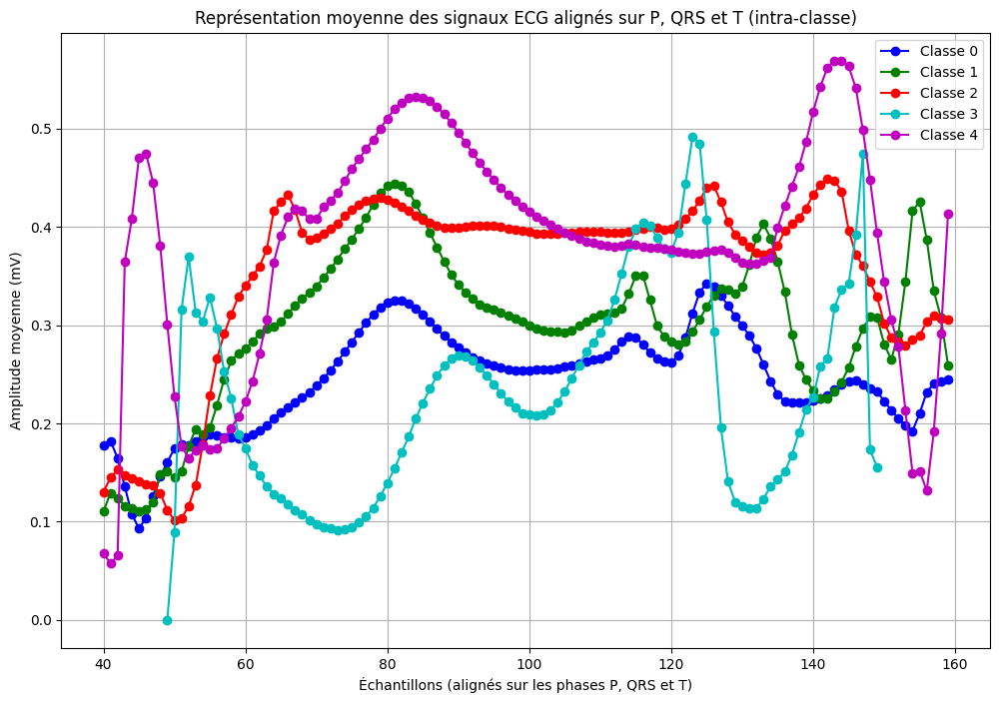

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les cinq premières colonnes et traiter les signaux
        data.append([float(x) if x.strip() != '' and x.strip() != '0' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    """
    Détecte les pics R et approxime les phases P, QRS et T.
    :param signal: Signal ECG brut
    :return: Indices des phases P, R et T
    """
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)  # Détection des pics R
    if len(peaks) == 0:
        return None, None, None  # Si aucun pic R n'est détecté
    r_peak = peaks[0]  # Utiliser le premier pic R détecté

    # Approximer les points P et T comme des positions avant et après R
    p_wave = max(0, r_peak - 30)  # Phase P, arbitrairement 30 échantillons avant R
    t_wave = min(len(signal) - 1, r_peak + 50)  # Phase T, arbitrairement 50 échantillons après R
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    """
    Aligne les signaux ECG sur les phases P, QRS et T.
    :param signals: Liste des signaux ECG
    :param fixed_length: Longueur fixe pour tous les signaux alignés
    :return: Signaux alignés avec longueur constante
    """
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = signal[~np.isnan(signal)]  # Supprimer les NaN
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue  # Ignorer les signaux où les phases ne sont pas détectées
        
        # Découper une fenêtre centrée sur les trois phases
        start = max(0, p_wave - 20)  # Inclure un peu avant P
        end = min(len(signal), t_wave + 20)  # Inclure un peu après T
        segment = signal[start:end]
        
        # Ajuster la longueur du segment pour qu'il corresponde à fixed_length
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]  # Tronquer si le segment est trop long
        
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
for cls in tqdm(df['Classe'].unique(), desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)  # Moyenne intra-classe

# Tracer les ECG moyens alignés par classe sur les phases P, QRS et T
plt.figure(figsize=(12, 8))
colors = ['b', 'g', 'r', 'c', 'm']
group_labels = ['Classe 0', 'Classe 1', 'Classe 2', 'Classe 3', 'Classe 4']

for i, (cls, mean_signal) in enumerate(mean_signals.items()):
    plt.plot(
        range(len(mean_signal)),  # Axes X basés sur la longueur originale
        mean_signal,  # Moyenne intra-classe du signal
        marker='o',
        linestyle='-',  # Ligne continue
        color=colors[i],
        label=group_labels[i]
    )

# Configurer le graphique
plt.xlabel("Échantillons (alignés sur les phases P, QRS et T)")
plt.ylabel("Amplitude moyenne (mV)")
plt.title("Représentation moyenne des signaux ECG alignés sur P, QRS et T (intra-classe)")
plt.legend()
plt.grid(True)
plt.show()


Chargement des données: 109446it [00:03, 35798.50it/s]
Alignement des signaux: 100%|██████████| 90589/90589 [00:01<00:00, 52381.29it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/822326450.py:68: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 51500.80it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/822326450.py:68: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
Alignement des signaux: 100%|██████████| 7236/7236 [00:00<00:00, 51935.80it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/822326450.py:68: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
Alignement des signaux: 100%|██████████| 803/803 [00:00<00:00, 44571.83it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/822326450.py:68: RuntimeWarning: Mea

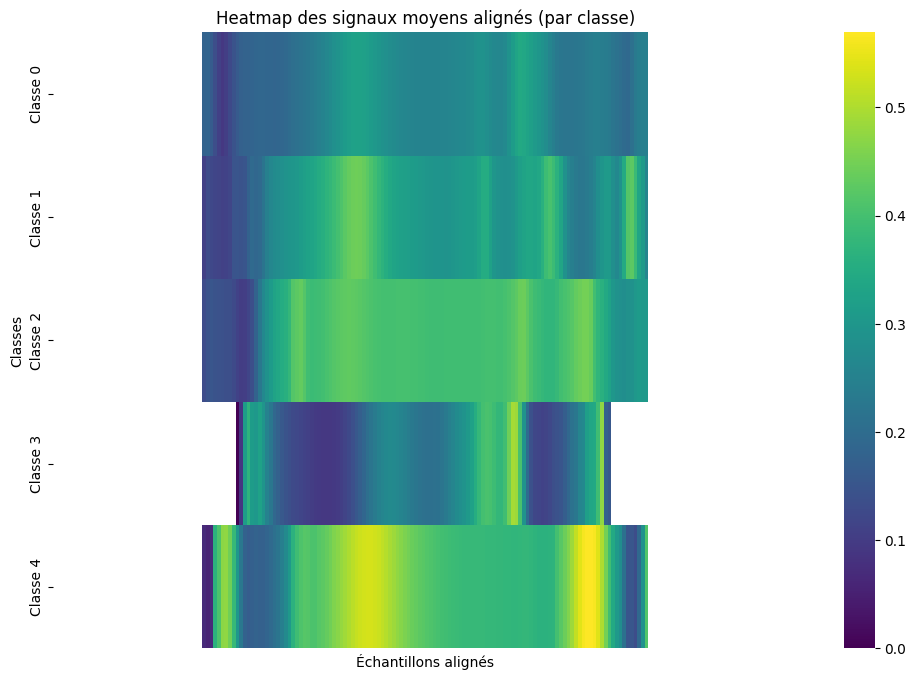

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)
    if len(peaks) == 0:
        return None, None, None
    r_peak = peaks[0]
    p_wave = max(0, r_peak - 30)
    t_wave = min(len(signal) - 1, r_peak + 50)
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = np.array(signal[~np.isnan(signal)])
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue
        start = max(0, p_wave - 20)
        end = min(len(signal), t_wave + 20)
        segment = signal[start:end]
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
classes = df['Classe'].unique()

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)

# Créer une heatmap des signaux moyens
heatmap_data = np.array([mean_signal for mean_signal in mean_signals.values()])
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='viridis', cbar=True, xticklabels=False, yticklabels=[f"Classe {int(cls)}" for cls in classes])
plt.title("Heatmap des signaux moyens alignés (par classe)")
plt.xlabel("Échantillons alignés")
plt.ylabel("Classes")
plt.show()


Alignement des signaux: 100%|██████████| 90589/90589 [00:01<00:00, 52769.21it/s]
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 51931.49it/s]
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 7236/7236 [00:00<00:00, 54303.45it/s]
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 803/803 [00:00<00:00, 50041.25it/s]
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib

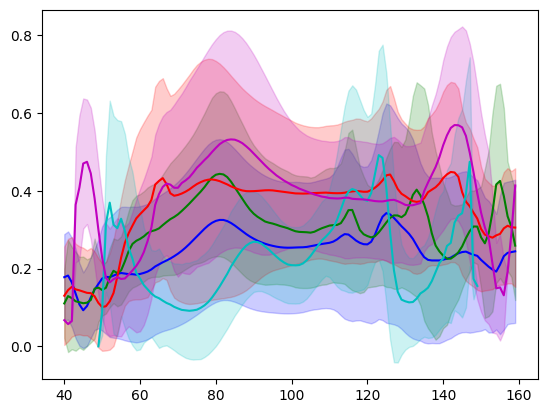

In [17]:
for i, (cls, mean_signal) in enumerate(mean_signals.items()):
    aligned_signals = align_on_phases(df[df['Classe'] == cls].drop(columns=['Classe']).values)
    std_dev = np.nanstd(aligned_signals, axis=0)  # Écart-type des signaux alignés
    plt.plot(
        range(len(mean_signal)),
        mean_signal,
        linestyle='-',
        color=colors[i % len(colors)],
        label=f"Classe {cls}"
    )
    plt.fill_between(
        range(len(mean_signal)),
        mean_signal - std_dev,
        mean_signal + std_dev,
        color=colors[i % len(colors)],
        alpha=0.2
    )


Alignement des signaux: 100%|██████████| 8039/8039 [00:00<00:00, 54361.62it/s]


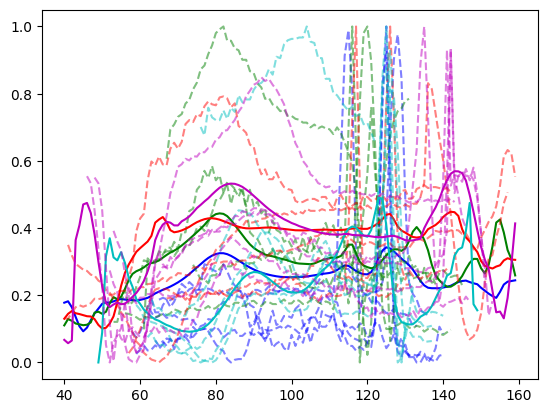

In [18]:
for i, (cls, mean_signal) in enumerate(mean_signals.items()):
    aligned_signals = align_on_phases(df[df['Classe'] == cls].drop(columns=['Classe']).values)
    sample_signals = aligned_signals[np.random.choice(len(aligned_signals), 5, replace=False)]  # 5 signaux aléatoires
    
    for signal in sample_signals:
        plt.plot(
            range(len(signal)),
            signal,
            linestyle='--',
            color=colors[i % len(colors)],
            alpha=0.5
        )
    
    plt.plot(
        range(len(mean_signal)),
        mean_signal,
        linestyle='-',
        color=colors[i % len(colors)],
        label=f"Classe {cls}"
    )


Alignement des signaux: 100%|██████████| 90589/90589 [00:01<00:00, 53951.54it/s]
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 53367.39it/s]
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 7236/7236 [00:00<00:00, 50543.04it/s]
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 803/803 [00:00<00:00, 49941.08it/s]
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib

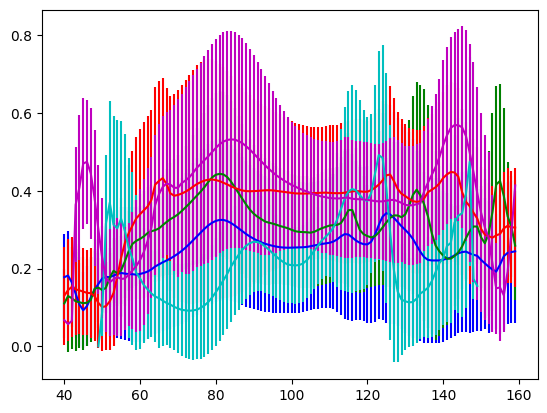

In [19]:
for i, (cls, mean_signal) in enumerate(mean_signals.items()):
    aligned_signals = align_on_phases(df[df['Classe'] == cls].drop(columns=['Classe']).values)
    std_dev = np.nanstd(aligned_signals, axis=0)  # Écart-type des signaux alignés

    plt.errorbar(
        range(len(mean_signal)),
        mean_signal,
        yerr=std_dev,
        fmt='-',
        color=colors[i % len(colors)],
        label=f"Classe {cls}"
    )


In [21]:
for cls in classes:
    aligned_signals = align_on_phases(df[df['Classe'] == cls].drop(columns=['Classe']).values)
    plt.boxplot(
        aligned_signals.T, 
        showfliers=False, 
        patch_artist=True
    )
    plt.title(f"Distribution des amplitudes alignées - Classe {cls}")
    plt.xlabel("Échantillons alignés")
    plt.ylabel("Amplitude (mV)")
    plt.show()


Alignement des signaux: 100%|██████████| 90589/90589 [00:01<00:00, 53137.09it/s]


KeyboardInterrupt: 

Chargement des données: 109446it [00:03, 35895.16it/s]
Alignement des signaux: 100%|██████████| 90589/90589 [00:01<00:00, 49760.01it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/2494238.py:68: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 49286.12it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/2494238.py:68: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100

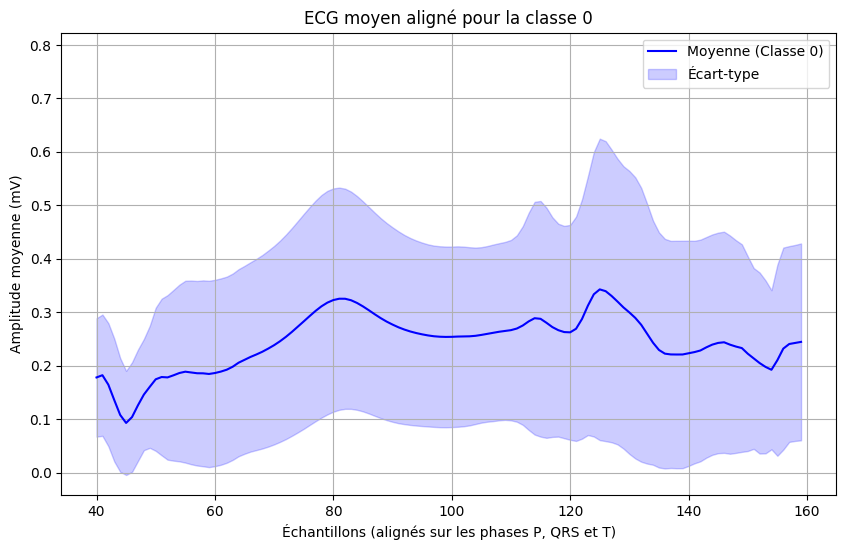

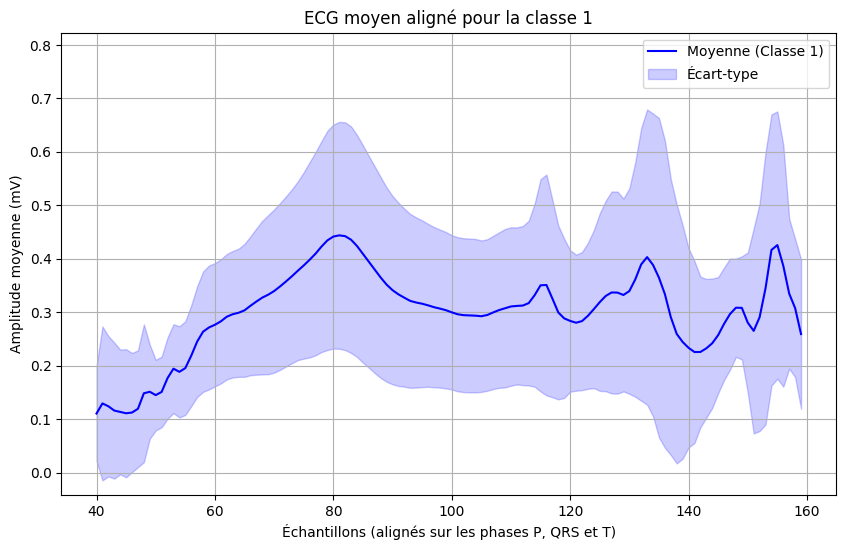

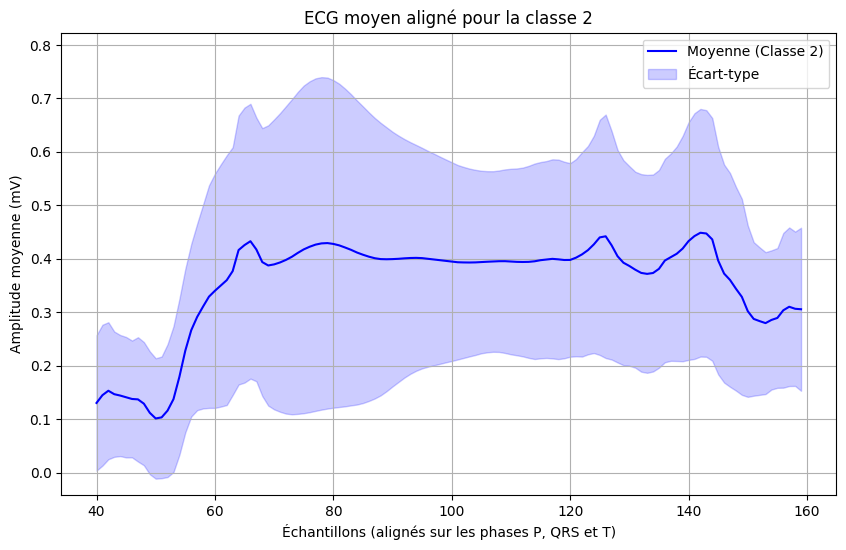

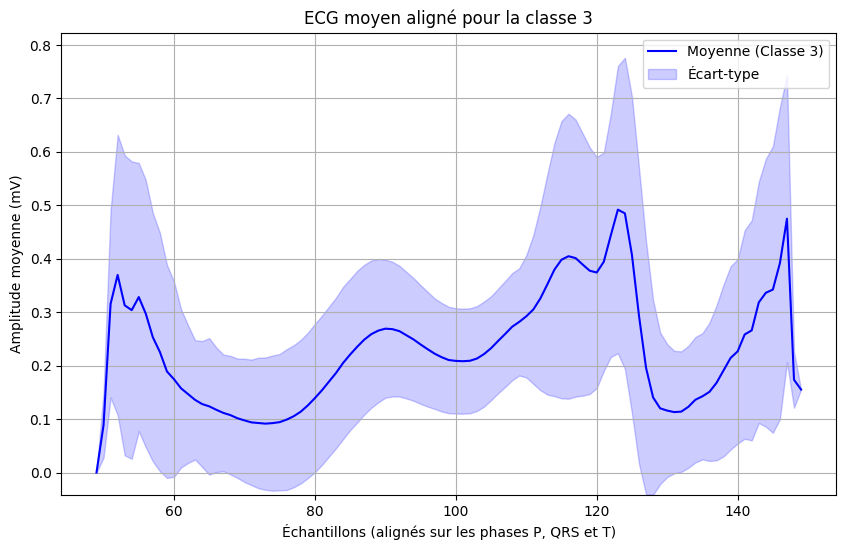

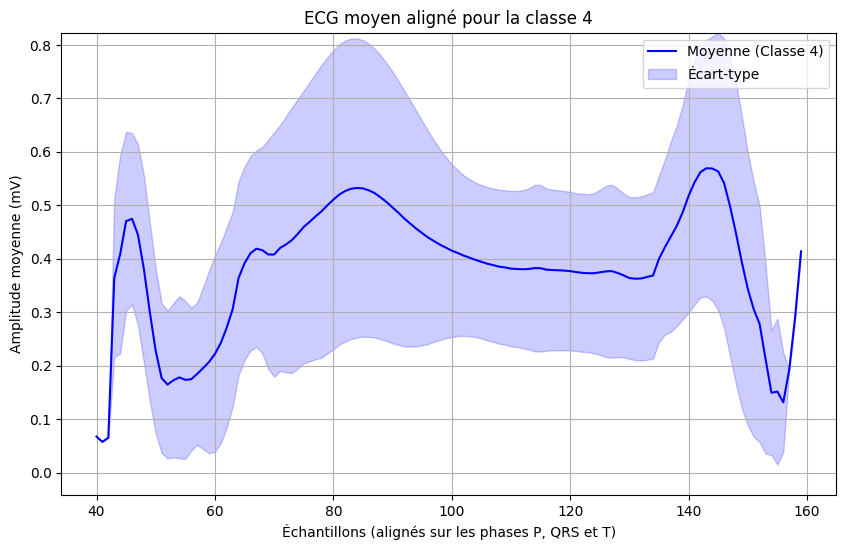

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)
    if len(peaks) == 0:
        return None, None, None
    r_peak = peaks[0]
    p_wave = max(0, r_peak - 30)
    t_wave = min(len(signal) - 1, r_peak + 50)
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = np.array(signal[~np.isnan(signal)])
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue
        start = max(0, p_wave - 20)
        end = min(len(signal), t_wave + 20)
        segment = signal[start:end]
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
std_signals = {}
classes = df['Classe'].unique()

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
        std_signals[cls] = np.nanstd(aligned_signals, axis=0)

# Générer un schéma pour chaque classe, avec la même échelle
y_min = min([np.nanmin(mean_signals[cls] - std_signals[cls]) for cls in classes])
y_max = max([np.nanmax(mean_signals[cls] + std_signals[cls]) for cls in classes])

for cls in classes:
    mean_signal = mean_signals[cls]
    std_signal = std_signals[cls]
    x = range(len(mean_signal))

    plt.figure(figsize=(10, 6))
    plt.plot(x, mean_signal, color='b', label=f'Moyenne (Classe {cls})')
    plt.fill_between(x, mean_signal - std_signal, mean_signal + std_signal, color='b', alpha=0.2, label='Écart-type')
    plt.ylim(y_min, y_max)  # Fixer la même échelle pour toutes les classes
    plt.title(f"ECG moyen aligné pour la classe {cls}")
    plt.xlabel("Échantillons (alignés sur les phases P, QRS et T)")
    plt.ylabel("Amplitude moyenne (mV)")
    plt.legend()
    plt.grid(True)
    plt.show()


Chargement des données: 109446it [00:02, 36899.53it/s]
Alignement des signaux: 100%|██████████| 90589/90589 [00:01<00:00, 51743.77it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/2157465749.py:69: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 48856.43it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/2157465749.py:69: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signau

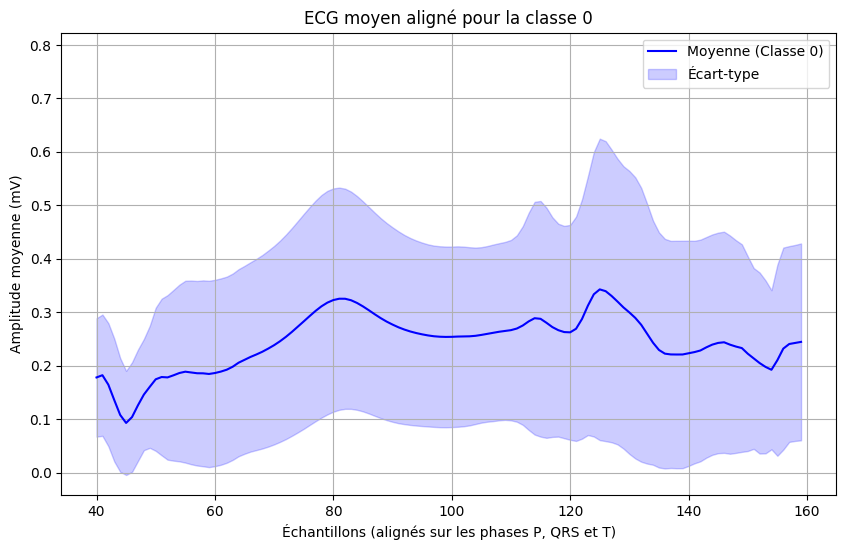

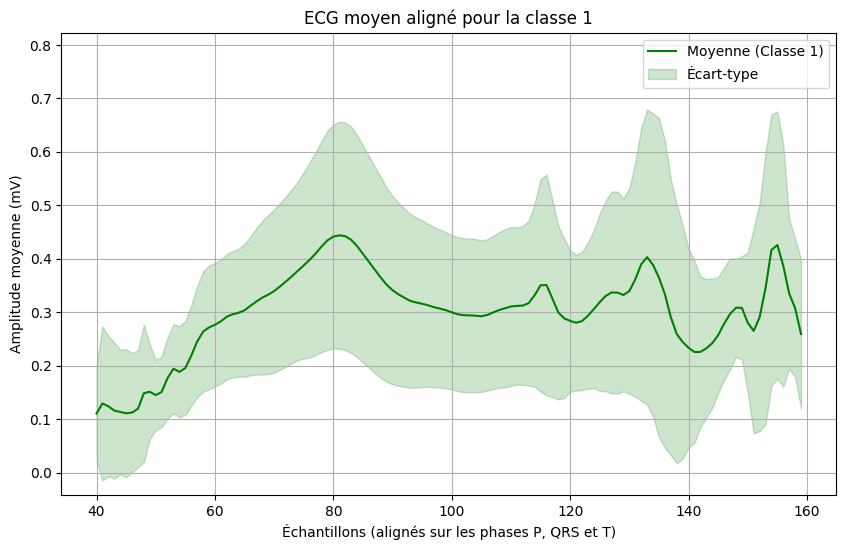

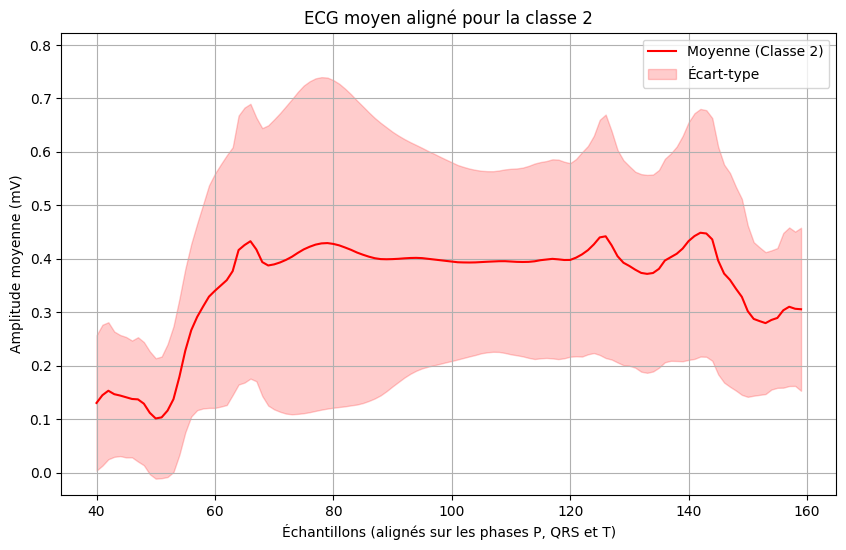

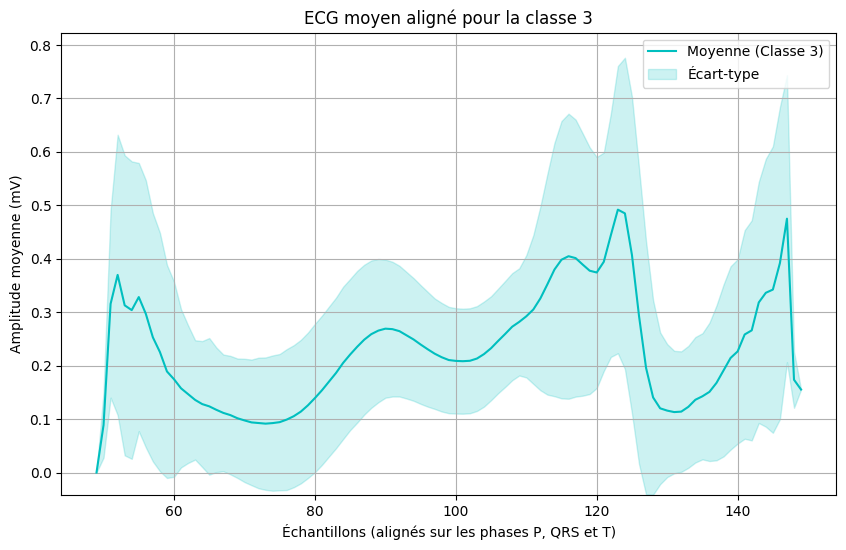

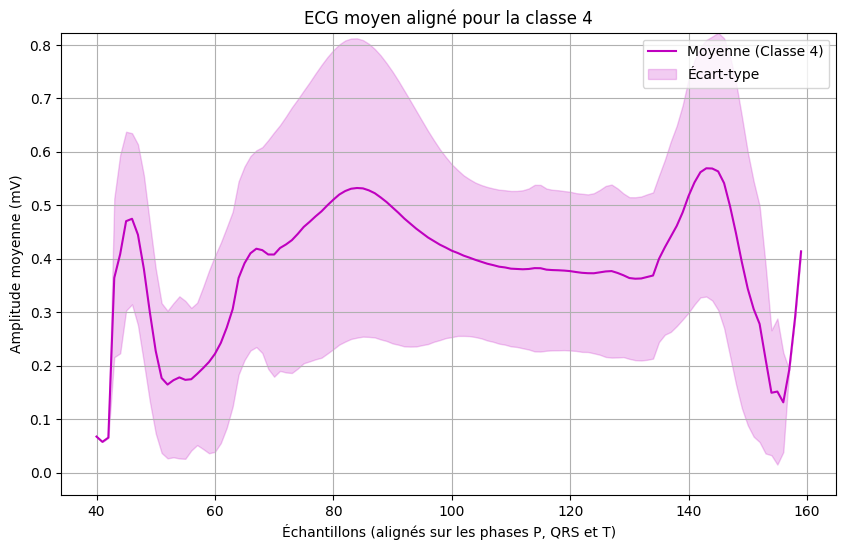

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)
    if len(peaks) == 0:
        return None, None, None
    r_peak = peaks[0]
    p_wave = max(0, r_peak - 30)
    t_wave = min(len(signal) - 1, r_peak + 50)
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = np.array(signal[~np.isnan(signal)])
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue
        start = max(0, p_wave - 20)
        end = min(len(signal), t_wave + 20)
        segment = signal[start:end]
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer les signaux moyens alignés pour chaque classe
mean_signals = {}
std_signals = {}
classes = df['Classe'].unique()
colors = ['b', 'g', 'r', 'c', 'm']  # Une couleur différente par classe

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
        std_signals[cls] = np.nanstd(aligned_signals, axis=0)

# Générer un schéma pour chaque classe, avec la même échelle
y_min = min([np.nanmin(mean_signals[cls] - std_signals[cls]) for cls in classes])
y_max = max([np.nanmax(mean_signals[cls] + std_signals[cls]) for cls in classes])

for i, cls in enumerate(classes):
    mean_signal = mean_signals[cls]
    std_signal = std_signals[cls]
    x = range(len(mean_signal))

    plt.figure(figsize=(10, 6))
    plt.plot(x, mean_signal, color=colors[i % len(colors)], label=f'Moyenne (Classe {cls})')
    plt.fill_between(x, mean_signal - std_signal, mean_signal + std_signal, color=colors[i % len(colors)], alpha=0.2, label='Écart-type')
    plt.ylim(y_min, y_max)  # Fixer la même échelle pour toutes les classes
    plt.title(f"ECG moyen aligné pour la classe {cls}")
    plt.xlabel("Échantillons (alignés sur les phases P, QRS et T)")
    plt.ylabel("Amplitude moyenne (mV)")
    plt.legend()
    plt.grid(True)
    plt.show()


In [24]:
import pandas as pd
import numpy as np
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)
    if len(peaks) == 0:
        return None, None, None
    r_peak = peaks[0]
    p_wave = max(0, r_peak - 30)
    t_wave = min(len(signal) - 1, r_peak + 50)
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = np.array(signal[~np.isnan(signal)])
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue
        start = max(0, p_wave - 20)
        end = min(len(signal), t_wave + 20)
        segment = signal[start:end]
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calculer la variance des amplitudes pour chaque classe
variances = {}
classes = df['Classe'].unique()

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        variances[cls] = np.nanvar(aligned_signals)  # Calcul de la variance globale des amplitudes pour la classe

# Afficher les variances par classe
print("Variance des amplitudes pour chaque classe :")
for cls, var in variances.items():
    print(f"Classe {cls}: Variance = {var:.6f}")


Chargement des données: 109446it [00:03, 35641.27it/s]
Traitement des classes: 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]

Variance des amplitudes pour chaque classe :
Classe 0: Variance = 0.041564
Classe 1: Variance = 0.032227
Classe 2: Variance = 0.052257
Classe 3: Variance = 0.036405
Classe 4: Variance = 0.048466


In [26]:
import pandas as pd
import numpy as np
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Calculer la variance des amplitudes pour chaque classe sans alignement
variances = {}
classes = df['Classe'].unique()

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values  # Récupérer les signaux de la classe
    signal_variances = []  # Liste pour accumuler les variances des signaux individuels
    for row in class_data:
        clean_signal = row[~np.isnan(row)]  # Supprimer les NaN dans le signal
        if len(clean_signal) > 0:  # Vérifier que le signal n'est pas vide
            signal_variances.append(np.var(clean_signal))  # Calculer la variance du signal
    variances[cls] = np.mean(signal_variances)  # Calculer la moyenne des variances des signaux de la classe

# Afficher les variances par classe
print("Variance des amplitudes pour chaque classe (sans alignement) :")
for cls, var in variances.items():
    print(f"Classe {cls}: Variance = {var:.6f}")


Chargement des données: 109446it [00:02, 36523.25it/s]
Traitement des classes: 100%|██████████| 5/5 [00:00<00:00,  5.84it/s]

Variance des amplitudes pour chaque classe (sans alignement) :
Classe 0: Variance = 0.021183
Classe 1: Variance = 0.018344
Classe 2: Variance = 0.023387
Classe 3: Variance = 0.028739
Classe 4: Variance = 0.031268


Chargement des données: 109446it [00:02, 37757.34it/s]
Traitement des classes: 100%|██████████| 5/5 [00:00<00:00,  5.13it/s]


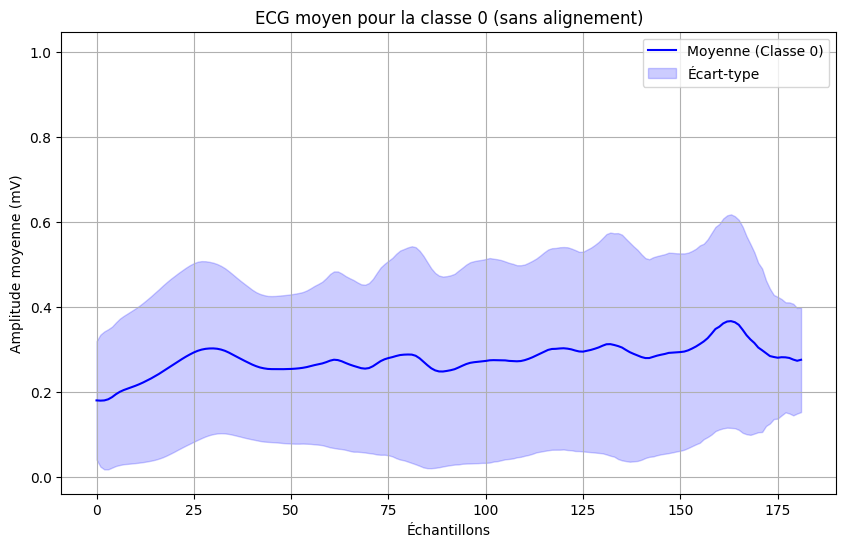

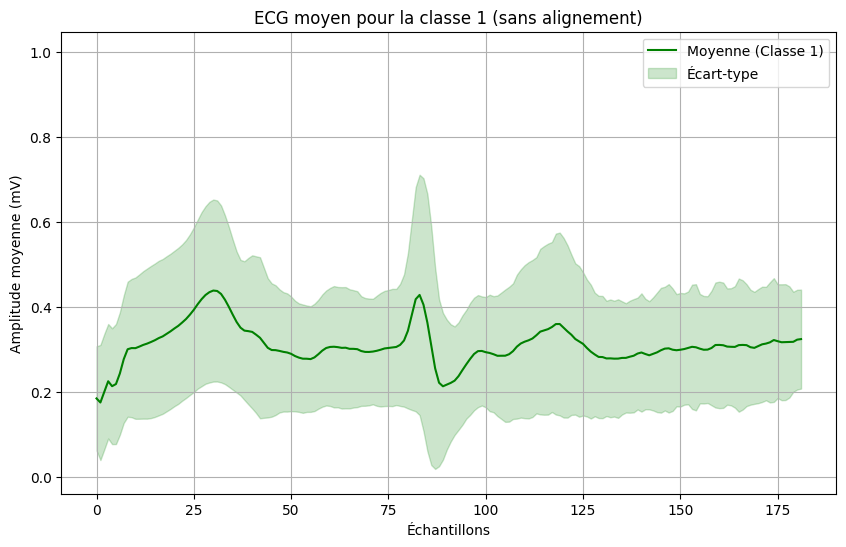

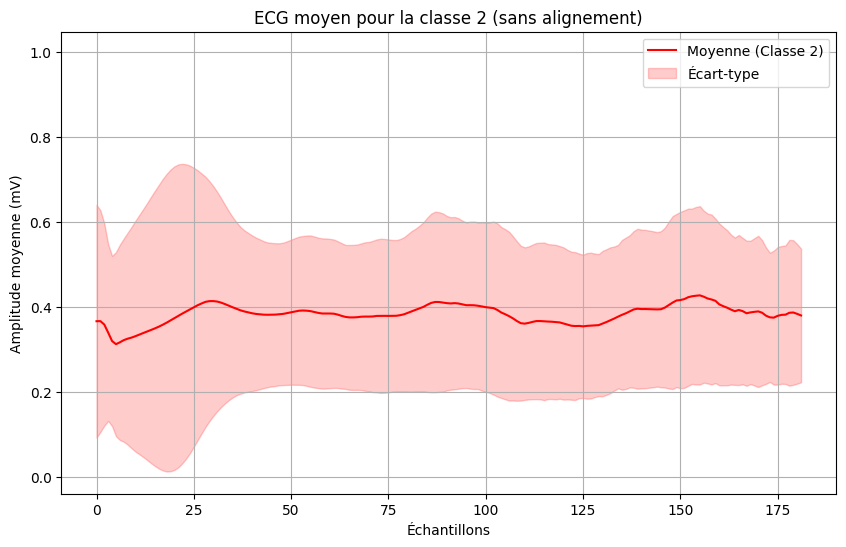

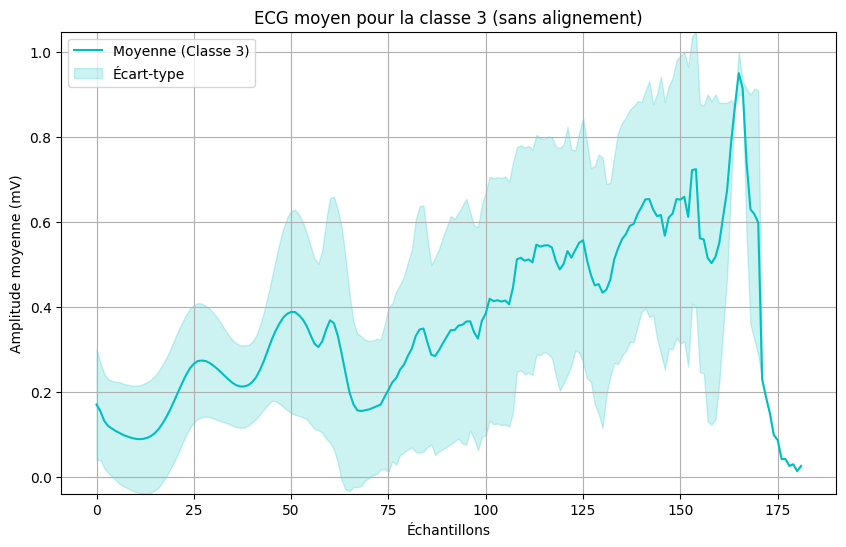

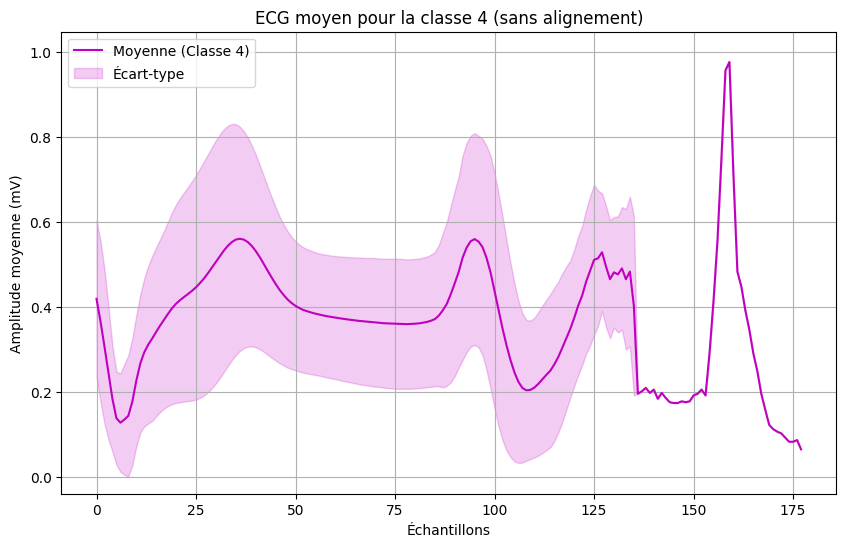

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Calcul des statistiques par classe
mean_signals = {}
std_signals = {}
classes = df['Classe'].unique()
colors = ['b', 'g', 'r', 'c', 'm']  # Couleurs pour les classes

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = []  # Pas d'alignement ici
    for row in class_data:
        clean_signal = row[~np.isnan(row)]  # Supprimer les NaN dans le signal
        aligned_signals.append(clean_signal)
    aligned_signals = np.array(aligned_signals, dtype=object)  # Stocker les signaux de longueurs variables
    max_length = max(len(sig) for sig in aligned_signals)  # Déterminer la longueur maximale pour normaliser

    # Normaliser les signaux à la même longueur par padding
    padded_signals = np.array(
        [np.pad(sig, (0, max_length - len(sig)), constant_values=np.nan) for sig in aligned_signals]
    )

    # Calculer la moyenne et l'écart-type tout en ignorant les NaN
    mean_signals[cls] = np.nanmean(padded_signals, axis=0)
    std_signals[cls] = np.nanstd(padded_signals, axis=0)

# Générer un schéma pour chaque classe, avec la même échelle
y_min = min([np.nanmin(mean_signals[cls] - std_signals[cls]) for cls in classes])
y_max = max([np.nanmax(mean_signals[cls] + std_signals[cls]) for cls in classes])

for i, cls in enumerate(classes):
    mean_signal = mean_signals[cls]
    std_signal = std_signals[cls]
    x = range(len(mean_signal))

    plt.figure(figsize=(10, 6))
    plt.plot(x, mean_signal, color=colors[i % len(colors)], label=f'Moyenne (Classe {cls})')
    plt.fill_between(x, mean_signal - std_signal, mean_signal + std_signal, color=colors[i % len(colors)], alpha=0.2, label='Écart-type')
    plt.ylim(y_min, y_max)  # Fixer la même échelle pour toutes les classes
    plt.title(f"ECG moyen pour la classe {cls} (sans alignement)")
    plt.xlabel("Échantillons")
    plt.ylabel("Amplitude moyenne (mV)")
    plt.legend()
    plt.grid(True)
    plt.show()


Chargement des données: 109446it [00:03, 29326.34it/s]
Alignement des signaux: 100%|██████████| 90589/90589 [00:02<00:00, 44378.44it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/335125308.py:69: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux: 100%|██████████| 2779/2779 [00:00<00:00, 47433.48it/s]
/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_86492/335125308.py:69: RuntimeWarning: Mean of empty slice
  mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
Alignement des signaux:

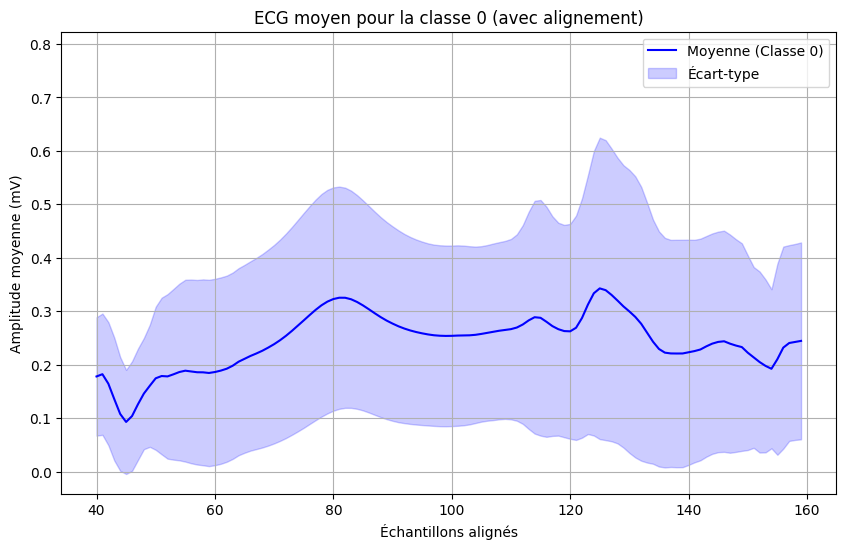

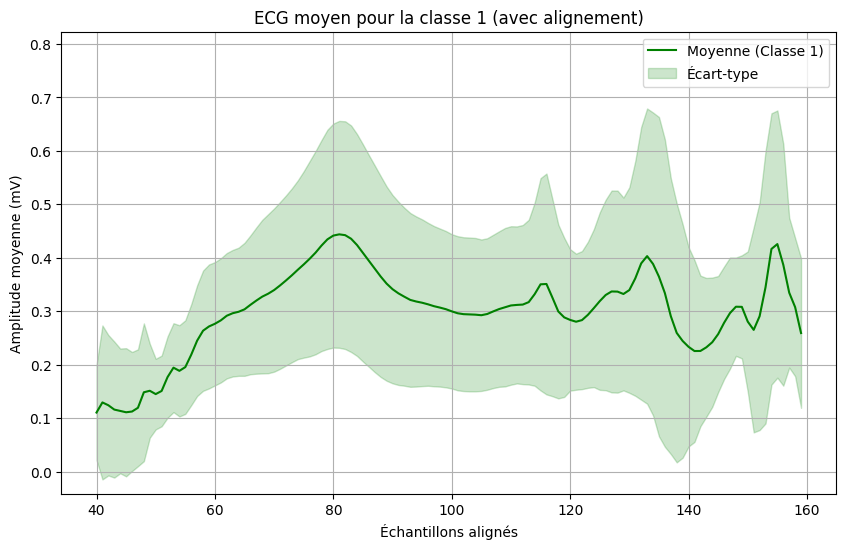

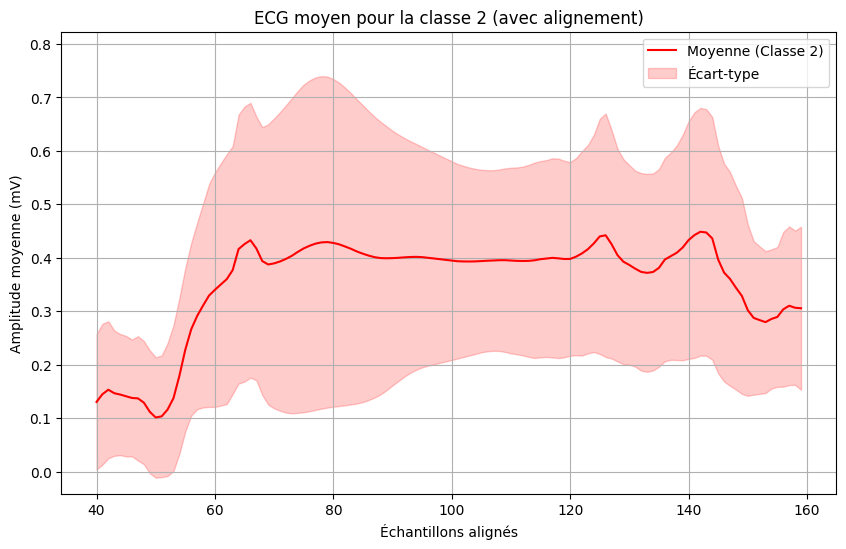

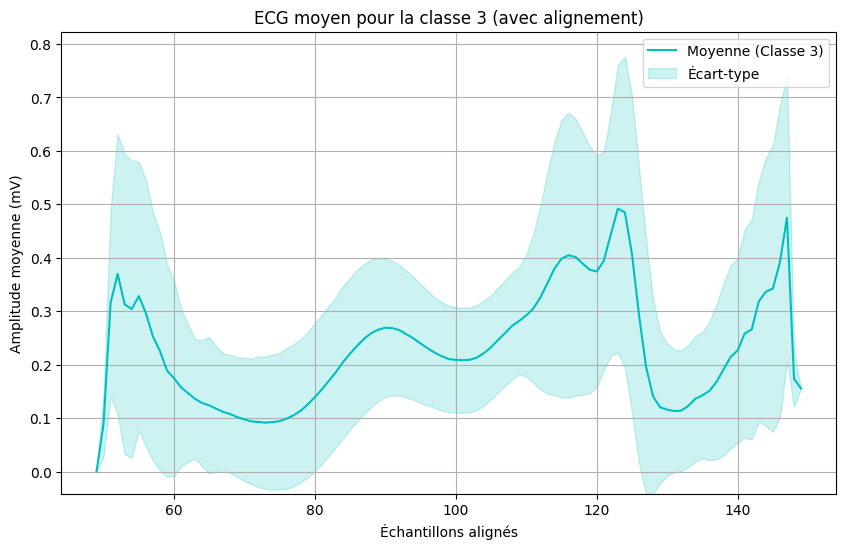

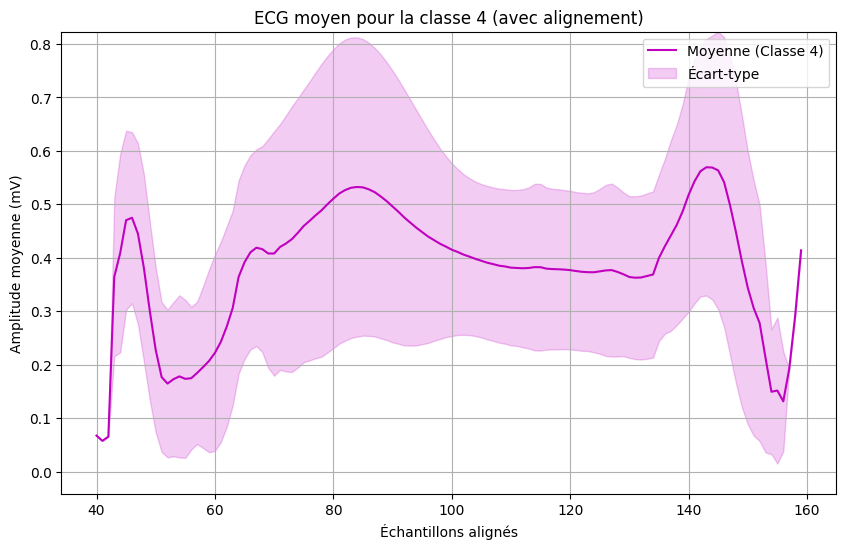

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Fonction pour détecter les phases P, QRS et T
def detect_phases(signal):
    peaks, _ = find_peaks(signal, height=np.mean(signal) * 1.2)
    if len(peaks) == 0:
        return None, None, None
    r_peak = peaks[0]
    p_wave = max(0, r_peak - 30)
    t_wave = min(len(signal) - 1, r_peak + 50)
    return p_wave, r_peak, t_wave

# Fonction pour aligner les signaux sur les phases P, QRS et T
def align_on_phases(signals, fixed_length=200):
    aligned_signals = []
    for signal in tqdm(signals, desc="Alignement des signaux"):
        signal = np.array(signal[~np.isnan(signal)])
        p_wave, r_peak, t_wave = detect_phases(signal)
        if p_wave is None or r_peak is None or t_wave is None:
            continue
        start = max(0, p_wave - 20)
        end = min(len(signal), t_wave + 20)
        segment = signal[start:end]
        if len(segment) < fixed_length:
            pad_before = (fixed_length - len(segment)) // 2
            pad_after = fixed_length - len(segment) - pad_before
            segment = np.pad(segment, (pad_before, pad_after), constant_values=np.nan)
        else:
            segment = segment[:fixed_length]
        aligned_signals.append(segment)
    return np.array(aligned_signals)

# Calcul des statistiques par classe pour signaux alignés
mean_signals = {}
std_signals = {}
classes = df['Classe'].unique()
colors = ['b', 'g', 'r', 'c', 'm']  # Couleurs pour les classes

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    aligned_signals = align_on_phases(class_data)
    if len(aligned_signals) > 0:
        mean_signals[cls] = np.nanmean(aligned_signals, axis=0)
        std_signals[cls] = np.nanstd(aligned_signals, axis=0)

# Générer un schéma pour chaque classe, avec la même échelle
y_min = min([np.nanmin(mean_signals[cls] - std_signals[cls]) for cls in classes if cls in mean_signals])
y_max = max([np.nanmax(mean_signals[cls] + std_signals[cls]) for cls in classes if cls in mean_signals])

for i, cls in enumerate(classes):
    if cls in mean_signals:
        mean_signal = mean_signals[cls]
        std_signal = std_signals[cls]
        x = range(len(mean_signal))

        plt.figure(figsize=(10, 6))
        plt.plot(x, mean_signal, color=colors[i % len(colors)], label=f'Moyenne (Classe {cls})')
        plt.fill_between(x, mean_signal - std_signal, mean_signal + std_signal, color=colors[i % len(colors)], alpha=0.2, label='Écart-type')
        plt.ylim(y_min, y_max)  # Fixer la même échelle pour toutes les classes
        plt.title(f"ECG moyen pour la classe {cls} (avec alignement)")
        plt.xlabel("Échantillons alignés")
        plt.ylabel("Amplitude moyenne (mV)")
        plt.legend()
        plt.grid(True)
        plt.show()


In [29]:
import pandas as pd
import numpy as np
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger les données ligne par ligne
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # La dernière colonne contient la classe
        # Exclure les 5 premières colonnes et conserver les colonnes pertinentes
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes où la classe est invalide
df['Classe'] = df['Classe'].astype(int)

# Calculer la longueur des signaux et la variance des longueurs pour chaque classe
length_variances = {}
classes = df['Classe'].unique()

for cls in tqdm(classes, desc="Traitement des classes"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    signal_lengths = [len(row[~np.isnan(row)]) for row in class_data]  # Calculer les longueurs des signaux
    length_variances[cls] = np.var(signal_lengths)  # Variance des longueurs au sein de la classe

# Afficher la variance des longueurs pour chaque classe
print("Variance des longueurs des signaux ECG au sein de chaque classe :")
for cls, var in length_variances.items():
    print(f"Classe {cls}: Variance des longueurs = {var:.6f}")


Chargement des données: 109446it [00:02, 36488.90it/s]
Traitement des classes: 100%|██████████| 5/5 [00:00<00:00, 35.98it/s]

Variance des longueurs des signaux ECG au sein de chaque classe :
Classe 0: Variance des longueurs = 738.423540
Classe 1: Variance des longueurs = 1525.098664
Classe 2: Variance des longueurs = 1227.134474
Classe 3: Variance des longueurs = 189.286865
Classe 4: Variance des longueurs = 91.945205


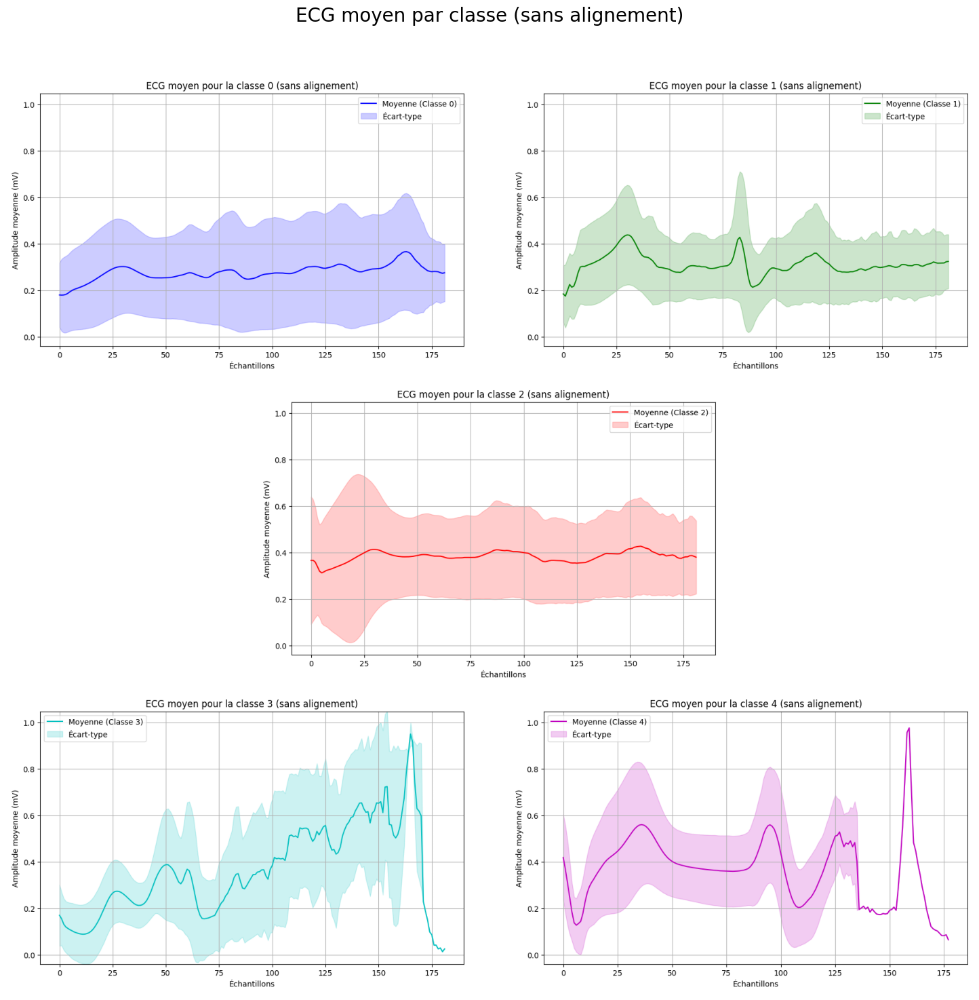

In [65]:
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Chemins des fichiers images
image_files = [
    "var0 net.png",  # Remplacez par les chemins exacts des fichiers si nécessaire
    "var1 net.png",
    "var2 net.png",
    "var3 net.png",
    "var4 net.png"
]

# Charger les images
images = [Image.open(img) for img in image_files]

# Configurer la grille asymétrique : 3 lignes (2, 1, 2 colonnes)
fig = plt.figure(figsize=(15, 15))
gs = GridSpec(3, 2, figure=fig)

# Placer les images dans la grille
ax1 = fig.add_subplot(gs[0, 0])  # Première ligne, première colonne
ax2 = fig.add_subplot(gs[0, 1])  # Première ligne, deuxième colonne
ax3 = fig.add_subplot(gs[1, :])  # Deuxième ligne, occupe toute la largeur
ax4 = fig.add_subplot(gs[2, 0])  # Troisième ligne, première colonne
ax5 = fig.add_subplot(gs[2, 1])  # Troisième ligne, deuxième colonne

axes = [ax1, ax2, ax3, ax4, ax5]

# Ajouter les images dans les axes et désactiver les axes
for ax, img in zip(axes, images):
    ax.imshow(img)
    ax.axis("off")

# Ajouter un titre global
fig.suptitle("ECG moyen par classe (sans alignement)", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Afficher le cadre
plt.show()


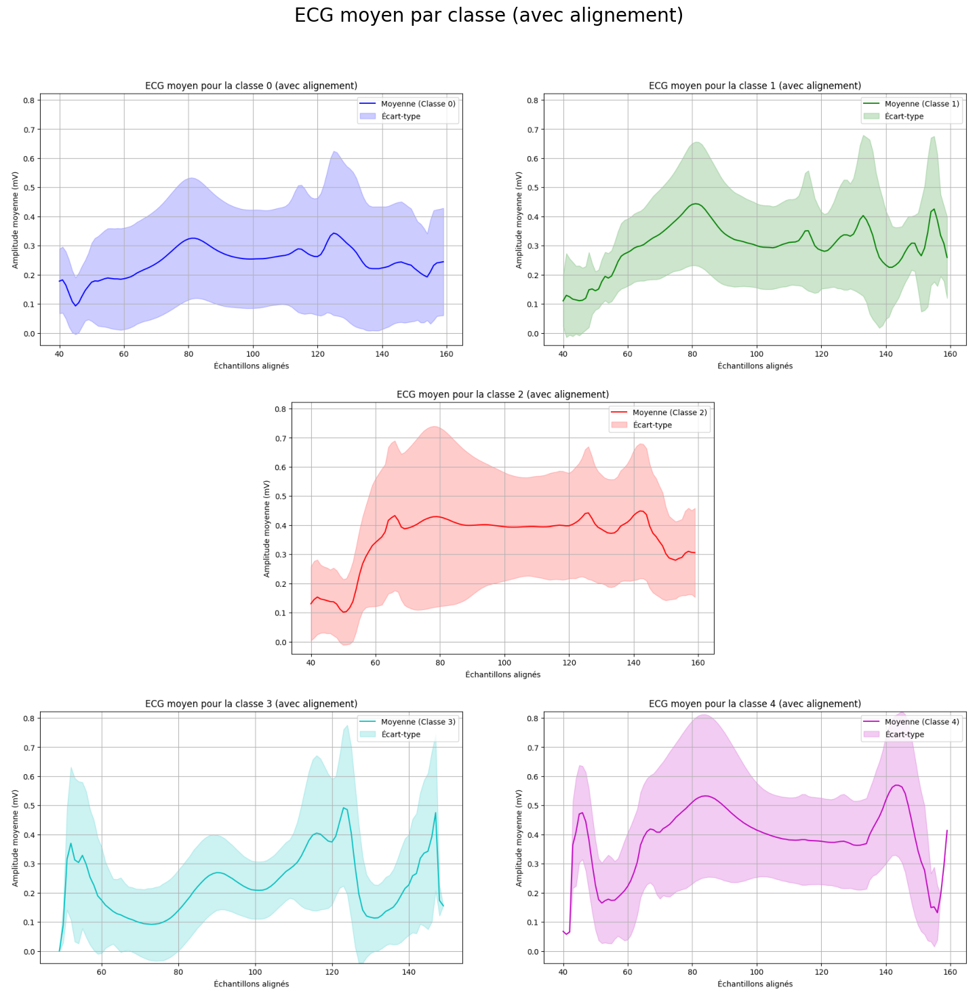

In [66]:
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Chemins des fichiers images
image_files = [
    "var1 al.png",  # Remplacez par les chemins exacts des fichiers si nécessaire
    "var2 al.png",
    "var3 al.png",
    "var4 al.png",
    "var5 al.png"
]

# Charger les images
images = [Image.open(img) for img in image_files]

# Configurer une grille asymétrique : 3 lignes (2, 1, 2 colonnes)
fig = plt.figure(figsize=(15, 15))
gs = GridSpec(3, 2, figure=fig)

# Placer les images dans la grille
ax1 = fig.add_subplot(gs[0, 0])  # Première ligne, première colonne
ax2 = fig.add_subplot(gs[0, 1])  # Première ligne, deuxième colonne
ax3 = fig.add_subplot(gs[1, :])  # Deuxième ligne, occupe toute la largeur
ax4 = fig.add_subplot(gs[2, 0])  # Troisième ligne, première colonne
ax5 = fig.add_subplot(gs[2, 1])  # Troisième ligne, deuxième colonne

axes = [ax1, ax2, ax3, ax4, ax5]

# Ajouter les images dans les axes et désactiver les axes
for ax, img in zip(axes, images):
    ax.imshow(img)
    ax.axis("off")

# Ajouter un titre global
fig.suptitle("ECG moyen par classe (avec alignement)", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Afficher le cadre
plt.show()


In [72]:
import csv
import pandas as pd
import numpy as np
from dtaidistance import dtw
from scipy.stats import pearsonr

# Charger les données avec gestion des longueurs variables
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []
max_length = 0

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        try:
            classe = row[-1].strip()
            signal = [float(x.strip()) for x in row[:-1] if x.strip() != '' and x.strip() != '0']
            data.append(signal)
            classes.append(classe)
            max_length = max(max_length, len(signal))  # Identifier la longueur maximale
        except ValueError:
            continue  # Ignorer les lignes mal formatées

# Normaliser les longueurs des signaux (remplir avec des zéros ou tronquer)
normalized_data = [signal + [0] * (max_length - len(signal)) if len(signal) < max_length else signal[:max_length] for signal in data]

# Convertir en DataFrame
df = pd.DataFrame(normalized_data)
df['Groupe'] = pd.to_numeric(classes, errors='coerce')  # Convertir les classes en numériques
df = df.dropna(subset=['Groupe'])  # Supprimer les lignes avec des classes invalides
df['Groupe'] = df['Groupe'].astype(int)  # Convertir en entiers

# Supprimer les colonnes entièrement vides
df.dropna(axis=1, how="all", inplace=True)

def aligned_pearson_correlation(signal_1, signal_2):
    """
    Calcule la corrélation de Pearson entre deux signaux ECG alignés par DTW.
    """
    dtw_path = dtw.warping_path(signal_1, signal_2)
    aligned_signal_1 = np.array([signal_1[i] for i, j in dtw_path if i < len(signal_1) and j < len(signal_2)])
    aligned_signal_2 = np.array([signal_2[j] for i, j in dtw_path if i < len(signal_1) and j < len(signal_2)])
    corr, _ = pearsonr(aligned_signal_1, aligned_signal_2)
    return corr

def random_pair_correlation(class_number, n):
    """
    Tire aléatoirement n paires de signaux appartenant à la même classe et calcule la corrélation alignée.
    """
    class_data = df[df['Groupe'] == class_number].iloc[:, :-1].values  # Exclure la colonne de classe
    
    # Vérifier s'il y a assez de signaux
    if len(class_data) < 2:
        raise ValueError("Pas assez de signaux pour tirer des paires.")
    
    correlations = []
    for _ in range(min(n, len(class_data) // 2)):  # Ajuster à la taille réelle si n est trop grand
        indices = np.random.choice(len(class_data), size=2, replace=False)  # Tirage d'indices
        signal_1 = np.array(class_data[indices[0]])
        signal_2 = np.array(class_data[indices[1]])
        
        if signal_1.ndim != 1 or signal_2.ndim != 1:  # Vérification de la dimension
            raise ValueError("Les signaux doivent être 1D.")
        
        corr = aligned_pearson_correlation(signal_1, signal_2)
        correlations.append(corr)
    
    return np.mean(correlations)

if __name__ == "__main__":
    n = 100  # Nombre maximum de paires
    classes = df['Groupe'].unique()

    results = {}
    for class_number in classes:
        try:
            num_signals = df[df['Groupe'] == class_number].shape[0]
            if num_signals < 2:
                print(f"Classe {class_number} : Pas assez de signaux pour tirer des paires.")
                continue
            
            max_pairs = min(n, num_signals // 2)  # Ajuster le nombre de paires
            mean_correlation = random_pair_correlation(class_number, max_pairs)
            results[class_number] = mean_correlation
            print(f"Classe {class_number} - Moyenne des corrélations : {mean_correlation}")
        except ValueError as e:
            print(f"Erreur pour la classe {class_number} : {e}")


Classe 0 - Moyenne des corrélations : 0.945792420629652
Classe 1 - Moyenne des corrélations : 0.8942707396030473
Classe 2 - Moyenne des corrélations : 0.9202208432706503
Classe 3 - Moyenne des corrélations : 0.9732830470213092
Classe 4 - Moyenne des corrélations : 0.9623631233961107


In [4]:
import csv
import pandas as pd
import numpy as np
from dtaidistance import dtw
from scipy.stats import pearsonr

# Charger les données avec gestion des longueurs variables
file_path = "cleaned_mitbih_fus.csv"

data = []
classes = []
max_length = 0

with open(file_path, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        # La dernière colonne contient la classe
        try:
            classe = row[-1].strip()
            signal = [float(x.strip()) for x in row[:-1] if x.strip() != '' and x.strip() != '0']
            data.append(signal)
            classes.append(classe)
            max_length = max(max_length, len(signal))  # Identifier la longueur maximale
        except ValueError:
            continue  # Ignorer les lignes mal formatées

# Normaliser les longueurs des signaux (remplir avec des zéros ou tronquer)
normalized_data = [signal + [0] * (max_length - len(signal)) if len(signal) < max_length else signal[:max_length] for signal in data]

# Convertir en DataFrame
df = pd.DataFrame(normalized_data)
df['Groupe'] = pd.to_numeric(classes, errors='coerce')  # Convertir les classes en numériques
df = df.dropna(subset=['Groupe'])  # Supprimer les lignes avec des classes invalides
df['Groupe'] = df['Groupe'].astype(int)  # Convertir en entiers après nettoyage

# Supprimer les cinq premières colonnes
df = df.iloc[:, 5:]  # Garder uniquement les colonnes après les cinq premières

def aligned_pearson_correlation(signal_1, signal_2):
    """
    Calcule la corrélation de Pearson entre deux signaux ECG alignés par DTW.
    """
    dtw_path = dtw.warping_path(signal_1, signal_2)
    aligned_signal_1 = np.array([signal_1[i] for i, j in dtw_path if i < len(signal_1) and j < len(signal_2)])
    aligned_signal_2 = np.array([signal_2[j] for i, j in dtw_path if i < len(signal_1) and j < len(signal_2)])
    corr, _ = pearsonr(aligned_signal_1, aligned_signal_2)
    return corr

def random_pair_correlation(class_number, n):
    """
    Tire aléatoirement n paires de signaux appartenant à la même classe et calcule la corrélation alignée.
    """
    class_data = df[df['Groupe'] == class_number].iloc[:, :-1].values  # Exclure la colonne de classe
    
    # Vérifier s'il y a assez de signaux
    if len(class_data) < 2:
        raise ValueError("Pas assez de signaux pour tirer des paires.")
    
    correlations = []
    for _ in range(min(n, len(class_data) // 2)):  # Ajuster à la taille réelle si n est trop grand
        indices = np.random.choice(len(class_data), size=2, replace=False)  # Tirage d'indices
        signal_1 = np.array(class_data[indices[0]])
        signal_2 = np.array(class_data[indices[1]])
        
        if signal_1.ndim != 1 or signal_2.ndim != 1:  # Vérification de la dimension
            raise ValueError("Les signaux doivent être 1D.")
        
        corr = aligned_pearson_correlation(signal_1, signal_2)
        correlations.append(corr)
    
    return np.mean(correlations)

if __name__ == "__main__":
    n = 100  # Nombre maximum de paires
    classes = df['Groupe'].unique()

    results = {}
    for class_number in classes:
        try:
            num_signals = df[df['Groupe'] == class_number].shape[0]
            if num_signals < 2:
                print(f"Classe {class_number} : Pas assez de signaux pour tirer des paires.")
                continue
            
            max_pairs = min(n, num_signals // 2)  # Ajuster le nombre de paires
            mean_correlation = random_pair_correlation(class_number, max_pairs)
            results[class_number] = mean_correlation
            print(f"Classe {class_number} - Moyenne des corrélations : {mean_correlation}")
        except ValueError as e:
            print(f"Erreur pour la classe {class_number} : {e}")


Classe 0 - Moyenne des corrélations : 0.923820199354891
Classe 1 - Moyenne des corrélations : 0.8691807550432096
Classe 2 - Moyenne des corrélations : 0.9162294356804905
Classe 3 - Moyenne des corrélations : 0.9645086046980902
Classe 4 - Moyenne des corrélations : 0.9493999985247962


Chargement des données: 109446it [00:03, 31399.62it/s]
Application du padding: 100%|██████████| 5/5 [00:00<00:00,  5.53it/s]


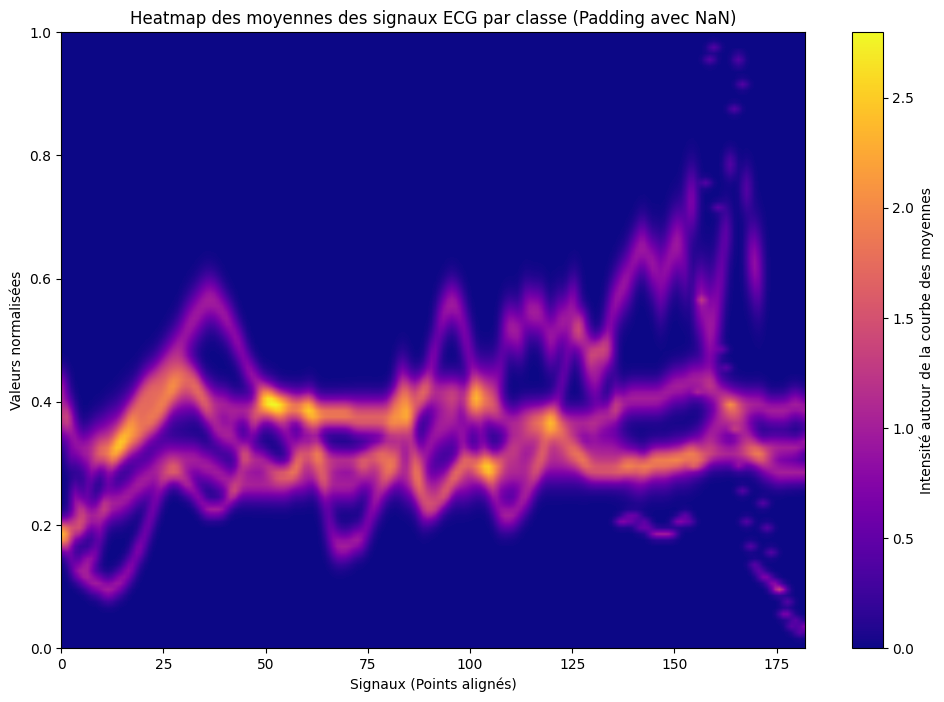

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from tqdm import tqdm

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Lecture des données avec gestion des longueurs variables
with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # Dernière colonne : classe
        # Exclure les cinq premières colonnes et les NaN
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique et nettoyer les lignes invalides
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)

# Calcul de la longueur maximale des signaux
max_length = max(len(signal[~np.isnan(signal)]) for signal in df.drop(columns=['Classe']).values)

# Fonction pour aligner les signaux avec du padding
def pad_signal(signal, target_length):
    """
    Aligne un signal en le complétant avec des NaN pour atteindre une longueur cible.
    """
    signal = signal[~np.isnan(signal)]  # Supprimer les NaN
    return np.pad(signal, (0, target_length - len(signal)), constant_values=np.nan)

# Appliquer le padding aux signaux
padded_signals = []
padded_classes = []
for cls in tqdm(df['Classe'].unique(), desc="Application du padding"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    for signal in class_data:
        padded_signals.append(pad_signal(signal, max_length))
        padded_classes.append(cls)

# Convertir les données alignées en DataFrame
aligned_df = pd.DataFrame(padded_signals)
aligned_df['Classe'] = padded_classes

# Initialisation de la heatmap
num_signaux = max_length  # Nombre de points par signal
num_valeurs = 100  # Résolution verticale
heatmap_data = np.zeros((num_valeurs, num_signaux))

# Calcul des moyennes et des écarts-types pour chaque groupe
for group in aligned_df['Classe'].unique():
    groupe_data = aligned_df[aligned_df['Classe'] == group].drop(columns=['Classe'])
    moyenne_par_signal = groupe_data.mean(skipna=True)
    ecart_type_par_signal = groupe_data.std(skipna=True)

    # Ajouter la diffusion dans la heatmap
    for i, (val, std) in enumerate(zip(moyenne_par_signal, ecart_type_par_signal)):
        if np.isnan(val):  # Ignorer les NaN
            continue
        y_position = int((1 - val) * (num_valeurs - 1))  # Inverser la position Y
        if 0 <= y_position < num_valeurs:
            sigma_local = max(0.5, std * 10)
            heatmap_data[:, i] += np.exp(-0.5 * ((np.arange(num_valeurs) - y_position) / sigma_local) ** 2)

# Appliquer un flou global pour lisser l'image
heatmap_data = gaussian_filter1d(heatmap_data, sigma=1, axis=1)

# Tracer la heatmap
plt.figure(figsize=(12, 8))
plt.imshow(heatmap_data, aspect='auto', cmap='plasma', interpolation='bilinear',
           extent=[0, num_signaux, 0, 1])

# Configurer les axes et la colorbar
plt.colorbar(label="Intensité autour de la courbe des moyennes")
plt.xlabel("Signaux (Points alignés)")
plt.ylabel("Valeurs normalisées")
plt.title("Heatmap des moyennes des signaux ECG par classe (Padding avec NaN)")
plt.grid(False)
plt.show()


Chargement des données: 109446it [00:03, 31485.68it/s]
Alignement des signaux: 100%|██████████| 5/5 [00:00<00:00,  9.30it/s]


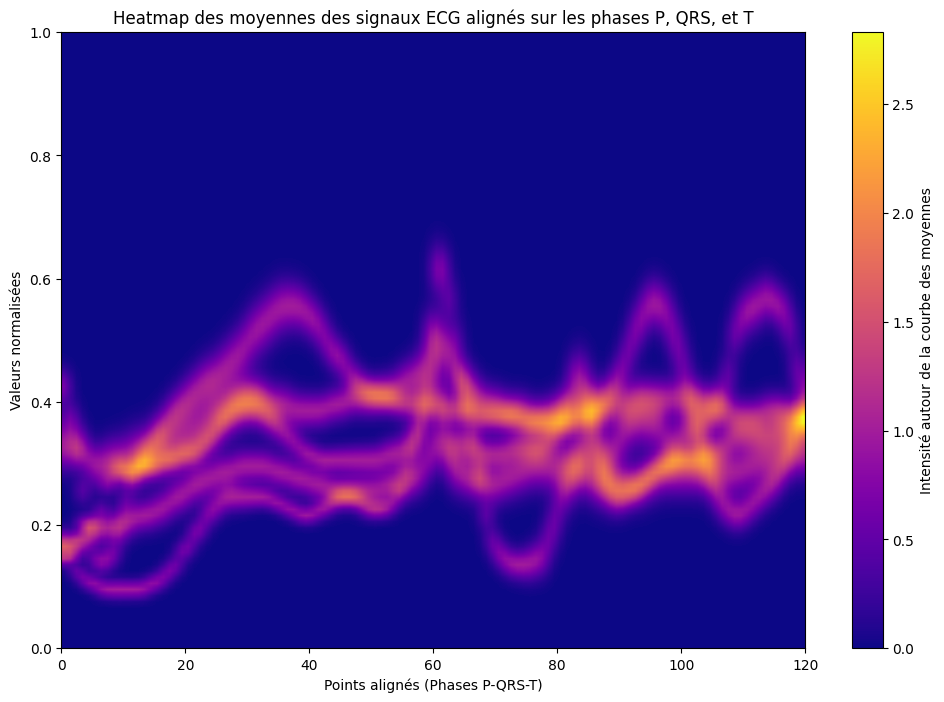

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from tqdm import tqdm

# Fonction pour détecter les phases P, QRS, et T
def detect_pqrst(signal):
    """
    Détecte approximativement les phases P, QRS, et T dans un signal ECG.
    Cette fonction est un exemple simplifié basé sur les maximums locaux pour QRS.
    Dans un contexte réel, utiliser une méthode plus robuste.
    """
    signal = np.array(signal)
    qrs_idx = np.argmax(np.abs(signal))  # Pic QRS (plus grande amplitude)
    p_idx = max(0, qrs_idx - 40)        # Approximativement 40 points avant QRS
    t_idx = min(len(signal) - 1, qrs_idx + 60)  # Approximativement 60 points après QRS
    return p_idx, qrs_idx, t_idx

# Aligner un signal sur les phases P, QRS, et T
def align_signal(signal, target_length):
    """
    Aligne un signal ECG en utilisant les positions des phases P, QRS, et T.
    Le signal est ré-aligné et complété avec des NaN si nécessaire.
    """
    signal = np.array(signal)
    signal = signal[~np.isnan(signal)]  # Supprimer les NaN
    p_idx, qrs_idx, t_idx = detect_pqrst(signal)

    # Fixer des positions cibles pour P, QRS, et T dans le signal aligné
    target_p, target_qrs, target_t = 30, 60, 90
    aligned_signal = np.full(target_length, np.nan)  # Signal aligné avec NaN

    # Calcul des décalages pour alignement
    start_idx = max(0, target_qrs - qrs_idx)
    end_idx = min(target_length, start_idx + len(signal))

    # Insérer le signal aligné
    aligned_signal[start_idx:end_idx] = signal[:end_idx - start_idx]
    return aligned_signal

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

with open(file_path, 'r') as file:
    for row in tqdm(file, desc="Chargement des données"):
        values = row.strip().split(',')
        classes.append(values[-1])  # Dernière colonne : classe
        # Exclure les cinq premières colonnes et les NaN
        data.append([float(x) if x.strip() != '' else np.nan for x in values[5:-1]])

# Convertir les données en DataFrame
df = pd.DataFrame(data)
df['Classe'] = classes

# Convertir la colonne Classe en numérique et nettoyer les lignes invalides
df['Classe'] = pd.to_numeric(df['Classe'], errors='coerce')
df = df.dropna(subset=['Classe'])  # Supprimer les lignes avec des classes invalides
df['Classe'] = df['Classe'].astype(int)

# Calcul de la longueur cible pour l'alignement
target_length = 120  # Longueur fixe pour tous les signaux après alignement

# Aligner les signaux sur les phases P, QRS, T
aligned_signals = []
aligned_classes = []
for cls in tqdm(df['Classe'].unique(), desc="Alignement des signaux"):
    class_data = df[df['Classe'] == cls].drop(columns=['Classe']).values
    for signal in class_data:
        aligned_signals.append(align_signal(signal, target_length))
        aligned_classes.append(cls)

# Convertir les données alignées en DataFrame
aligned_df = pd.DataFrame(aligned_signals)
aligned_df['Classe'] = aligned_classes

# Initialisation de la heatmap
num_signaux = target_length  # Nombre de points par signal aligné
num_valeurs = 100  # Résolution verticale
heatmap_data = np.zeros((num_valeurs, num_signaux))

# Calcul des moyennes et des écarts-types pour chaque groupe
for group in aligned_df['Classe'].unique():
    groupe_data = aligned_df[aligned_df['Classe'] == group].drop(columns=['Classe'])
    moyenne_par_signal = groupe_data.mean(skipna=True)
    ecart_type_par_signal = groupe_data.std(skipna=True)

    # Ajouter la diffusion dans la heatmap
    for i, (val, std) in enumerate(zip(moyenne_par_signal, ecart_type_par_signal)):
        if np.isnan(val):  # Ignorer les NaN
            continue
        y_position = int((1 - val) * (num_valeurs - 1))  # Inverser la position Y
        if 0 <= y_position < num_valeurs:
            sigma_local = max(0.5, std * 10)
            heatmap_data[:, i] += np.exp(-0.5 * ((np.arange(num_valeurs) - y_position) / sigma_local) ** 2)

# Appliquer un flou global pour lisser l'image
heatmap_data = gaussian_filter1d(heatmap_data, sigma=1, axis=1)

# Tracer la heatmap
plt.figure(figsize=(12, 8))
plt.imshow(heatmap_data, aspect='auto', cmap='plasma', interpolation='bilinear',
           extent=[0, num_signaux, 0, 1])

# Configurer les axes et la colorbar
plt.colorbar(label="Intensité autour de la courbe des moyennes")
plt.xlabel("Points alignés (Phases P-QRS-T)")
plt.ylabel("Valeurs normalisées")
plt.title("Heatmap des moyennes des signaux ECG alignés sur les phases P, QRS, et T")
plt.grid(False)
plt.show()


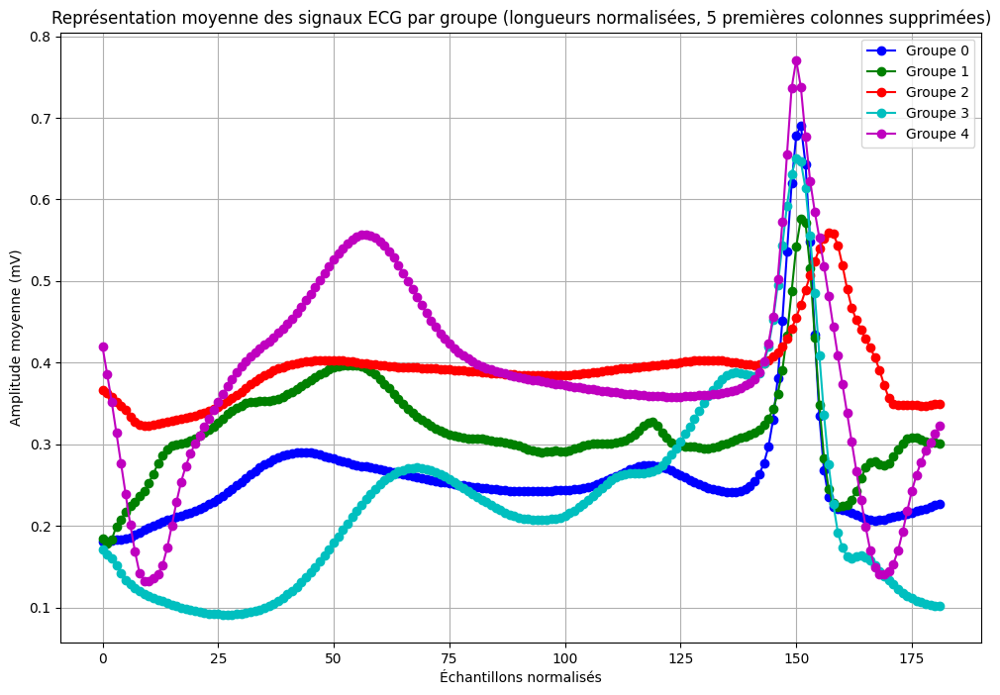

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Charger les données avec gestion des longueurs variables
file_path = "cleaned_mitbih_fus.csv"
data = []
classes = []

# Charger le fichier et traiter les lignes
with open(file_path, 'r') as file:
    for line in file:
        row = line.strip().split(',')
        try:
            # La dernière colonne contient la classe
            class_label = int(float(row[-1].strip()))  # Convertir la classe en entier
            signal = [float(x.strip()) for x in row[:-1] if x.strip()]  # Charger les signaux
            
            if len(signal) > 0:
                # Supprimer les cinq premières colonnes
                signal = signal[5:]
                data.append(signal)
                classes.append(class_label)
        except ValueError:
            continue  # Ignorer les lignes mal formatées

# Identifier la longueur maximale des signaux après suppression des cinq premières colonnes
max_length = max(len(signal) for signal in data)

# Normaliser la longueur des signaux à `max_length` en utilisant l'interpolation
normalized_data = []
for signal in data:
    x_original = np.linspace(0, 1, len(signal))
    x_normalized = np.linspace(0, 1, max_length)
    interpolator = interp1d(x_original, signal, kind='linear', fill_value="extrapolate")
    normalized_signal = interpolator(x_normalized)
    normalized_data.append(normalized_signal)

# Convertir en DataFrame
df = pd.DataFrame(normalized_data)
df['Groupe'] = classes  # Ajouter la colonne des classes

# Calculer les moyennes des signaux pour chaque groupe
mean_signals = []
groups = []

for group in df['Groupe'].unique():
    group_data = df[df['Groupe'] == group].drop(columns=['Groupe'])  # Exclure la colonne Groupe
    
    # Calculer la moyenne des signaux du groupe
    mean_signal = group_data.mean(axis=0)
    mean_signals.append(mean_signal)
    groups.append(group)

# Tracer les courbes moyennes pour chaque groupe
plt.figure(figsize=(12, 8))
colors = ['b', 'g', 'r', 'c', 'm']
group_labels = ['Groupe 0', 'Groupe 1', 'Groupe 2', 'Groupe 3', 'Groupe 4']

for i, (group, mean_signal) in enumerate(zip(groups, mean_signals)):
    plt.plot(
        range(len(mean_signal)),  # Axes X correspondant à la longueur normalisée
        mean_signal,  # Moyenne du signal pour le groupe
        marker='o',
        linestyle='-',
        color=colors[i],
        label=group_labels[int(group)]
    )

# Configurer le graphique
plt.xlabel("Échantillons normalisés")
plt.ylabel("Amplitude moyenne (mV)")
plt.title("Représentation moyenne des signaux ECG par groupe (longueurs normalisées, 5 premières colonnes supprimées)")
plt.legend()
plt.grid(True)
plt.show()


Analyse PCA sur les données brutes :


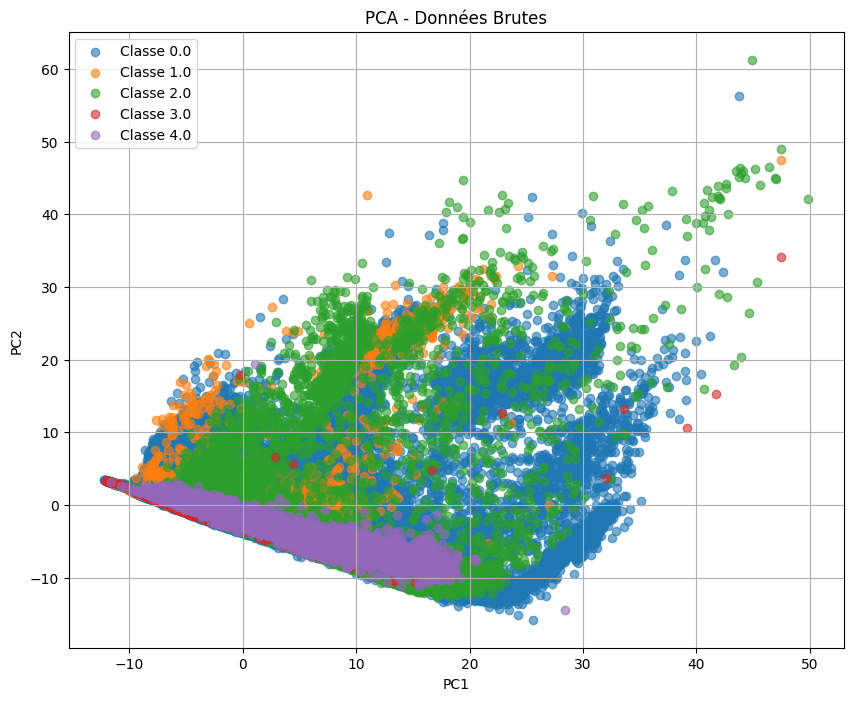

Variance expliquée par les deux premières composantes principales pour Données Brutes :
[0.37102189 0.16067828]
Analyse PCA sur les données nettoyées (longueurs variables) :


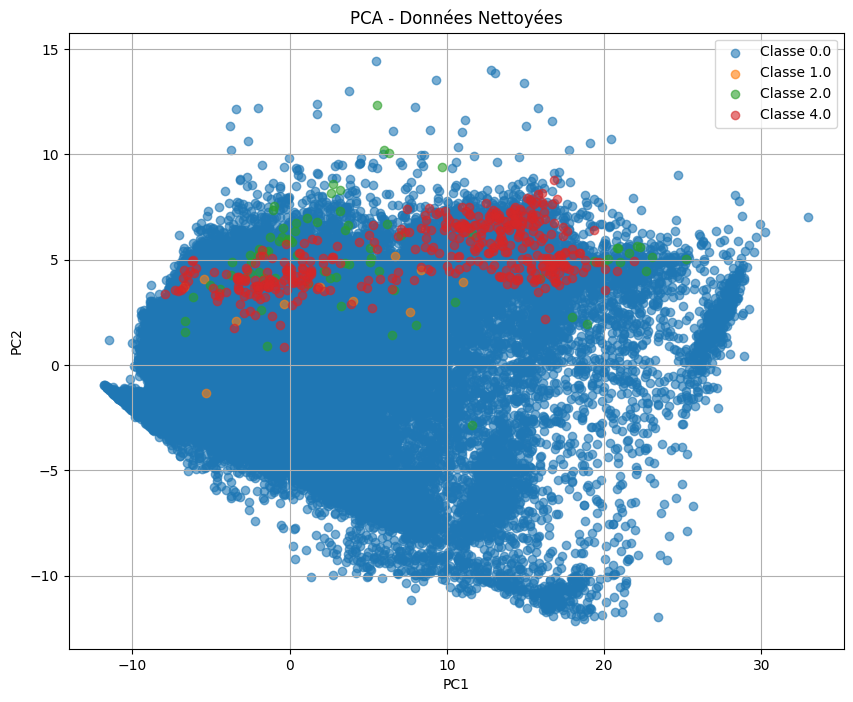

Variance expliquée par les deux premières composantes principales pour Données Nettoyées :
[0.41214843 0.09459382]
Analyse PCA sur les données nettoyées et normalisées (longueur cible de 128) :


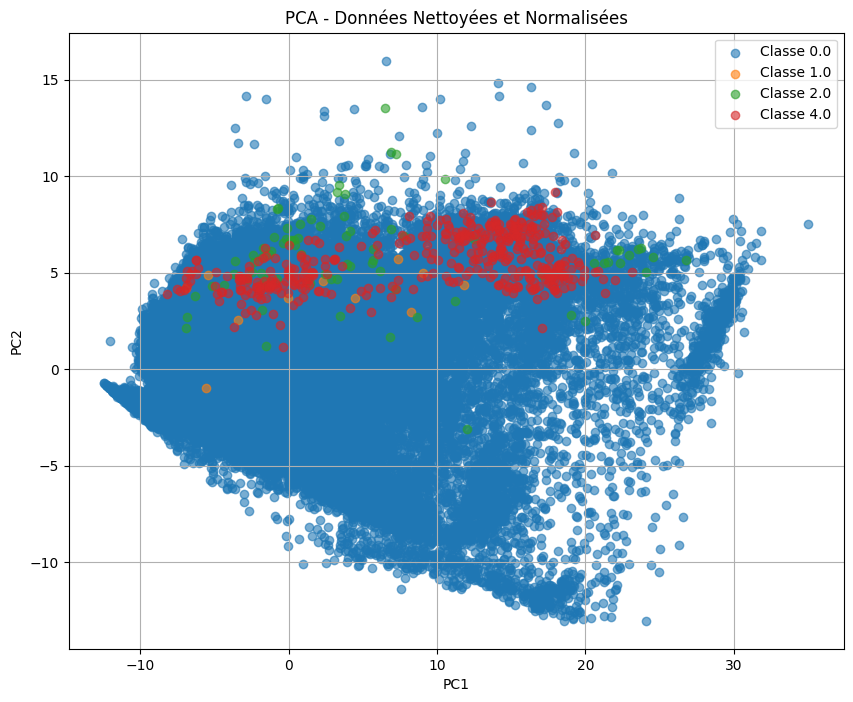

Variance expliquée par les deux premières composantes principales pour Données Nettoyées et Normalisées :
[0.42270179 0.10269251]


In [31]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Charger les données
raw_df = pd.read_csv("Data/mitbih_fus.csv", header=None, sep=",", engine="python", on_bad_lines="skip").fillna(0)
cleaned_df = pd.read_csv("cleaned_mitbih_fus.csv", header=None, sep=",", engine="python", on_bad_lines="skip").fillna(0)

# Fonction pour effectuer une PCA
def preprocess_and_pca(df, title, target_length=None):
    """
    Prépare les données et applique la PCA pour les visualiser.
    """
    # Supprimer les cinq premières colonnes
    df = df.iloc[:, 5:]

    # Normalisation des longueurs des signaux si requis
    if target_length:
        def normalize_signal_length(signal, target_length):
            current_length = len(signal)
            if current_length == target_length:
                return signal
            indices = np.linspace(0, current_length - 1, target_length)
            return np.interp(indices, np.arange(current_length), signal)

        signals = df.iloc[:, :-1].values
        normalized_signals = np.array([normalize_signal_length(signal, target_length) for signal in signals])
    else:
        normalized_signals = df.iloc[:, :-1].values

    # Standardisation des données
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(normalized_signals)

    # Appliquer la PCA
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(features_scaled)

    # Créer un DataFrame pour les composantes principales
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
    pca_df['Groupe'] = df.iloc[:, -1].values

    # Visualiser les composantes principales
    plt.figure(figsize=(10, 8))
    for group in pca_df['Groupe'].unique():
        subset = pca_df[pca_df['Groupe'] == group]
        plt.scatter(subset['PC1'], subset['PC2'], label=f"Classe {group}", alpha=0.6)

    plt.title(f"PCA - {title}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.grid()
    plt.show()

    # Afficher la variance expliquée
    explained_variance = pca.explained_variance_ratio_
    print(f"Variance expliquée par les deux premières composantes principales pour {title} :")
    print(explained_variance)

# PCA sur les données brutes
print("Analyse PCA sur les données brutes :")
preprocess_and_pca(raw_df, "Données Brutes")

# PCA sur les données nettoyées
print("Analyse PCA sur les données nettoyées (longueurs variables) :")
preprocess_and_pca(cleaned_df, "Données Nettoyées")

# PCA sur les données nettoyées et normalisées à une longueur cible
print("Analyse PCA sur les données nettoyées et normalisées (longueur cible de 128) :")
preprocess_and_pca(cleaned_df, "Données Nettoyées et Normalisées", target_length=128)


Analyse PCA sur les données nettoyées simples :


/var/folders/ln/x3t5c28j1zg89syzvlytchzm0000gp/T/ipykernel_76492/3631067980.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  default_colors = plt.cm.get_cmap('tab10')  # Palette automatique pour les autres classes


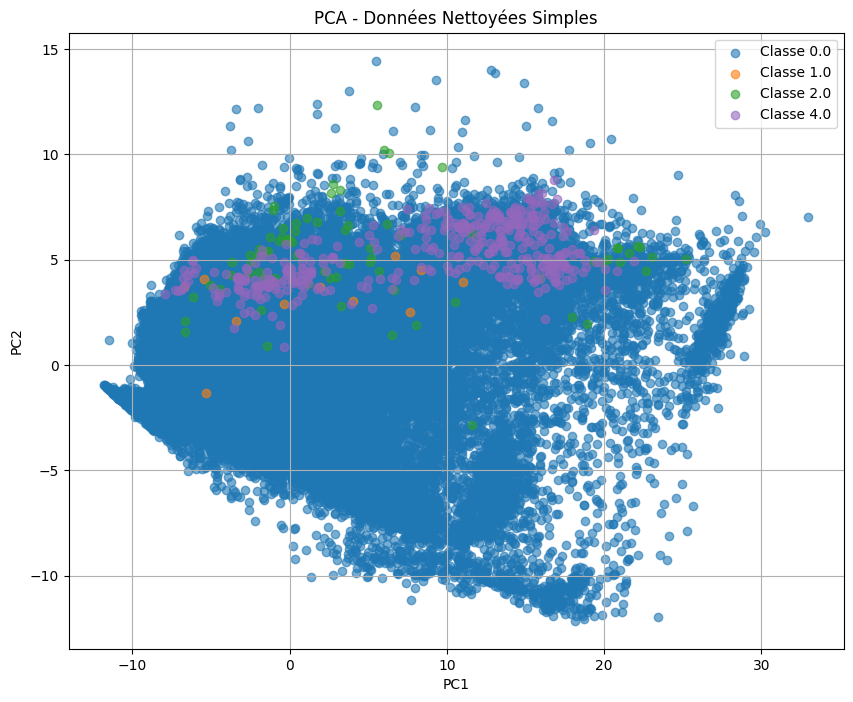

Variance expliquée par les deux premières composantes principales pour Données Nettoyées Simples :
[0.41214843 0.09459382]


In [40]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Charger les données nettoyées
cleaned_df = pd.read_csv("cleaned_mitbih_fus.csv", header=None, sep=",", engine="python", on_bad_lines="skip").fillna(0)

# Fonction pour effectuer une PCA
def perform_pca_on_cleaned_data(df, title):
    """
    Effectue une PCA sur les données nettoyées et visualise les résultats.
    """
    # Supprimer les cinq premières colonnes
    df = df.iloc[:, 5:]
    
    # Standardiser les données
    features = df.iloc[:, :-1].values  # Les colonnes de signaux
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    
    # Appliquer la PCA
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(features_scaled)
    
    # Créer un DataFrame pour les composantes principales
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
    pca_df['Groupe'] = df.iloc[:, -1].values  # Ajouter la colonne groupe
    
    # Définir les couleurs, avec le mauve réservé à la classe 4
    color_map = {4: '#9367bc'}  # Classe 4 en mauve
    default_colors = plt.cm.get_cmap('tab10')  # Palette automatique pour les autres classes
    
    plt.figure(figsize=(10, 8))
    for idx, group in enumerate(pca_df['Groupe'].unique()):
        subset = pca_df[pca_df['Groupe'] == group]
        color = color_map.get(group, default_colors(idx))  # Utilise mauve pour la classe 4, sinon une couleur automatique
        plt.scatter(subset['PC1'], subset['PC2'], label=f"Classe {group}", color=color, alpha=0.6)
    
    plt.title(f"PCA - {title}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.grid()
    plt.show()
    
    # Afficher la variance expliquée
    explained_variance = pca.explained_variance_ratio_
    print(f"Variance expliquée par les deux premières composantes principales pour {title} :")
    print(explained_variance)

# Effectuer la PCA sur les données nettoyées
print("Analyse PCA sur les données nettoyées simples :")
perform_pca_on_cleaned_data(cleaned_df, "Données Nettoyées Simples")


Analyse PCA sur les données nettoyées simples :


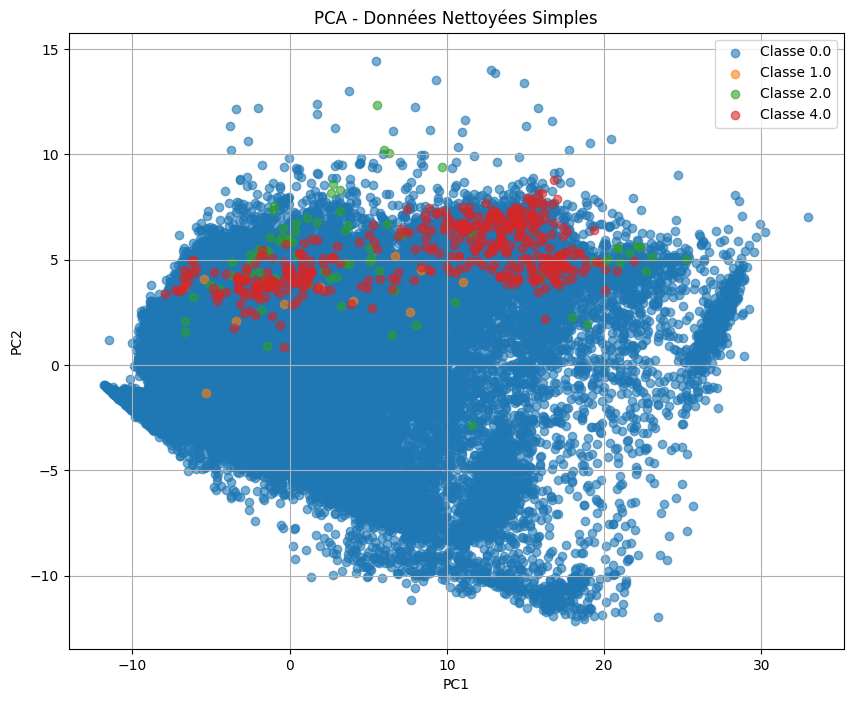

Variance expliquée par les deux premières composantes principales pour Données Nettoyées Simples :
[0.41214843 0.09459382]


In [43]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Charger les données nettoyées
cleaned_df = pd.read_csv("cleaned_mitbih_fus.csv", header=None, sep=",", engine="python", on_bad_lines="skip").fillna(0)

# Supprimer les cinq premières colonnes
cleaned_df = cleaned_df.iloc[:, 5:]

# Fonction pour effectuer une PCA
def perform_pca_on_cleaned_data(df, title):
    """
    Effectue une PCA sur les données nettoyées et visualise les résultats.
    """
    # Standardiser les données
    features = df.iloc[:, :-1].values  # Les colonnes de signaux
    labels = df.iloc[:, -1].values  # Dernière colonne : groupes/classes
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    
    # Appliquer la PCA
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(features_scaled)
    
    # Créer un DataFrame pour les composantes principales
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
    pca_df['Groupe'] = labels
    
    # Visualiser les composantes principales
    plt.figure(figsize=(10, 8))
    for group in pca_df['Groupe'].unique():
        subset = pca_df[pca_df['Groupe'] == group]
        plt.scatter(subset['PC1'], subset['PC2'], label=f"Classe {group}", alpha=0.6)
    
    plt.title(f"PCA - {title}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.grid()
    plt.show()
    
    # Afficher la variance expliquée
    explained_variance = pca.explained_variance_ratio_
    print(f"Variance expliquée par les deux premières composantes principales pour {title} :")
    print(explained_variance)

# Effectuer la PCA sur les données nettoyées
print("Analyse PCA sur les données nettoyées simples :")
perform_pca_on_cleaned_data(cleaned_df, "Données Nettoyées Simples")


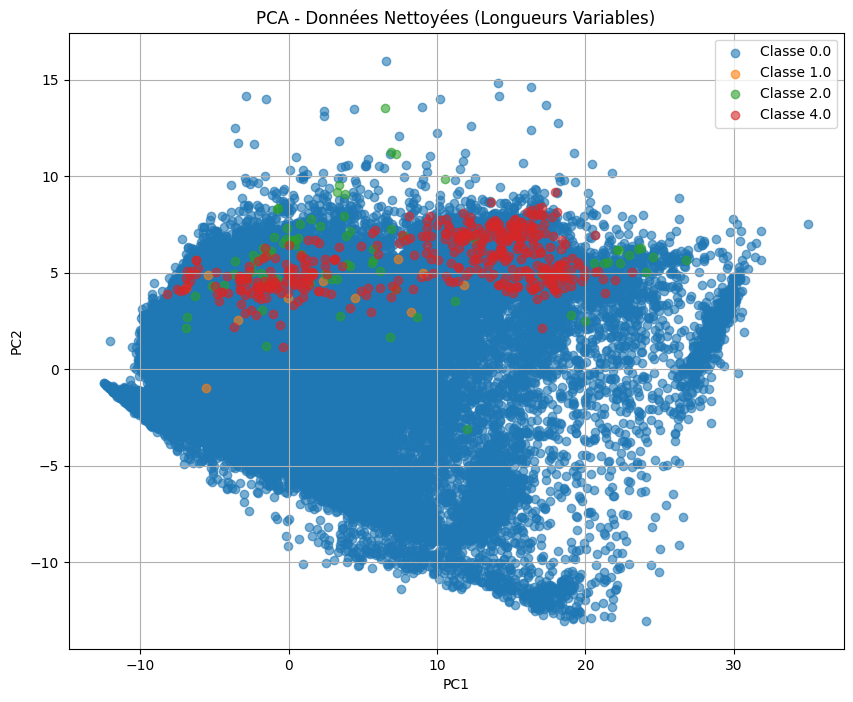

Variance expliquée par les deux premières composantes principales :
[0.42270179 0.10269251]


In [45]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Charger les données nettoyées
cleaned_df = pd.read_csv("cleaned_mitbih_fus.csv", header=None, sep=",", engine="python", on_bad_lines="skip").fillna(0)

# Extraire les signaux et les classes
def extract_signals_and_classes(df):
    """
    Extrait les signaux et les classes des données de longueur variable.
    La classe est toujours la dernière donnée de chaque ligne.
    """
    signals = []
    classes = []
    for _, row in df.iterrows():
        # Convertir la ligne en liste et retirer les zéros de remplissage
        row = row.dropna().values
        signals.append(row[:-1])  # Tous les éléments sauf le dernier (le signal)
        classes.append(row[-1])  # Dernier élément (classe)
    return signals, np.array(classes)

# Supprimer les 5 premières colonnes avant extraction
cleaned_df = cleaned_df.iloc[:, 5:]

# Extraire les signaux et les classes
signals, classes = extract_signals_and_classes(cleaned_df)

# Normaliser les longueurs des signaux pour la PCA
def normalize_signal_length(signals, target_length=128):
    """
    Normalise tous les signaux à une longueur fixe en utilisant l'interpolation.
    """
    normalized_signals = []
    for signal in signals:
        current_length = len(signal)
        if current_length == target_length:
            normalized_signals.append(signal)
        else:
            indices = np.linspace(0, current_length - 1, target_length)
            normalized_signals.append(np.interp(indices, np.arange(current_length), signal))
    return np.array(normalized_signals)

# Fixer la longueur cible des signaux
target_length = 128
normalized_signals = normalize_signal_length(signals, target_length=target_length)

# Standardiser les données
scaler = StandardScaler()
features_scaled = scaler.fit_transform(normalized_signals)

# Appliquer la PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features_scaled)

# Créer un DataFrame pour les composantes principales
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['Groupe'] = classes

# Visualiser les composantes principales
plt.figure(figsize=(10, 8))
for group in np.unique(classes):
    subset = pca_df[pca_df['Groupe'] == group]
    plt.scatter(subset['PC1'], subset['PC2'], label=f"Classe {group}", alpha=0.6)

plt.title("PCA - Données Nettoyées (Longueurs Variables)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.grid()
plt.show()

# Afficher la variance expliquée
explained_variance = pca.explained_variance_ratio_
print("Variance expliquée par les deux premières composantes principales :")
print(explained_variance)


In [46]:
import pandas as pd

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"  # Remplacez par le chemin correct de votre fichier
cleaned_df = pd.read_csv(file_path, header=None, sep=",", engine="python", on_bad_lines="skip")

# Extraire le dernier élément de chaque ligne comme classe
classes = cleaned_df.apply(lambda row: row.dropna().values[-1], axis=1)

# Compter les occurrences de chaque classe
class_counts = classes.value_counts()

# Afficher les résultats
print("Nombre d'occurrences par classe dans le fichier CSV :")
print(class_counts)


Nombre d'occurrences par classe dans le fichier CSV :
0.0    65117
4.0     6765
2.0     4632
1.0     1830
3.0      793
Name: count, dtype: int64


Classes présentes après extraction :
Groupe
0.0    65117
4.0     6765
2.0     4632
1.0     1830
3.0      793
Name: count, dtype: int64


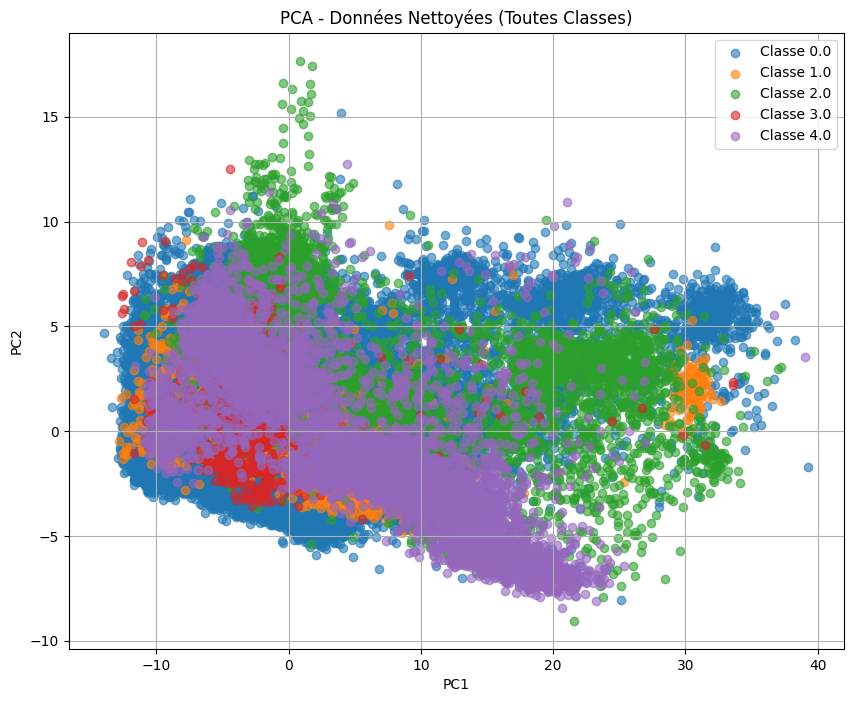

Variance expliquée par les deux premières composantes principales :
[0.63104476 0.06690054]


In [47]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"  # Remplacez par le chemin correct
cleaned_df = pd.read_csv(file_path, header=None, sep=",", engine="python", on_bad_lines="skip")

# Extraire les signaux et les classes
def extract_signals_and_classes(df):
    """
    Extrait les signaux et les classes des données.
    """
    signals = []
    classes = []
    for _, row in df.iterrows():
        row = row.dropna().values
        signals.append(row[:-1])  # Tous les éléments sauf le dernier (signal)
        classes.append(row[-1])  # Dernier élément (classe)
    return signals, np.array(classes)

# Extraire les signaux et classes
signals, classes = extract_signals_and_classes(cleaned_df)

# Normaliser les longueurs des signaux pour la PCA
def normalize_signal_length(signals, target_length=128):
    """
    Normalise tous les signaux à une longueur fixe par interpolation.
    """
    normalized_signals = []
    for signal in signals:
        current_length = len(signal)
        if current_length == target_length:
            normalized_signals.append(signal)
        else:
            indices = np.linspace(0, current_length - 1, target_length)
            normalized_signals.append(np.interp(indices, np.arange(current_length), signal))
    return np.array(normalized_signals)

# Fixer la longueur cible des signaux
target_length = 128
normalized_signals = normalize_signal_length(signals, target_length)

# Standardiser les données
scaler = StandardScaler()
features_scaled = scaler.fit_transform(normalized_signals)

# Appliquer la PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features_scaled)

# Créer un DataFrame pour les composantes principales
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['Groupe'] = classes

# Vérifier que toutes les classes sont incluses
print("Classes présentes après extraction :")
print(pca_df['Groupe'].value_counts())

# Visualiser les composantes principales
plt.figure(figsize=(10, 8))
for group in np.unique(classes):
    subset = pca_df[pca_df['Groupe'] == group]
    plt.scatter(subset['PC1'], subset['PC2'], label=f"Classe {group}", alpha=0.6)

plt.title("PCA - Données Nettoyées (Toutes Classes)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.grid()
plt.show()

# Afficher la variance expliquée
explained_variance = pca.explained_variance_ratio_
print("Variance expliquée par les deux premières composantes principales :")
print(explained_variance)


Classes présentes après extraction :
Groupe
0.0    65117
4.0     6765
2.0     4632
1.0     1830
3.0      793
Name: count, dtype: int64


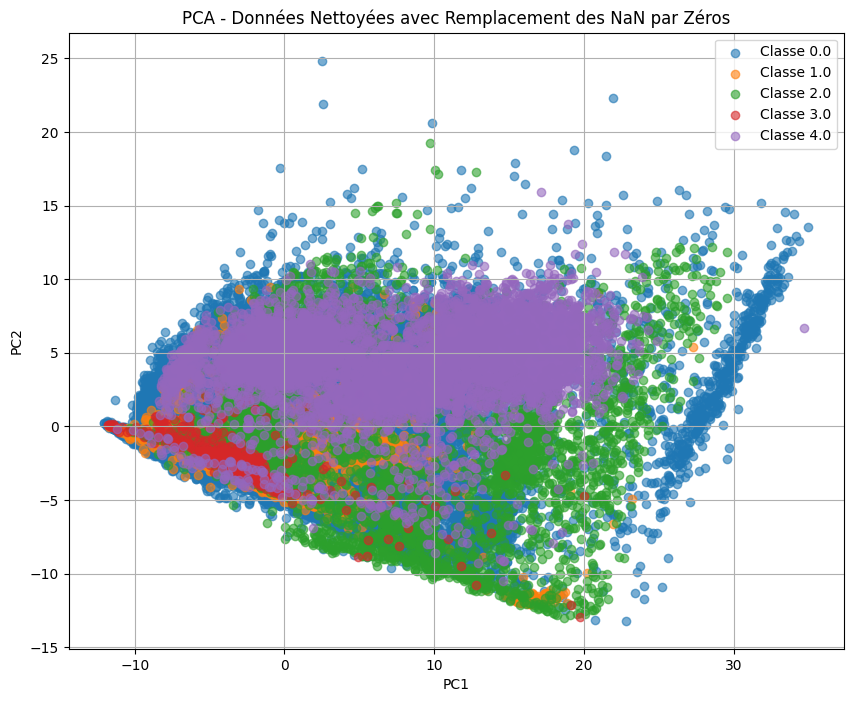

Variance expliquée par les deux premières composantes principales :
[0.42126219 0.11498496]


In [51]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"  # Remplacez par le chemin correct
cleaned_df = pd.read_csv(file_path, header=None, sep=",", engine="python", on_bad_lines="skip")

# Extraire les signaux et les classes
def extract_signals_and_classes(df):
    """
    Extrait les signaux et les classes des données.
    """
    signals = []
    classes = []
    for _, row in df.iterrows():
        row = row.dropna().values
        signals.append(row[:-1])  # Tous les éléments sauf le dernier (signal)
        classes.append(row[-1])  # Dernier élément (classe)
    return signals, np.array(classes)

# Extraire les signaux et classes
signals, classes = extract_signals_and_classes(cleaned_df)

# Normaliser les longueurs des signaux à l'aide de NaN
def pad_signals_with_nan(signals, target_length=128):
    """
    Complète les signaux plus courts avec des NaN et tronque ceux qui sont plus longs.
    """
    padded_signals = []
    for signal in signals:
        current_length = len(signal)
        if current_length > target_length:
            padded_signals.append(signal[:target_length])  # Tronquer si le signal est trop long
        else:
            # Compléter avec des NaN si le signal est trop court
            padded_signals.append(np.concatenate([signal, [np.nan] * (target_length - current_length)]))
    return np.array(padded_signals)

# Fixer la longueur cible des signaux
target_length = 128
padded_signals = pad_signals_with_nan(signals, target_length)

# Remplacer les NaN par des zéros ou des moyennes
signals_no_nan = np.nan_to_num(padded_signals, nan=0.0)  # Remplacer par 0 ou np.nanmean(padded_signals, axis=0)

# Standardiser les données
scaler = StandardScaler()
features_scaled = scaler.fit_transform(signals_no_nan)

# Appliquer la PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features_scaled)

# Créer un DataFrame pour les composantes principales
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['Groupe'] = classes

# Vérifier que toutes les classes sont incluses
print("Classes présentes après extraction :")
print(pca_df['Groupe'].value_counts())

# Visualiser les composantes principales
plt.figure(figsize=(10, 8))
for group in np.unique(classes):
    subset = pca_df[pca_df['Groupe'] == group]
    plt.scatter(subset['PC1'], subset['PC2'], label=f"Classe {group}", alpha=0.6)

plt.title("PCA - Données Nettoyées avec Remplacement des NaN par Zéros")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.grid()
plt.show()

# Afficher la variance expliquée
explained_variance = pca.explained_variance_ratio_
print("Variance expliquée par les deux premières composantes principales :")
print(explained_variance)


Variance expliquée par les quatre premières composantes principales :
PC1: 0.6310, PC2: 0.0669, PC3: 0.0580, PC4: 0.0387


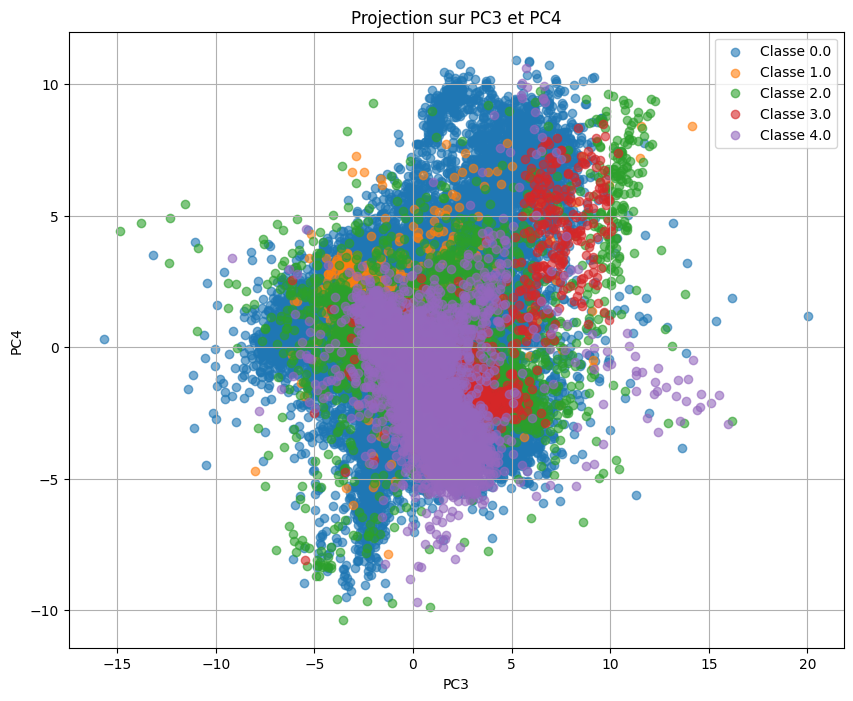

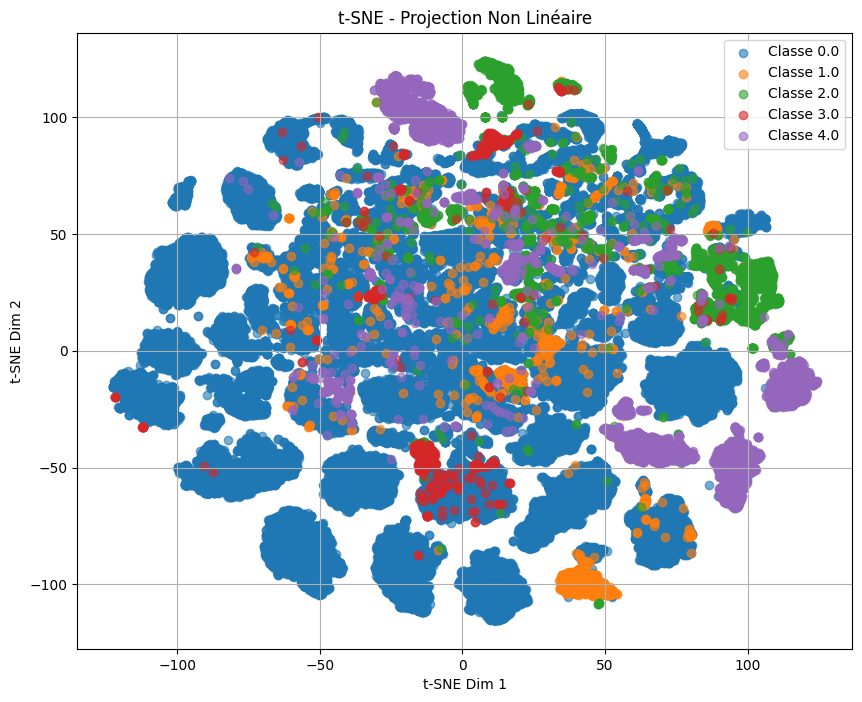

/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/e.x.coco/Library/Python/3.9/lib/python/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


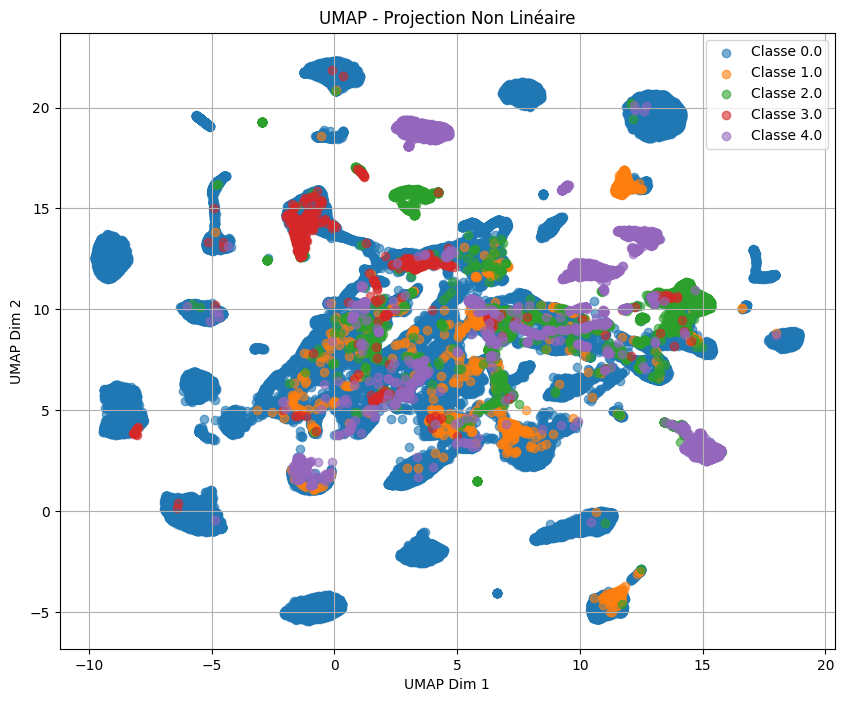

Contributions des variables initiales à PC1 et PC2 :
     Signal_1  Signal_2  Signal_3  Signal_4  Signal_5  Signal_6  Signal_7  \
PC1 -0.058286 -0.035124 -0.000987  0.016670  0.025086  0.028274  0.037761   
PC2 -0.037105 -0.018376  0.048906  0.103831  0.147458  0.188918  0.212216   

     Signal_8  Signal_9  Signal_10  ...  Signal_119  Signal_120  Signal_121  \
PC1  0.047933  0.058056   0.067871  ...    0.074120    0.078364    0.081449   
PC2  0.218705  0.211470   0.193468  ...    0.162725    0.143284    0.126243   

     Signal_122  Signal_123  Signal_124  Signal_125  Signal_126  Signal_127  \
PC1    0.085124    0.088863    0.091819    0.093763    0.095131    0.095931   
PC2    0.107706    0.089571    0.074641    0.062435    0.052708    0.045224   

     Signal_128  
PC1    0.096225  
PC2    0.039164  

[2 rows x 128 columns]


In [52]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Charger les données nettoyées
file_path = "cleaned_mitbih_fus.csv"  # Remplacez par le chemin correct
cleaned_df = pd.read_csv(file_path, header=None, sep=",", engine="python", on_bad_lines="skip")

# Extraire les signaux et les classes
def extract_signals_and_classes(df):
    """
    Extrait les signaux et les classes des données.
    """
    signals = []
    classes = []
    for _, row in df.iterrows():
        row = row.dropna().values
        signals.append(row[:-1])  # Tous les éléments sauf le dernier (signal)
        classes.append(row[-1])  # Dernier élément (classe)
    return signals, np.array(classes)

# Extraire les signaux et classes
signals, classes = extract_signals_and_classes(cleaned_df)

# Normaliser les longueurs des signaux à une longueur fixe
def normalize_signal_length(signals, target_length=128):
    """
    Normalise tous les signaux à une longueur fixe par interpolation.
    """
    normalized_signals = []
    for signal in signals:
        current_length = len(signal)
        if current_length > target_length:
            normalized_signals.append(signal[:target_length])
        else:
            indices = np.linspace(0, current_length - 1, target_length)
            normalized_signals.append(np.interp(indices, np.arange(current_length), signal))
    return np.array(normalized_signals)

# Fixer la longueur cible des signaux
target_length = 128
normalized_signals = normalize_signal_length(signals, target_length)

# Standardiser les données
scaler = StandardScaler()
features_scaled = scaler.fit_transform(normalized_signals)

# Appliquer la PCA avec 4 composantes
pca = PCA(n_components=4)
pca_components = pca.fit_transform(features_scaled)

# Afficher la variance expliquée par PC3 et PC4
explained_variance = pca.explained_variance_ratio_
print("Variance expliquée par les quatre premières composantes principales :")
print(f"PC1: {explained_variance[0]:.4f}, PC2: {explained_variance[1]:.4f}, PC3: {explained_variance[2]:.4f}, PC4: {explained_variance[3]:.4f}")

# Visualisation de PC3 et PC4
pca_df = pd.DataFrame(data=pca_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df['Groupe'] = classes

plt.figure(figsize=(10, 8))
for group in np.unique(classes):
    subset = pca_df[pca_df['Groupe'] == group]
    plt.scatter(subset['PC3'], subset['PC4'], label=f"Classe {group}", alpha=0.6)
plt.title("Projection sur PC3 et PC4")
plt.xlabel("PC3")
plt.ylabel("PC4")
plt.legend()
plt.grid()
plt.show()

# Appliquer t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_components = tsne.fit_transform(features_scaled)

plt.figure(figsize=(10, 8))
for group in np.unique(classes):
    subset = tsne_components[classes == group]
    plt.scatter(subset[:, 0], subset[:, 1], label=f"Classe {group}", alpha=0.6)
plt.title("t-SNE - Projection Non Linéaire")
plt.xlabel("t-SNE Dim 1")
plt.ylabel("t-SNE Dim 2")
plt.legend()
plt.grid()
plt.show()

# Appliquer UMAP (nécessite l'installation de umap-learn)
try:
    import umap
    umap_model = umap.UMAP(n_components=2, random_state=42)
    umap_components = umap_model.fit_transform(features_scaled)

    plt.figure(figsize=(10, 8))
    for group in np.unique(classes):
        subset = umap_components[classes == group]
        plt.scatter(subset[:, 0], subset[:, 1], label=f"Classe {group}", alpha=0.6)
    plt.title("UMAP - Projection Non Linéaire")
    plt.xlabel("UMAP Dim 1")
    plt.ylabel("UMAP Dim 2")
    plt.legend()
    plt.grid()
    plt.show()
except ImportError:
    print("UMAP n'est pas installé. Veuillez exécuter 'pip install umap-learn' pour l'utiliser.")

# Étudier les contributions des variables initiales à PC1 et PC2 (loadings)
loadings = pd.DataFrame(pca.components_, columns=[f"Signal_{i+1}" for i in range(features_scaled.shape[1])], index=['PC1', 'PC2', 'PC3', 'PC4'])
print("Contributions des variables initiales à PC1 et PC2 :")
print(loadings.loc[['PC1', 'PC2']])


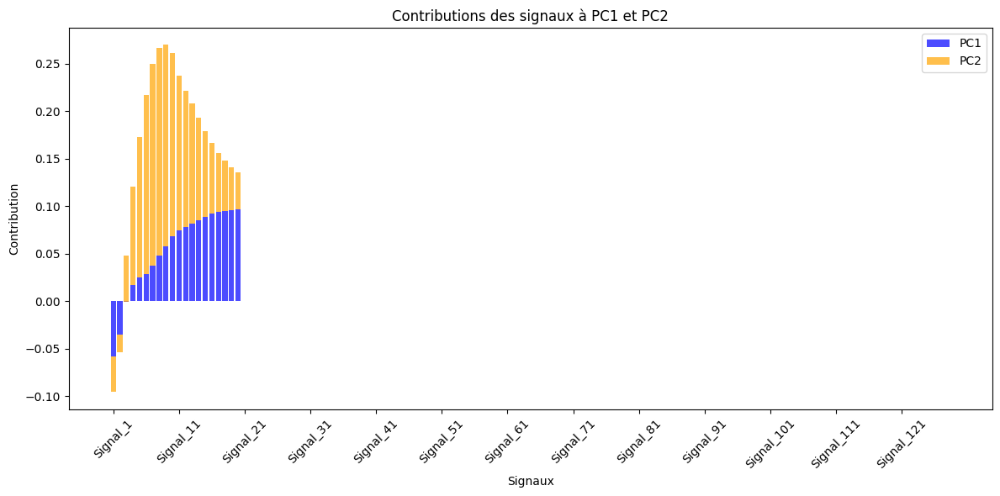

In [57]:
import matplotlib.pyplot as plt
import pandas as pd

# Contributions des signaux (remplacez avec vos données complètes)
loadings = pd.DataFrame({
    "Signal": [f"Signal_{i+1}" for i in range(128)],
    "PC1": [-0.058286, -0.035124, -0.000987, 0.016670, 0.025086, 0.028274, 0.037761,
            0.047933, 0.058056, 0.067871, 0.074120, 0.078364, 0.081449, 0.085124,
            0.088863, 0.091819, 0.093763, 0.095131, 0.095931, 0.096225] + [0]*108,
    "PC2": [-0.037105, -0.018376, 0.048906, 0.103831, 0.147458, 0.188918, 0.212216,
            0.218705, 0.211470, 0.193468, 0.162725, 0.143284, 0.126243, 0.107706,
            0.089571, 0.074641, 0.062435, 0.052708, 0.045224, 0.039164] + [0]*108,
})

# Créer le graphique de barres empilées
plt.figure(figsize=(12, 6))
plt.bar(loadings["Signal"], loadings["PC1"], alpha=0.7, label="PC1", color='blue')
plt.bar(loadings["Signal"], loadings["PC2"], alpha=0.7, label="PC2", color='orange', bottom=loadings["PC1"])
plt.xticks(range(0, len(loadings["Signal"]), 10), rotation=45)  # Limiter les ticks pour la lisibilité
plt.title("Contributions des signaux à PC1 et PC2")
plt.xlabel("Signaux")
plt.ylabel("Contribution")
plt.legend()
plt.tight_layout()
plt.show()
